In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [3]:
import display
import dataloader
from dataloader import ThermalData
import clustering
import anomaly_detection

画像データの取得

In [4]:
thermal_img_files = dataloader.get_img_files(dir_path="./images/modules",gray=False)
thermal_img_files_gray = dataloader.get_img_files(dir_path="./images/modules",gray=True)

In [5]:
type(thermal_img_files), len(thermal_img_files)

(dict, 158)

温度データの取得

In [6]:
data = ThermalData(thermal_img_files)

温度分布の確認（個別）

温度分布の確認

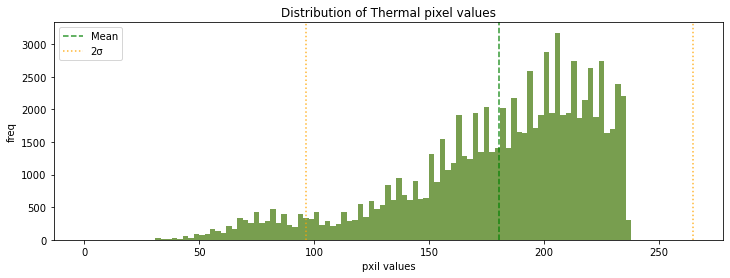

In [7]:
display.display_distributions(data.all_temperature, 
                              filepath = "hist_all_temperature.jpg")

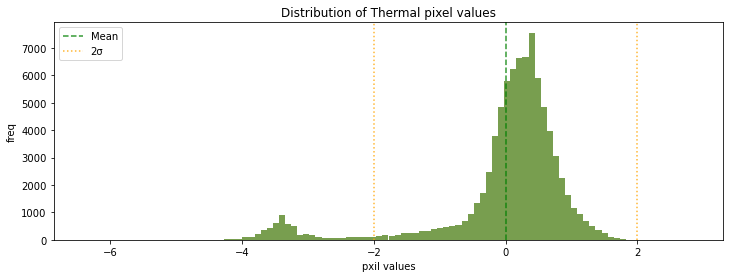

In [8]:
display.display_distributions(data.scaled_all_temperature,
                              filepath = "hist_scaled_all_temperature.jpg")

クラスタ分類モデルの作成

In [9]:
gmm1 = anomaly_detection.AnoGMM(data.all_temperature)
gmm2 = anomaly_detection.AnoGMM(data.scaled_all_temperature)

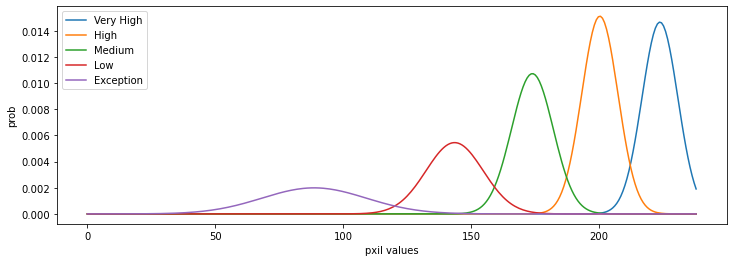

In [10]:
gmm1.display()

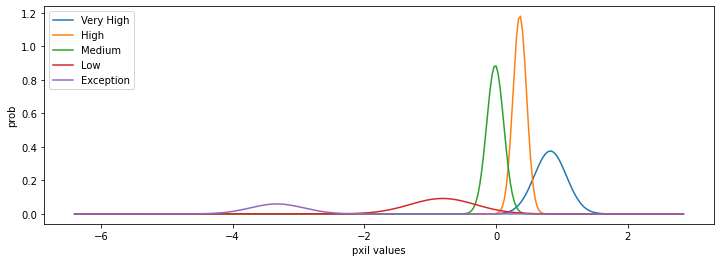

In [11]:
gmm2.display()

個別画像の分析

In [12]:
input_file = "72.jpg"
#input_file = "12.jpg"
#input_file = "126.jpg"
#input_file = "130.jpg"
#input_file = "176.jpg"

ピクセルのクラスタリング（by 温度＆位置）

In [13]:
clusters = clustering.TemperatureClusters(data.scaled_temperature_with_index[input_file], n_clusters=8)

In [14]:
clusters_temperature = clusters.get_clusters_data(data.temperature[input_file])
centers_temperature = np.stack([np.uint8(t.mean(axis=0)) for t in clusters_temperature])

In [15]:
scaled_clusters_temperature = clusters.get_clusters_data(data.scaled_temperature[input_file])
scaled_centers_temperature = np.stack([t.mean(axis=0) for t in scaled_clusters_temperature ])

クラスタリング結果の表示

In [16]:
img_clustered = centers_temperature[clusters.labels]
img_clustered = img_clustered.reshape(thermal_img_files[input_file].shape)

In [17]:
import matplotlib.cm as cm
from sklearn import preprocessing
mscaler = preprocessing.MinMaxScaler()
colors = cm.viridis(clusters.labels)[:, :3]
img_colored = np.uint8(mscaler.fit_transform(colors) * 255)
img_colored = img_colored.reshape(thermal_img_files[input_file].shape)
img_colored  = cv2.cvtColor(img_colored, cv2.COLOR_BGR2GRAY)

In [18]:
mask = data.scaled_temperature[input_file] > -2
mask = mask.reshape(thermal_img_files[input_file].shape)

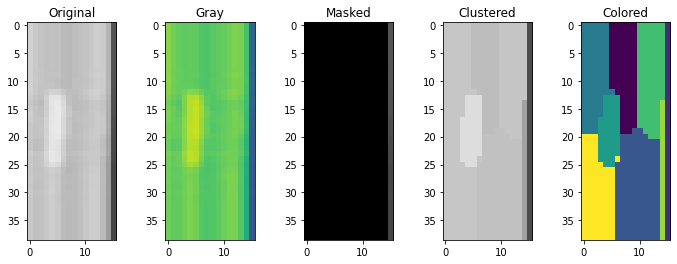

In [19]:
display.display_modules({
    "Original": thermal_img_files[input_file], 
    "Gray": thermal_img_files_gray[input_file],
    "Masked": (thermal_img_files[input_file]*~mask),
    "Clustered": img_clustered,
    "Colored": img_colored,
})

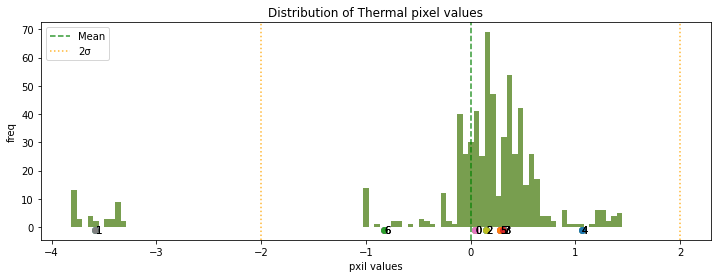

In [20]:
display.display_distributions(data.scaled_temperature[input_file], 
                              filepath = "test.jpg", cluster_centers = clusters.centers[:, :3])

クラスタの分類&異常タイプの特定

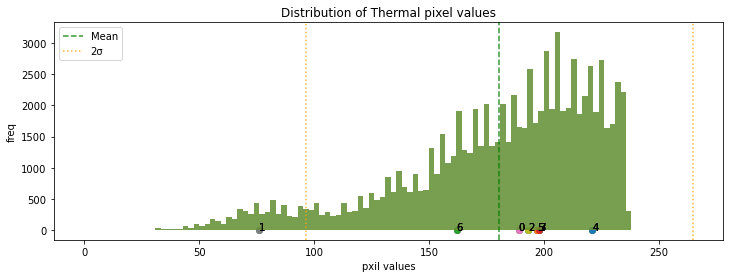

In [21]:
display.display_distributions(data.all_temperature, 
                              filepath = "test.jpg", cluster_centers = centers_temperature)

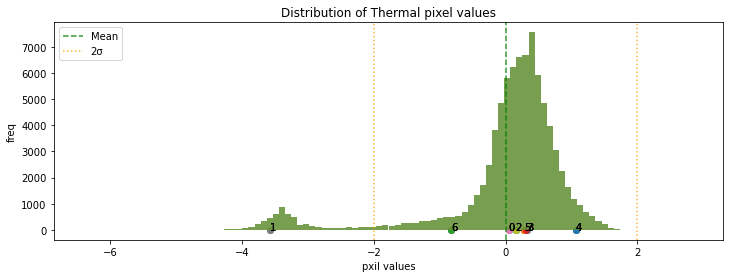

In [22]:
display.display_distributions(data.scaled_all_temperature, 
                              filepath = "test.jpg", cluster_centers = scaled_centers_temperature)

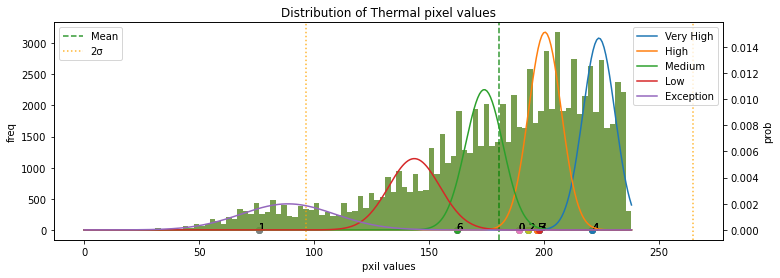

In [23]:
display.display_distributions(data.all_temperature, 
                              filepath = "test.jpg", cluster_centers = centers_temperature, gmm=gmm1)

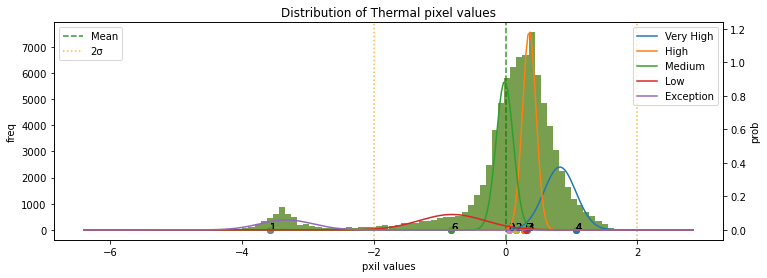

In [24]:
display.display_distributions(data.scaled_all_temperature, 
                              filepath = "test.jpg", cluster_centers = scaled_centers_temperature, gmm=gmm2)

In [25]:
predicted_classes1 = gmm1.predict(centers_temperature)
predicted_classes2 = gmm2.predict(scaled_centers_temperature)
cluster_types1 = np.array([ gmm1.index2class[c] for c in predicted_classes1 ])
cluster_types2 = np.array([ gmm2.index2class[c] for c in predicted_classes2])
hot_clusters = (cluster_types1 == "Very High") & (cluster_types2 == "Very High")
hot_pixels1 = np.array([ gmm1.index2class[c] =="Very High" for c in predicted_classes1[clusters.labels] ])    
hot_pixels2 = np.array([ gmm2.index2class[c] =="Very High" for c in predicted_classes2[clusters.labels] ])    
hot_pixels = hot_pixels1 * hot_pixels2
hot_pixels = hot_pixels.reshape(*thermal_img_files[input_file].shape[:2],1)
module_type = anomaly_detection.detect_module_type(hot_clusters, hot_pixels)

In [26]:
#print("predicted_classses1:",predicted_classes1)
#print("predicted_classses2:",predicted_classes2)
print("cluster_types1:",cluster_types1)
print("cluster_types2:",cluster_types2)
print("Hotspot weight:", hot_pixels .mean())
print("Module type:", module_type)

cluster_types1: ['High' 'Exception' 'High' 'High' 'Very High' 'High' 'Medium' 'High']
cluster_types2: ['Medium' 'Exception' 'Medium' 'High' 'Very High' 'High' 'Low' 'High']
Hotspot weight: 0.07211538461538461
Module type: Single-Hotspot


異常タイプの確認テスト

In [27]:
anomaly_modules = {}

******* start *******
63.jpg
Module type: Normal
Cluster types1: ['Medium' 'High' 'Medium' 'Exception' 'High' 'High' 'High' 'Medium']
Cluster types2: ['Medium' 'High' 'Medium' 'Exception' 'High' 'Very High' 'High' 'Medium']
Hotspot weights: 0.0


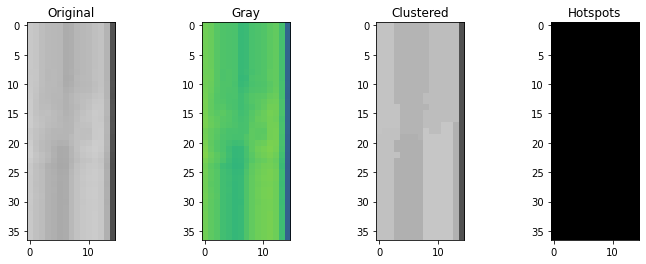

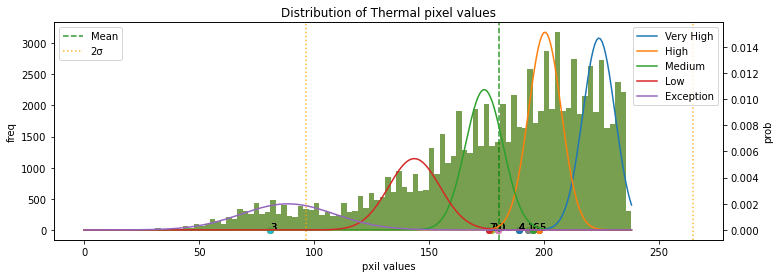

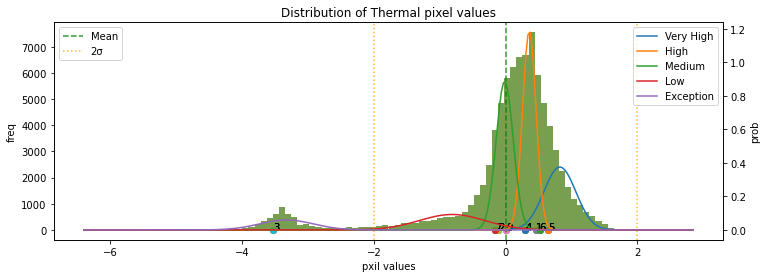

******* end *******
******* start *******
189.jpg
Module type: Normal
Cluster types1: ['Very High' 'Exception' 'Very High' 'Very High' 'High' 'Very High'
 'Very High' 'Very High']
Cluster types2: ['High' 'Exception' 'High' 'High' 'Low' 'High' 'High' 'High']
Hotspot weights: 0.0


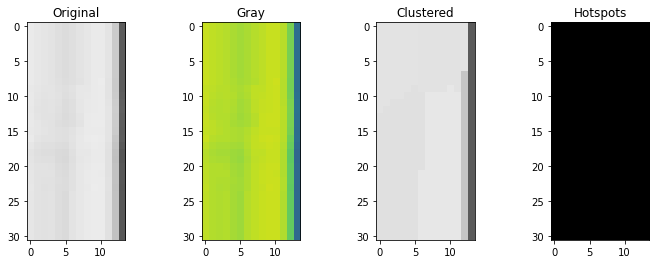

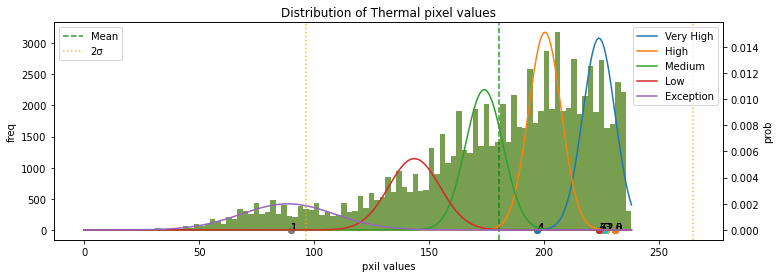

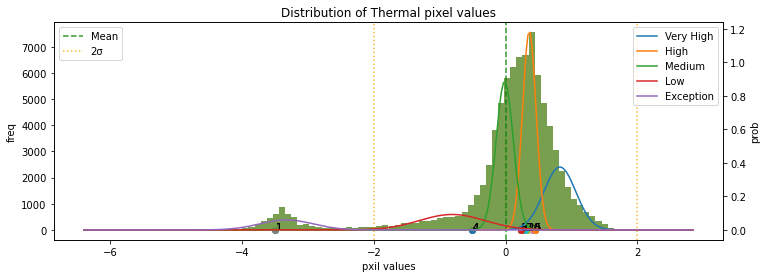

******* end *******
******* start *******
77.jpg
Module type: Normal
Cluster types1: ['Low' 'Medium' 'Exception' 'Medium' 'Low' 'Low' 'Low' 'Medium']
Cluster types2: ['Low' 'Very High' 'Exception' 'Very High' 'Medium' 'Medium' 'Low' 'High']
Hotspot weights: 0.0


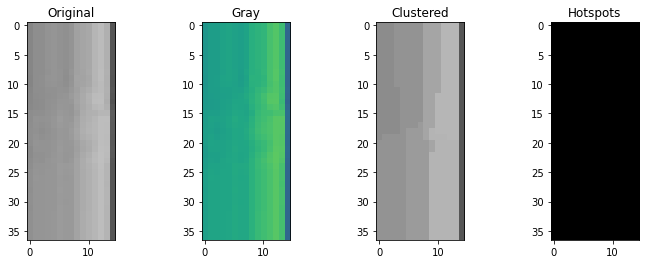

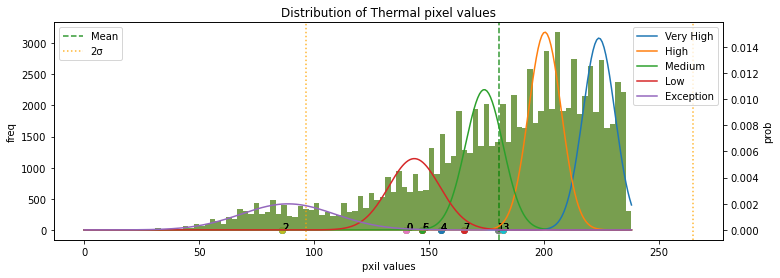

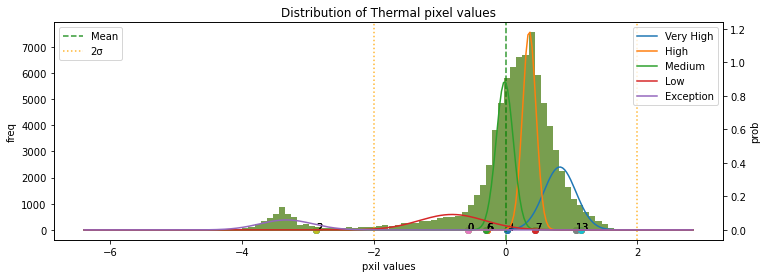

******* end *******
******* start *******
162.jpg
Module type: Single-Hotspot
Cluster types1: ['Low' 'High' 'Medium' 'Medium' 'Very High' 'Exception' 'Medium' 'Low']
Cluster types2: ['Low' 'Very High' 'Low' 'Medium' 'Very High' 'Exception' 'High' 'Low']
Hotspot weights: 0.15953947368421054


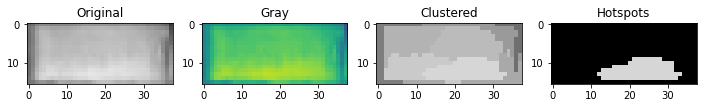

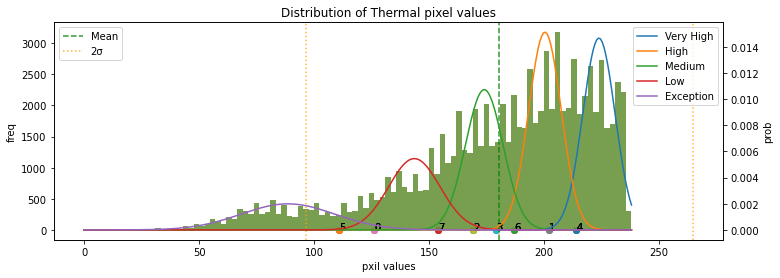

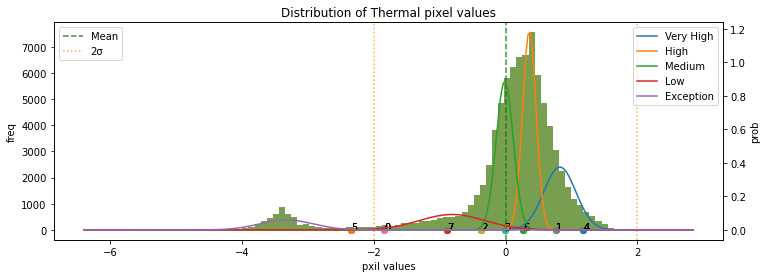

******* end *******
******* start *******
176.jpg
Module type: Normal
Cluster types1: ['Medium' 'Very High' 'Very High' 'Exception' 'Exception' 'High' 'Medium'
 'Very High']
Cluster types2: ['Low' 'High' 'High' 'Exception' 'Exception' 'High' 'Low' 'High']
Hotspot weights: 0.0


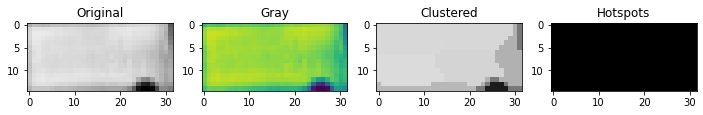

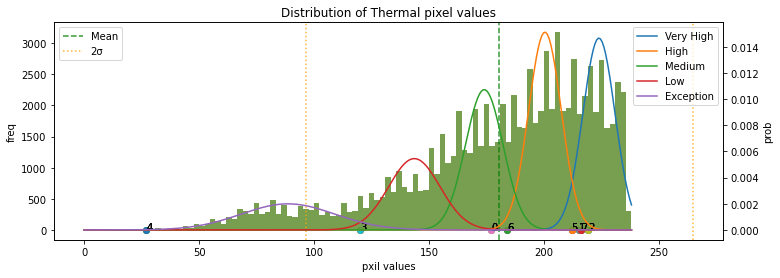

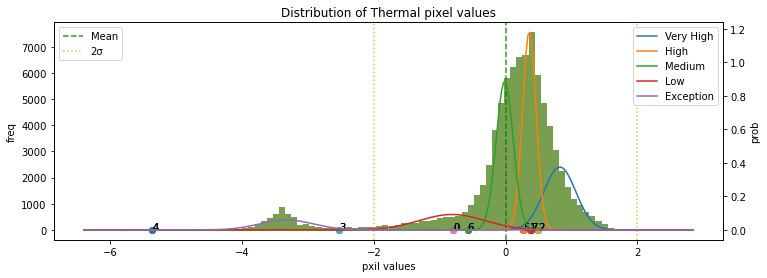

******* end *******
******* start *******
88.jpg
Module type: Normal
Cluster types1: ['Medium' 'Exception' 'Medium' 'Exception' 'Medium' 'High' 'Exception'
 'Low']
Cluster types2: ['Very High' 'Low' 'Medium' 'Low' 'Medium' 'Very High' 'Low' 'Low']
Hotspot weights: 0.0


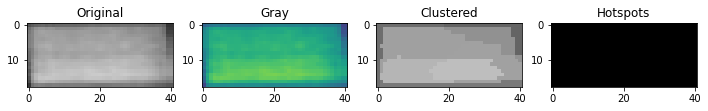

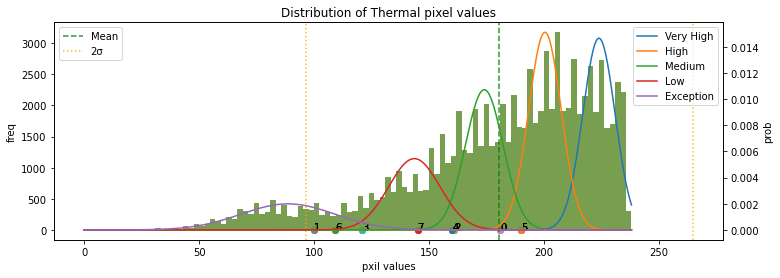

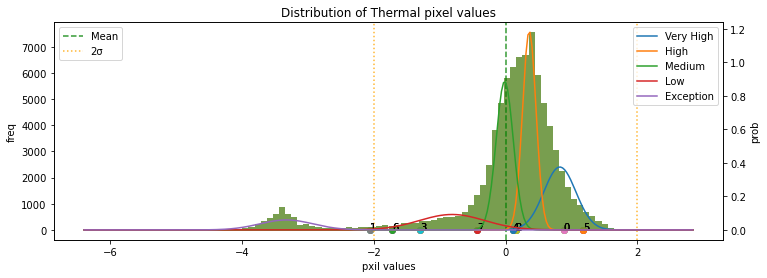

******* end *******
******* start *******
200.jpg
Module type: Normal
Cluster types1: ['Very High' 'Exception' 'Very High' 'Very High' 'Very High' 'Very High'
 'High' 'Very High']
Cluster types2: ['Medium' 'Exception' 'High' 'High' 'High' 'Medium' 'Low' 'High']
Hotspot weights: 0.0


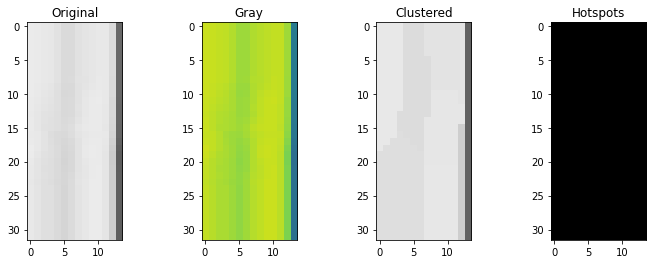

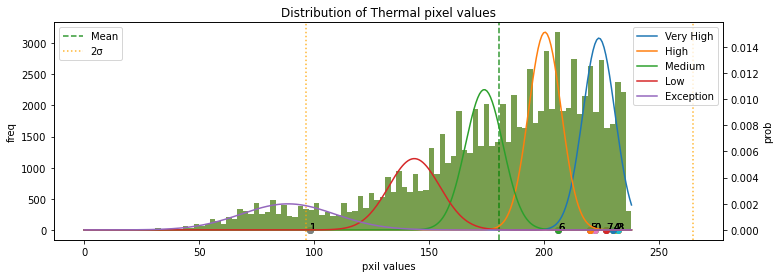

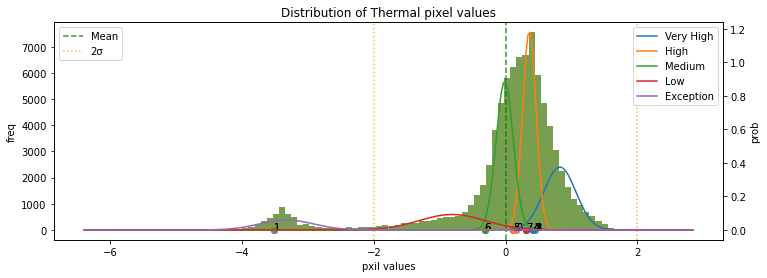

******* end *******
******* start *******
201.jpg
Module type: Normal
Cluster types1: ['Very High' 'Exception' 'Very High' 'Very High' 'Exception' 'High'
 'Very High' 'Very High']
Cluster types2: ['High' 'Exception' 'High' 'High' 'Exception' 'Low' 'High' 'High']
Hotspot weights: 0.0


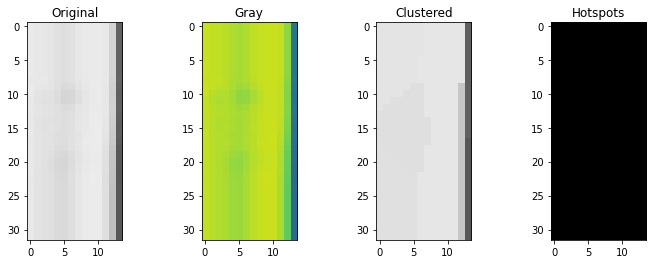

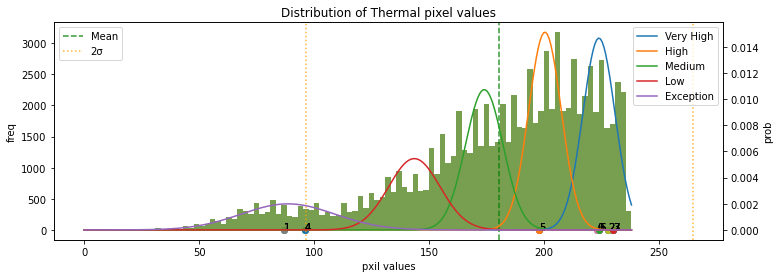

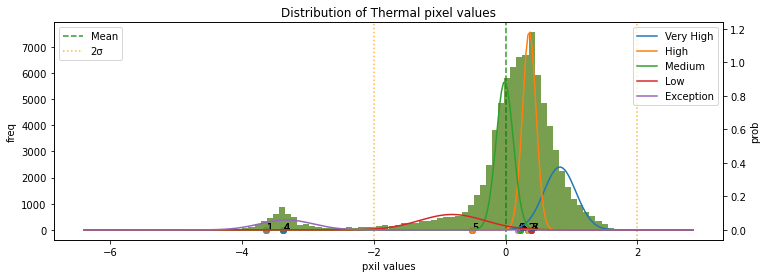

******* end *******
******* start *******
188.jpg
Module type: Normal
Cluster types1: ['Medium' 'Very High' 'High' 'Exception' 'Very High' 'Very High'
 'Very High' 'Exception']
Cluster types2: ['Low' 'High' 'Medium' 'Exception' 'High' 'High' 'High' 'Exception']
Hotspot weights: 0.0


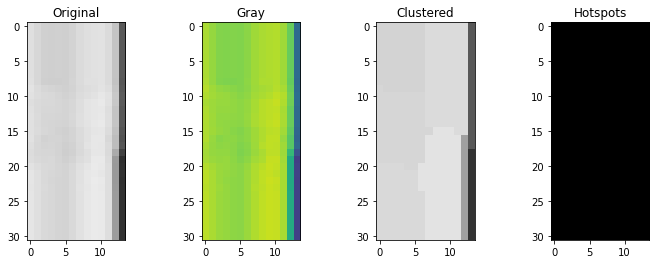

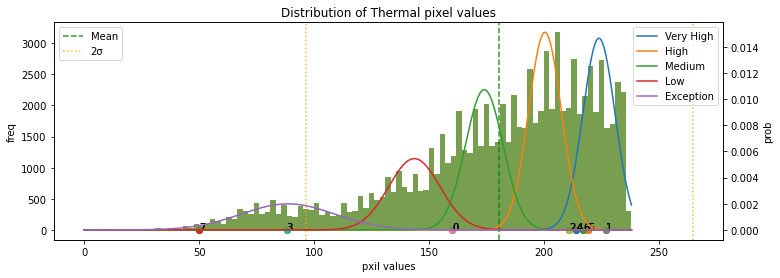

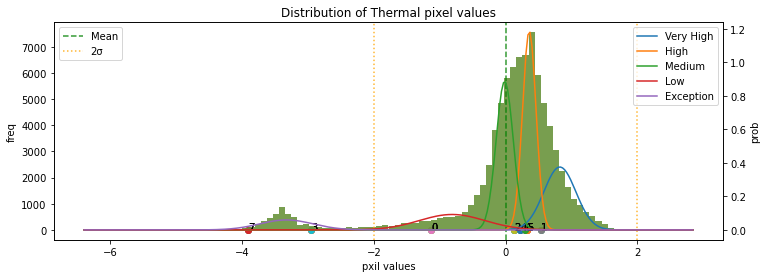

******* end *******
******* start *******
76.jpg
Module type: Normal
Cluster types1: ['Low' 'Medium' 'Exception' 'Low' 'Low' 'Medium' 'Low' 'Low']
Cluster types2: ['Low' 'Very High' 'Exception' 'High' 'Medium' 'Very High' 'Medium' 'Low']
Hotspot weights: 0.0


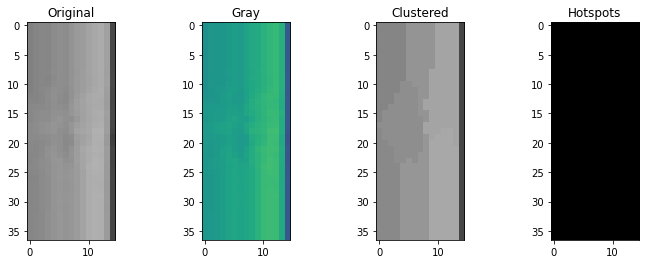

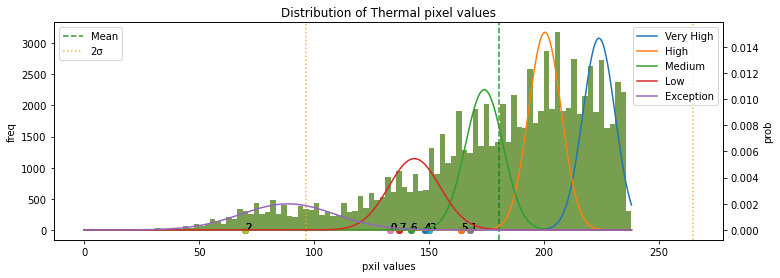

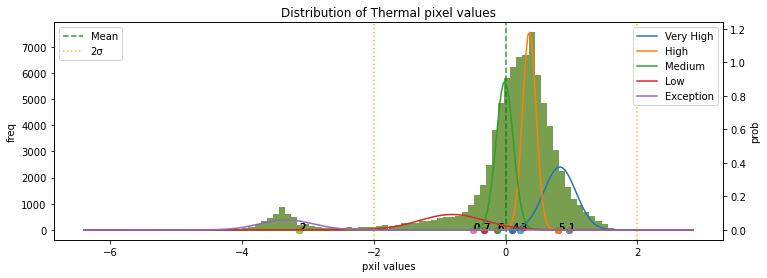

******* end *******
******* start *******
62.jpg
Module type: Normal
Cluster types1: ['Medium' 'Exception' 'Medium' 'Medium' 'Medium' 'Medium' 'Medium' 'High']
Cluster types2: ['Medium' 'Exception' 'Very High' 'Medium' 'High' 'Medium' 'High'
 'Very High']
Hotspot weights: 0.0


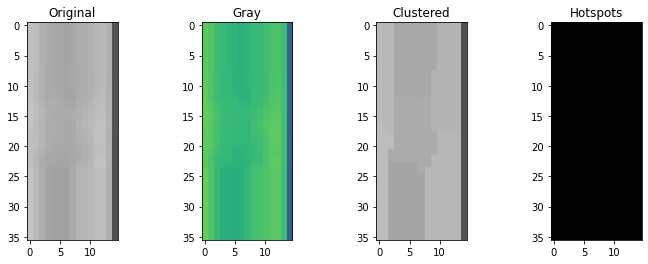

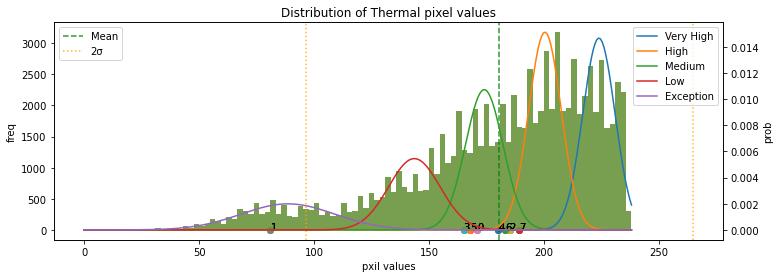

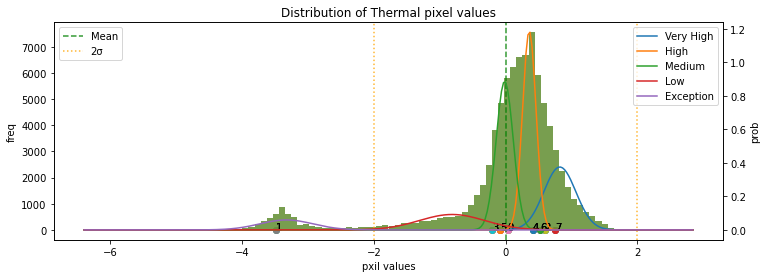

******* end *******
******* start *******
74.jpg
Module type: Normal
Cluster types1: ['Low' 'Exception' 'Low' 'Medium' 'Low' 'Low' 'Low' 'Exception']
Cluster types2: ['Medium' 'Exception' 'Very High' 'Very High' 'Medium' 'High' 'Medium'
 'Low']
Hotspot weights: 0.0


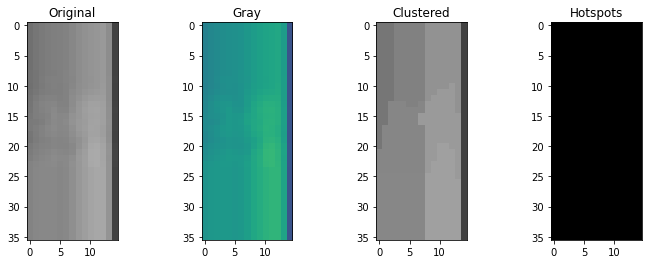

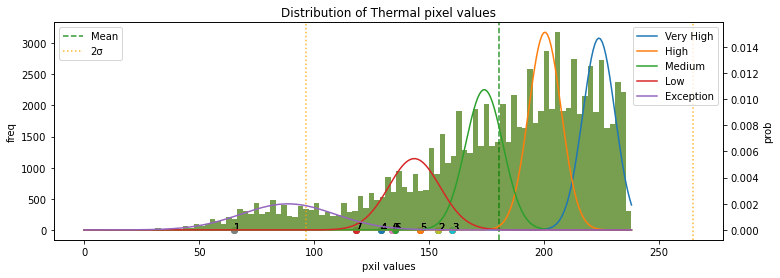

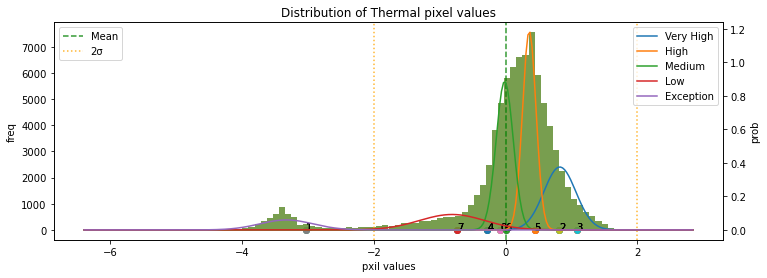

******* end *******
******* start *******
60.jpg
Module type: Normal
Cluster types1: ['Medium' 'Exception' 'Medium' 'Medium' 'Low' 'Medium' 'Low' 'Medium']
Cluster types2: ['High' 'Exception' 'High' 'High' 'Medium' 'Medium' 'Medium' 'Very High']
Hotspot weights: 0.0


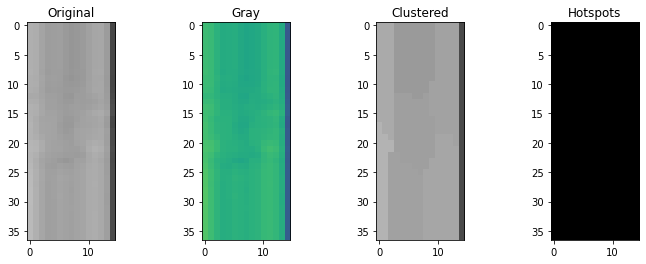

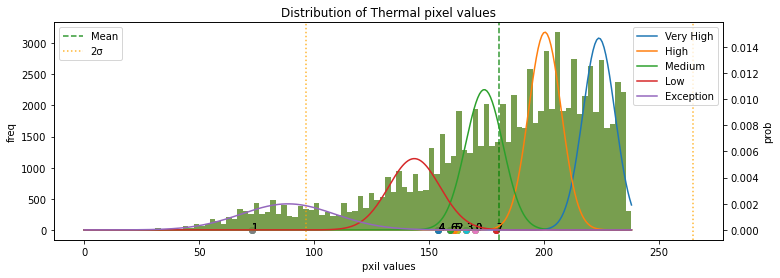

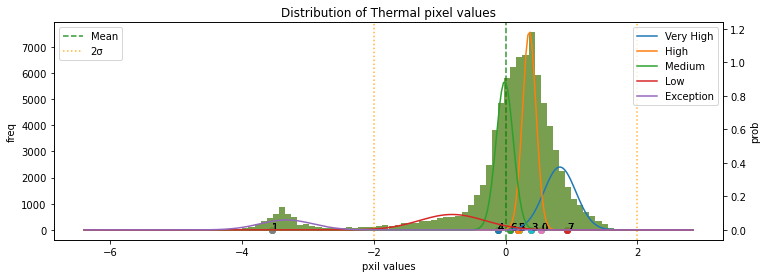

******* end *******
******* start *******
48.jpg
Module type: Normal
Cluster types1: ['Medium' 'Medium' 'Exception' 'High' 'Medium' 'High' 'Medium' 'High']
Cluster types2: ['Medium' 'Medium' 'Exception' 'Very High' 'Medium' 'High' 'Medium' 'High']
Hotspot weights: 0.0


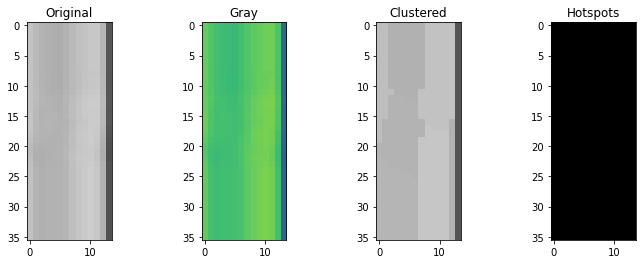

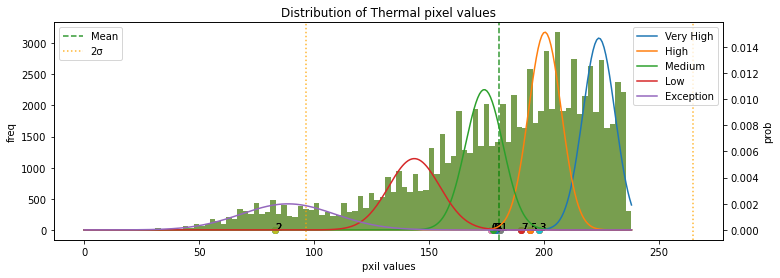

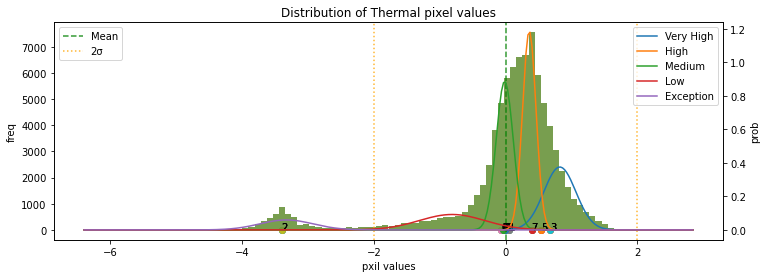

******* end *******
******* start *******
149.jpg
Module type: Multi-Hotspots
Cluster types1: ['High' 'High' 'Very High' 'Exception' 'Very High' 'Very High' 'Medium'
 'Very High']
Cluster types2: ['Medium' 'Medium' 'Very High' 'Exception' 'High' 'Very High' 'Low' 'High']
Hotspot weights: 0.28703703703703703


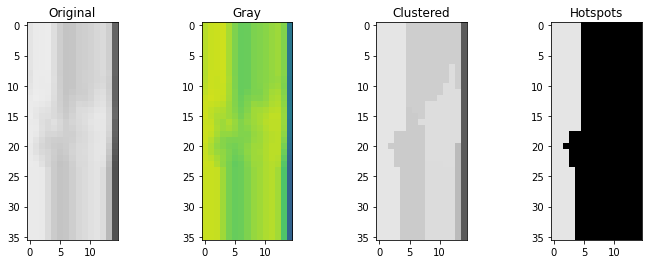

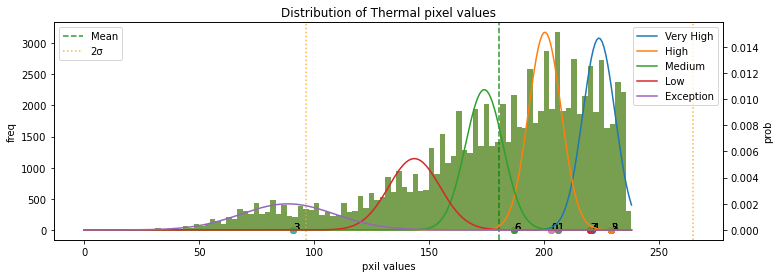

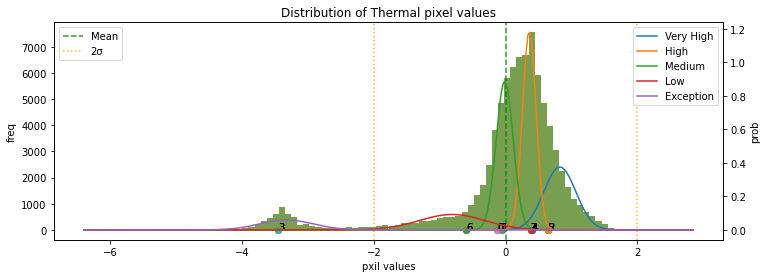

******* end *******
******* start *******
175.jpg
Module type: Multi-Hotspots
Cluster types1: ['Very High' 'Exception' 'High' 'Medium' 'High' 'High' 'Very High'
 'Medium']
Cluster types2: ['Very High' 'Exception' 'Medium' 'Low' 'Medium' 'Medium' 'Very High'
 'Low']
Hotspot weights: 0.296078431372549


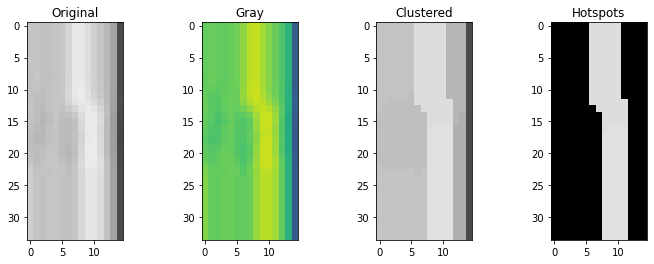

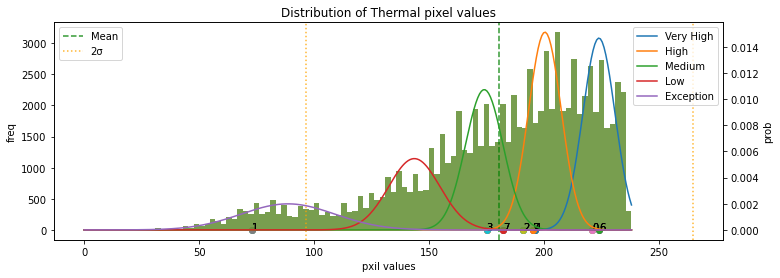

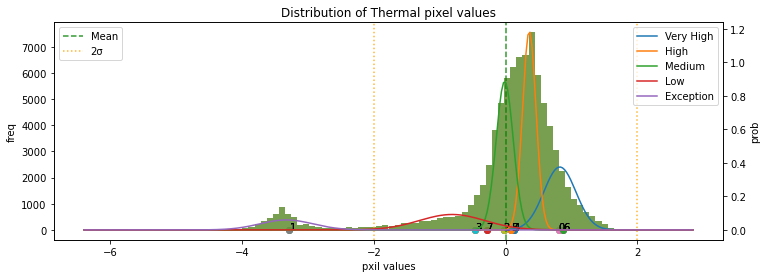

******* end *******
******* start *******
161.jpg
Module type: Normal
Cluster types1: ['Exception' 'Medium' 'High' 'Medium' 'Low' 'Medium' 'Low' 'High']
Cluster types2: ['Exception' 'Medium' 'Very High' 'Medium' 'Low' 'Low' 'Low' 'Very High']
Hotspot weights: 0.0


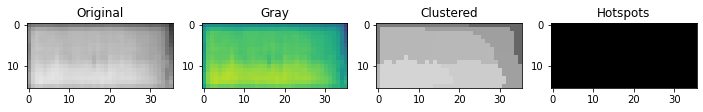

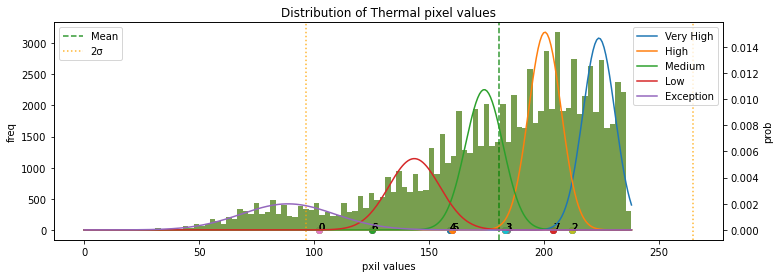

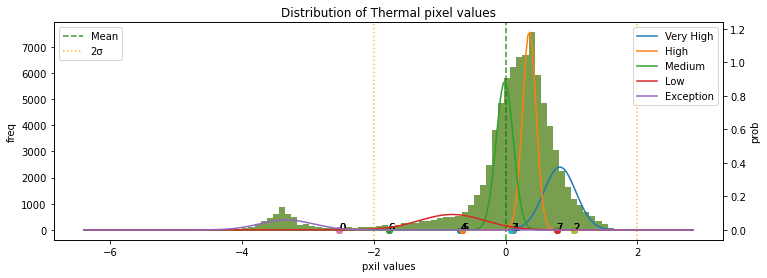

******* end *******
******* start *******
203.jpg
Module type: Normal
Cluster types1: ['High' 'Very High' 'Exception' 'Very High' 'Very High' 'Very High'
 'Very High' 'Very High']
Cluster types2: ['Low' 'Medium' 'Exception' 'High' 'High' 'High' 'High' 'High']
Hotspot weights: 0.0


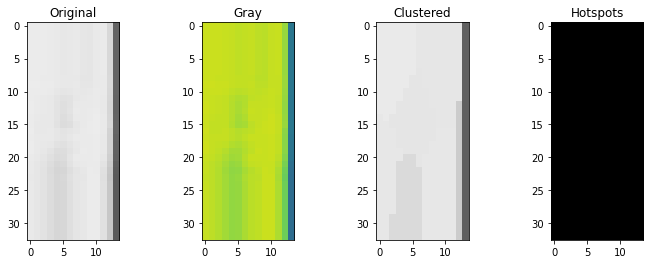

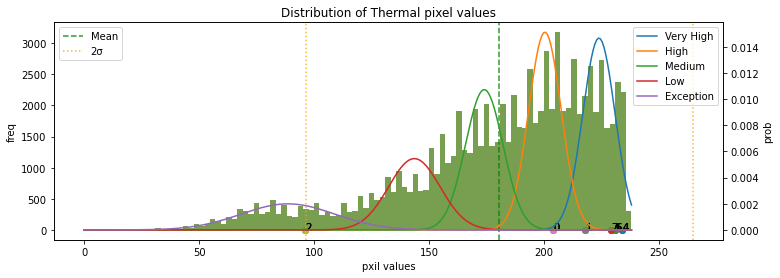

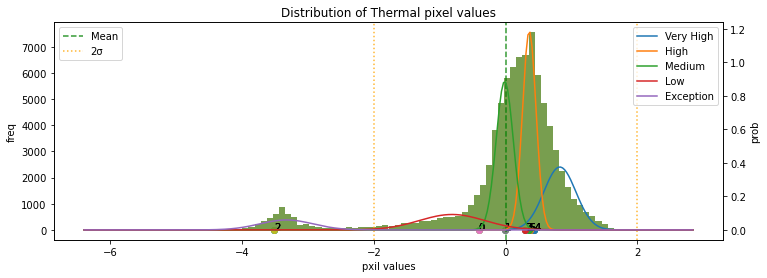

******* end *******
******* start *******
202.jpg
Module type: Normal
Cluster types1: ['Exception' 'Very High' 'Very High' 'Very High' 'Very High' 'Very High'
 'Exception' 'Very High']
Cluster types2: ['Exception' 'High' 'High' 'High' 'High' 'Medium' 'Exception' 'High']
Hotspot weights: 0.0


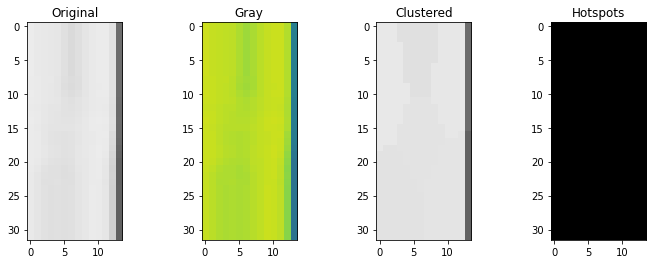

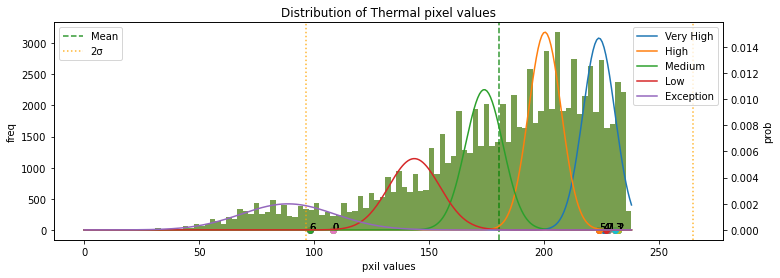

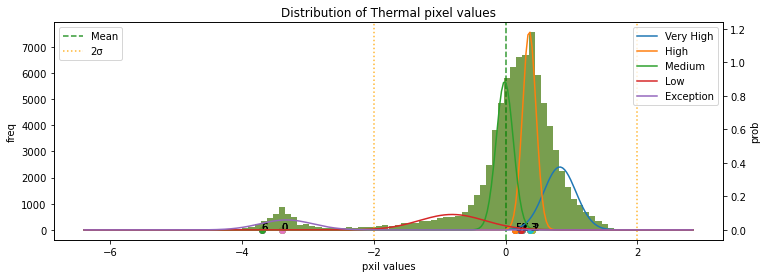

******* end *******
******* start *******
160.jpg
Module type: Multi-Hotspots
Cluster types1: ['Very High' 'Exception' 'Medium' 'Exception' 'Very High' 'Medium' 'Low'
 'High']
Cluster types2: ['Very High' 'Low' 'Medium' 'Exception' 'Very High' 'Medium' 'Low' 'High']
Hotspot weights: 0.28308823529411764


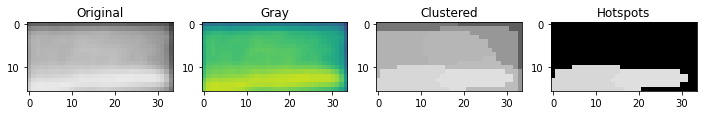

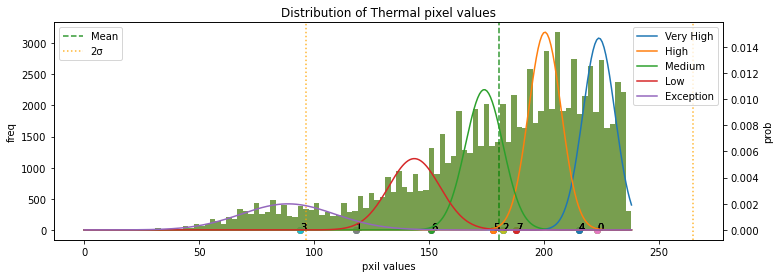

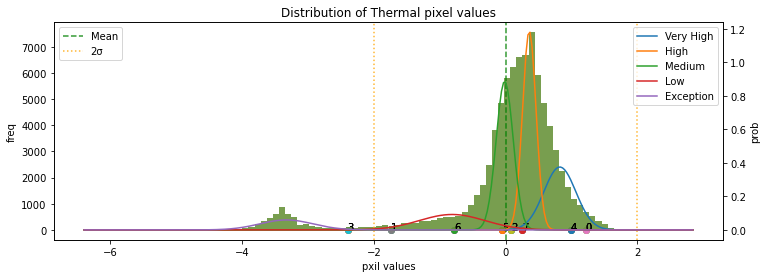

******* end *******
******* start *******
148.jpg
Module type: Normal
Cluster types1: ['High' 'Exception' 'High' 'High' 'Very High' 'Very High' 'Very High'
 'Very High']
Cluster types2: ['Medium' 'Exception' 'Medium' 'Low' 'High' 'High' 'High' 'High']
Hotspot weights: 0.0


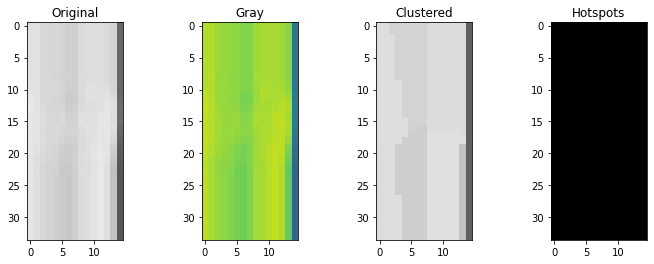

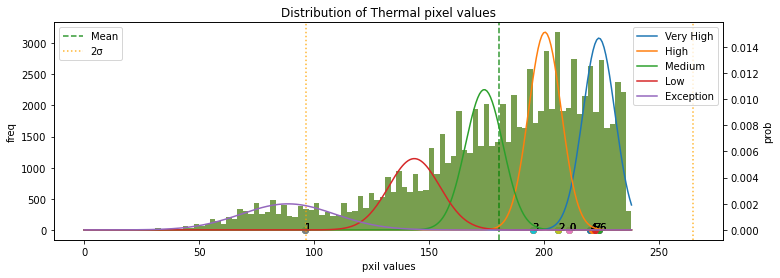

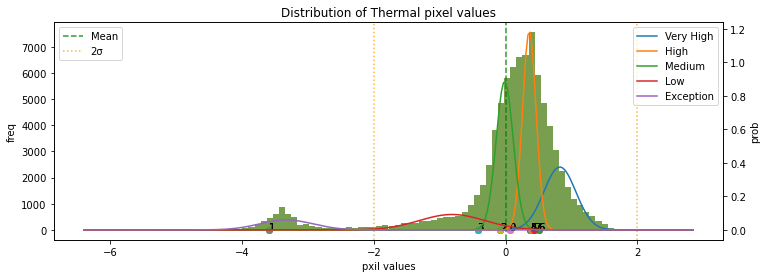

******* end *******
******* start *******
49.jpg
Module type: Normal
Cluster types1: ['Medium' 'Exception' 'High' 'High' 'High' 'High' 'High' 'High']
Cluster types2: ['Medium' 'Exception' 'Very High' 'Very High' 'Very High' 'Medium' 'High'
 'Medium']
Hotspot weights: 0.0


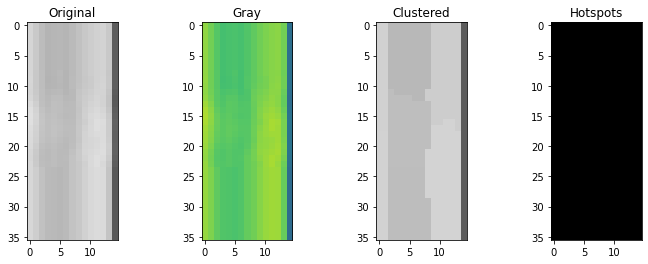

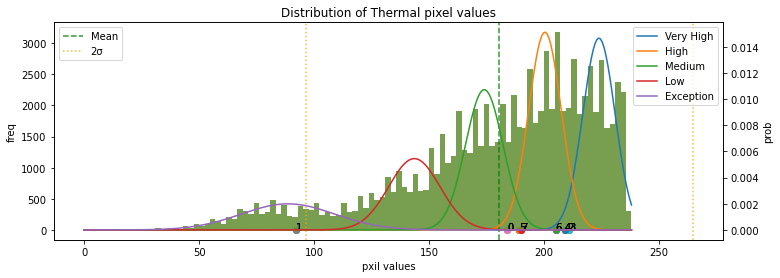

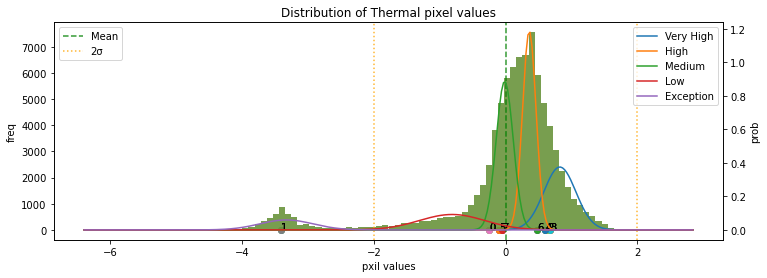

******* end *******
******* start *******
61.jpg
Module type: Normal
Cluster types1: ['Medium' 'Exception' 'Low' 'Medium' 'Exception' 'Medium' 'Medium'
 'Medium']
Cluster types2: ['High' 'Exception' 'Medium' 'High' 'Exception' 'High' 'Medium' 'High']
Hotspot weights: 0.0


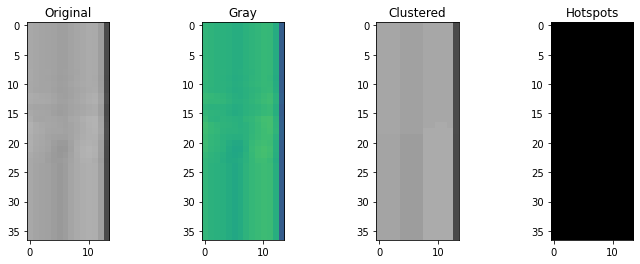

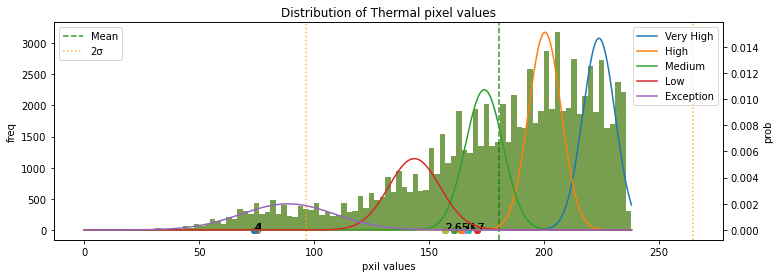

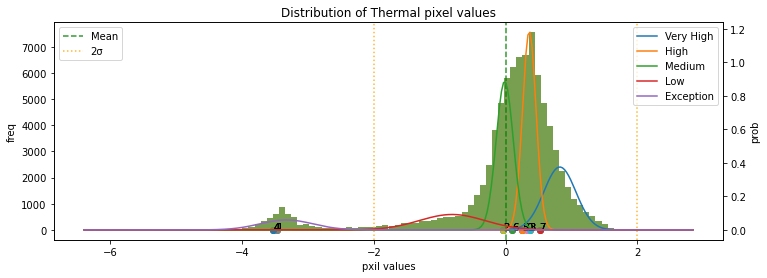

******* end *******
******* start *******
75.jpg
Module type: Normal
Cluster types1: ['Low' 'Low' 'Exception' 'Medium' 'Low' 'Low' 'Low' 'Low']
Cluster types2: ['Medium' 'Low' 'Exception' 'Very High' 'Very High' 'Medium' 'Low' 'Low']
Hotspot weights: 0.0


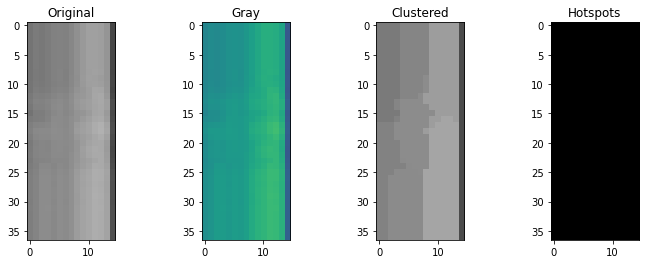

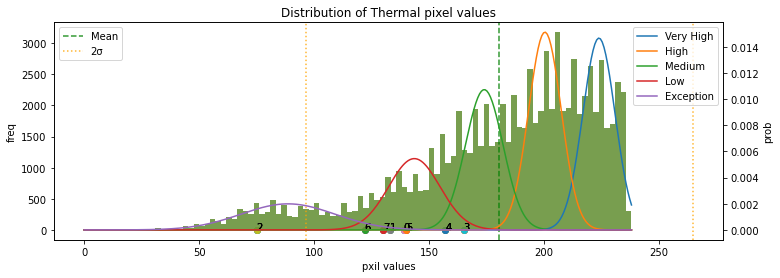

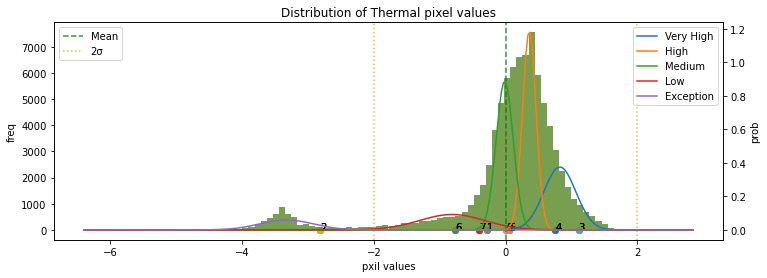

******* end *******
******* start *******
59.jpg
Module type: Normal
Cluster types1: ['High' 'High' 'Exception' 'High' 'High' 'Medium' 'High' 'High']
Cluster types2: ['Very High' 'Medium' 'Exception' 'Very High' 'High' 'Low' 'Medium'
 'Medium']
Hotspot weights: 0.0


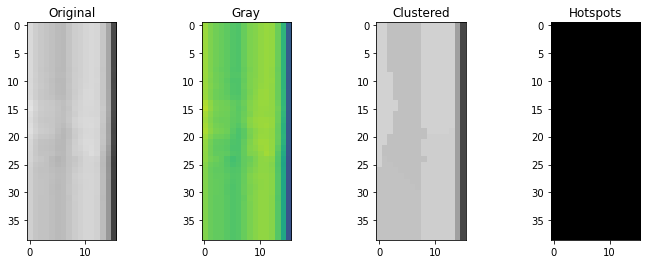

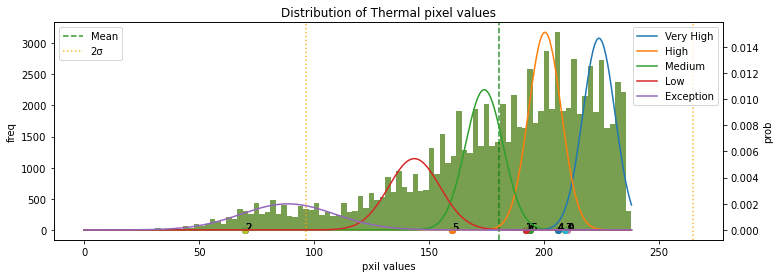

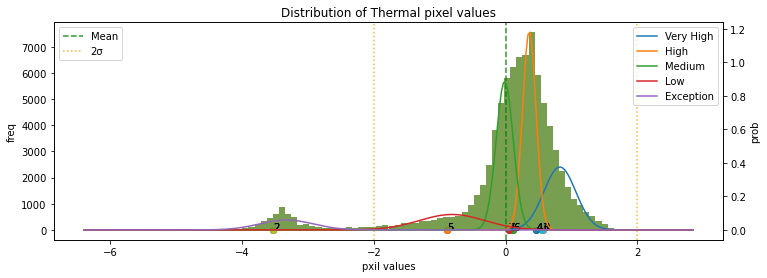

******* end *******
******* start *******
71.jpg
Module type: Single-Hotspot
Cluster types1: ['High' 'Exception' 'Medium' 'High' 'Exception' 'Very High' 'Exception'
 'High']
Cluster types2: ['High' 'Exception' 'Low' 'Medium' 'Low' 'Very High' 'Exception' 'High']
Hotspot weights: 0.20512820512820512


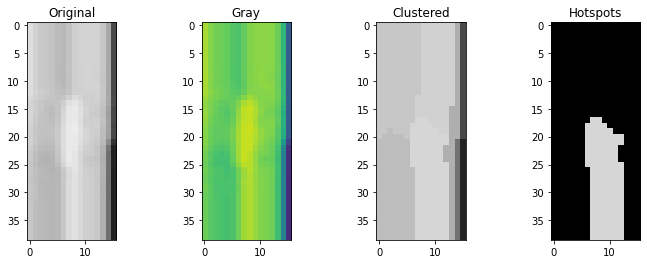

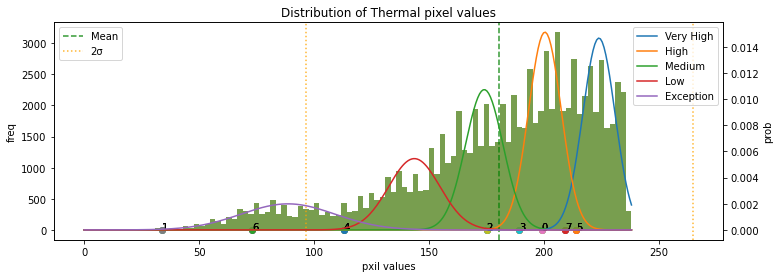

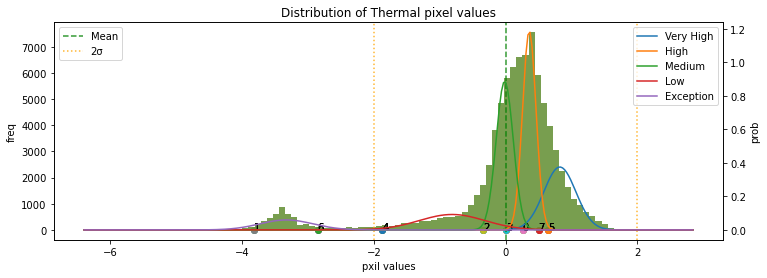

******* end *******
******* start *******
65.jpg
Module type: Normal
Cluster types1: ['Low' 'Medium' 'Medium' 'Exception' 'Medium' 'Medium' 'Medium' 'Medium']
Cluster types2: ['Low' 'Very High' 'High' 'Exception' 'Very High' 'Medium' 'Very High'
 'Medium']
Hotspot weights: 0.0


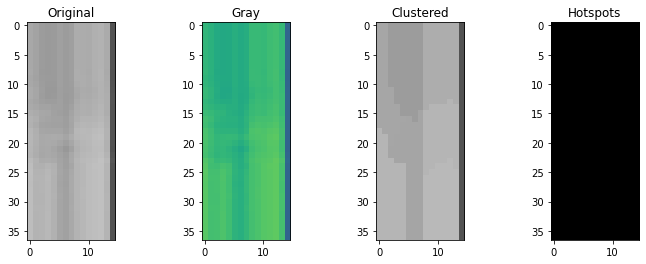

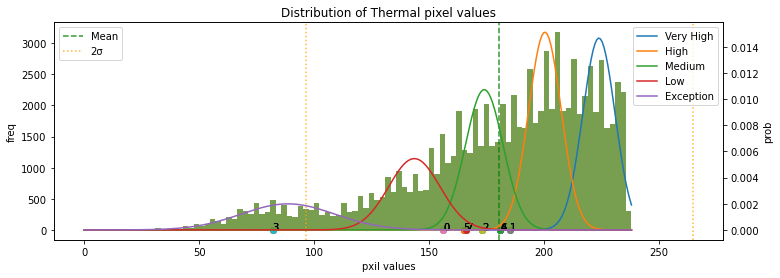

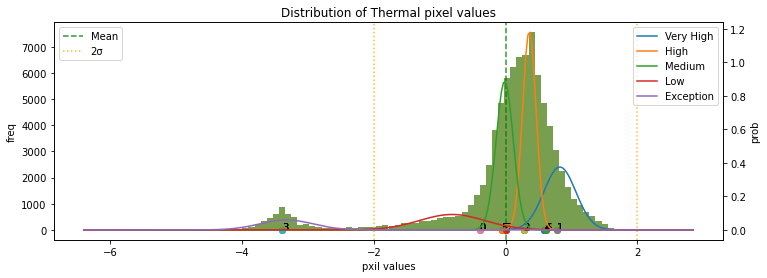

******* end *******
******* start *******
158.jpg
Module type: Normal
Cluster types1: ['Medium' 'Low' 'High' 'High' 'Medium' 'Exception' 'Medium' 'Medium']
Cluster types2: ['Medium' 'Low' 'Very High' 'Very High' 'Low' 'Exception' 'Medium' 'Low']
Hotspot weights: 0.0


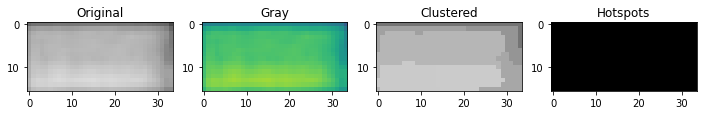

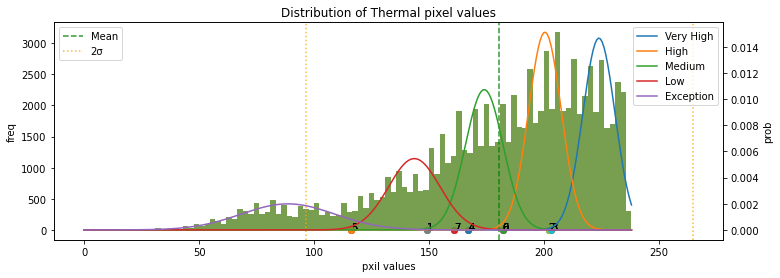

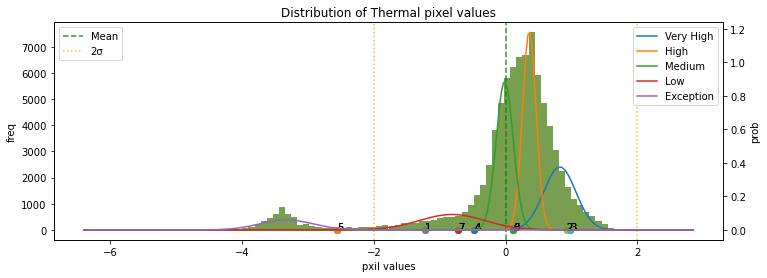

******* end *******
******* start *******
206.jpg
Module type: Normal
Cluster types1: ['Medium' 'Medium' 'Exception' 'Medium' 'Medium' 'Low' 'Medium' 'Medium']
Cluster types2: ['Medium' 'Medium' 'Exception' 'Medium' 'Very High' 'Medium' 'Medium'
 'Very High']
Hotspot weights: 0.0


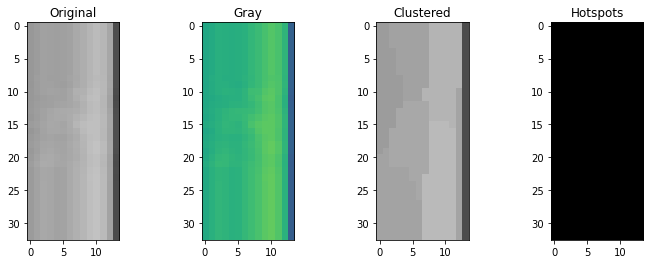

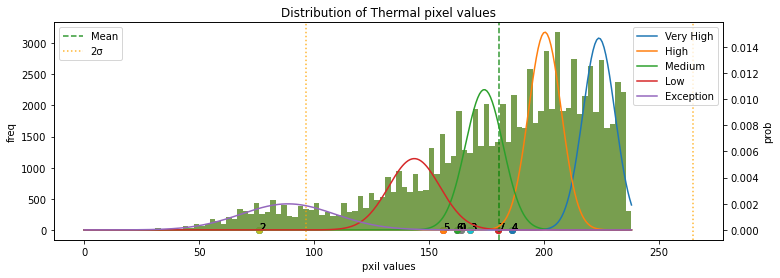

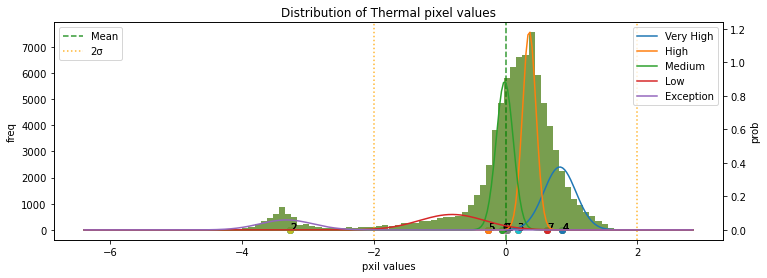

******* end *******
******* start *******
212.jpg
Module type: Multi-Hotspots
Cluster types1: ['Very High' 'Medium' 'Very High' 'Medium' 'Exception' 'High' 'Very High'
 'High']
Cluster types2: ['Medium' 'Low' 'Very High' 'Low' 'Exception' 'Medium' 'Very High' 'Low']
Hotspot weights: 0.34375


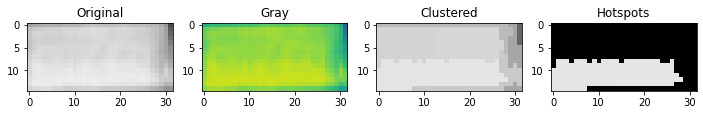

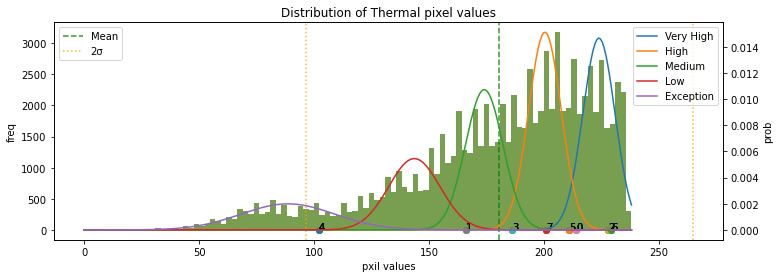

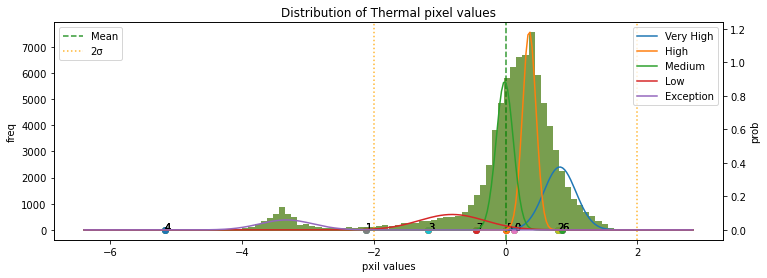

******* end *******
******* start *******
207.jpg
Module type: Normal
Cluster types1: ['High' 'Medium' 'Exception' 'Medium' 'Medium' 'High' 'High' 'Medium']
Cluster types2: ['High' 'Medium' 'Exception' 'High' 'Low' 'Very High' 'Very High' 'Medium']
Hotspot weights: 0.0


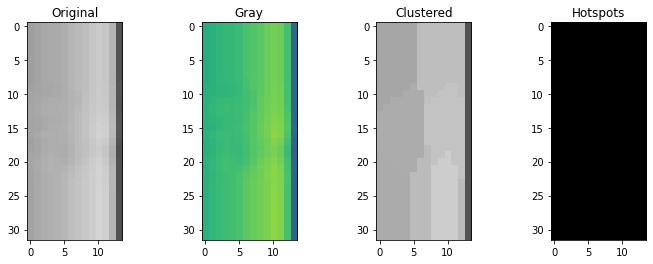

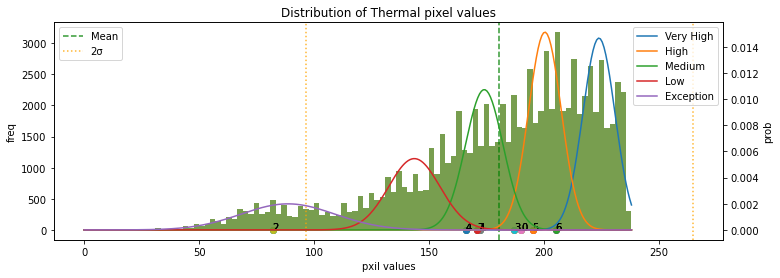

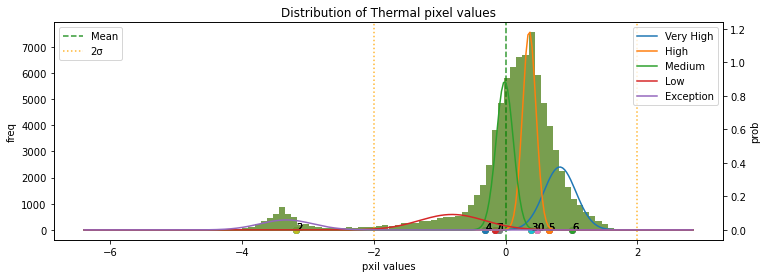

******* end *******
******* start *******
159.jpg
Module type: Normal
Cluster types1: ['Medium' 'Medium' 'High' 'Exception' 'Low' 'Medium' 'Medium' 'Low']
Cluster types2: ['Medium' 'Medium' 'Very High' 'Exception' 'Low' 'Low' 'High' 'Low']
Hotspot weights: 0.0


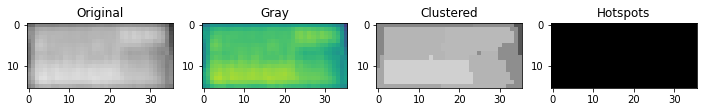

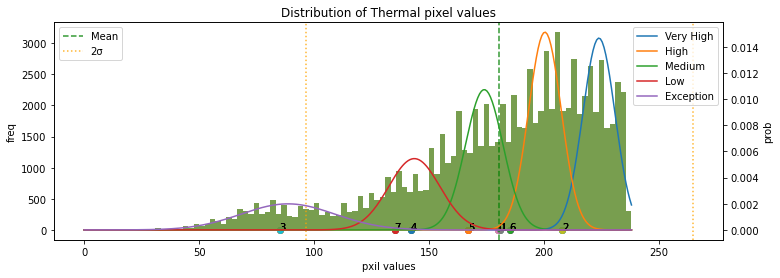

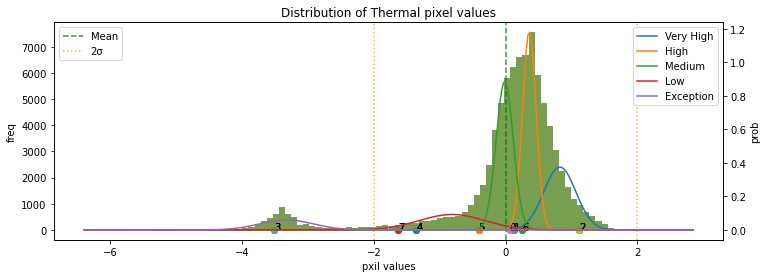

******* end *******
******* start *******
64.jpg
Module type: Normal
Cluster types1: ['High' 'Exception' 'Medium' 'Medium' 'High' 'High' 'High' 'Medium']
Cluster types2: ['High' 'Exception' 'Medium' 'High' 'High' 'Very High' 'High' 'Medium']
Hotspot weights: 0.0


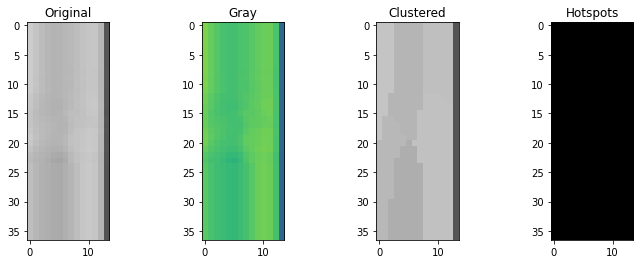

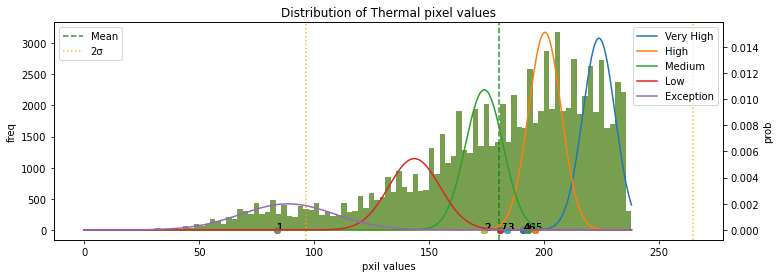

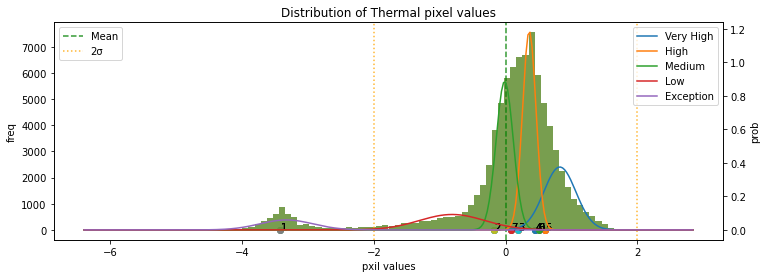

******* end *******
******* start *******
70.jpg
Module type: Normal
Cluster types1: ['High' 'Exception' 'High' 'High' 'High' 'High' 'Medium' 'High']
Cluster types2: ['High' 'Exception' 'High' 'High' 'High' 'Medium' 'Low' 'Medium']
Hotspot weights: 0.0


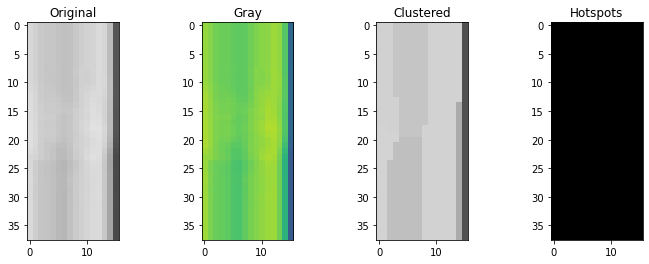

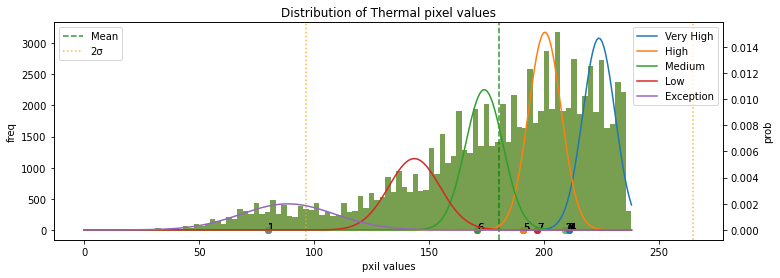

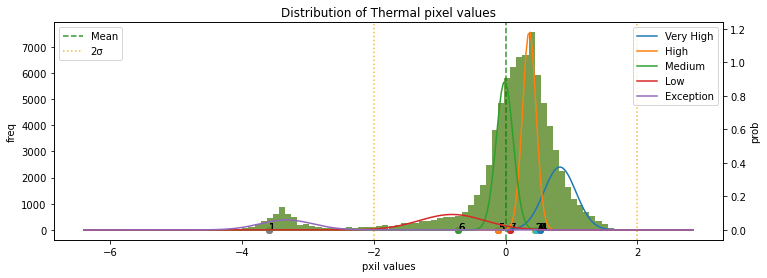

******* end *******
******* start *******
58.jpg
Module type: Single-Hotspot
Cluster types1: ['High' 'Exception' 'High' 'Medium' 'High' 'High' 'Very High' 'High']
Cluster types2: ['Medium' 'Exception' 'High' 'Low' 'Medium' 'High' 'Very High' 'Medium']
Hotspot weights: 0.08493589743589744


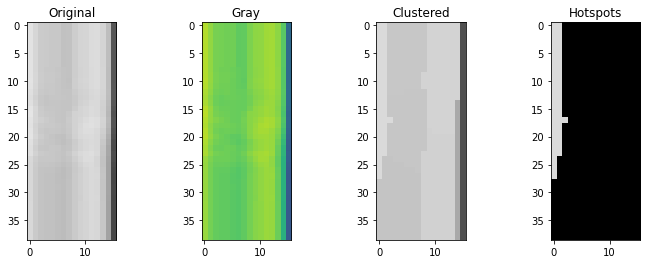

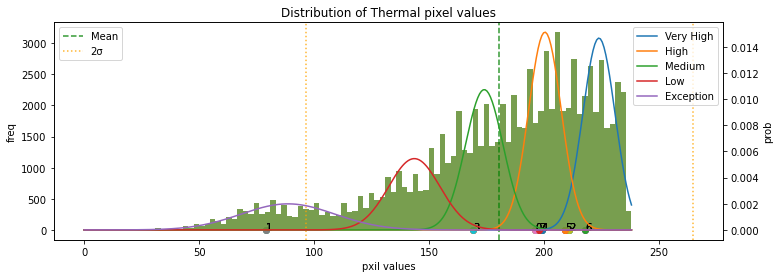

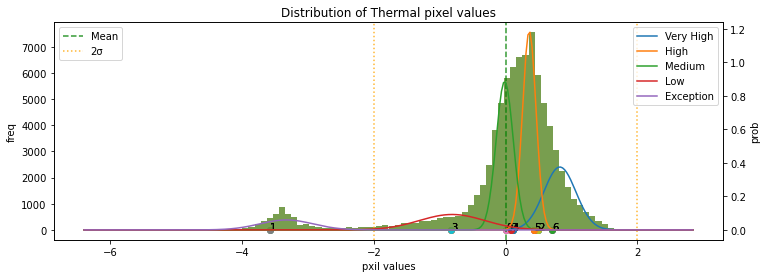

******* end *******
******* start *******
8.jpg
Module type: Normal
Cluster types1: ['Low' 'Low' 'Exception' 'Low' 'Low' 'Medium' 'Low' 'Low']
Cluster types2: ['High' 'Medium' 'Exception' 'High' 'Low' 'Very High' 'Low' 'Medium']
Hotspot weights: 0.0


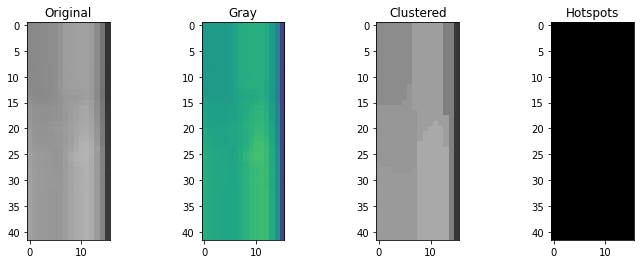

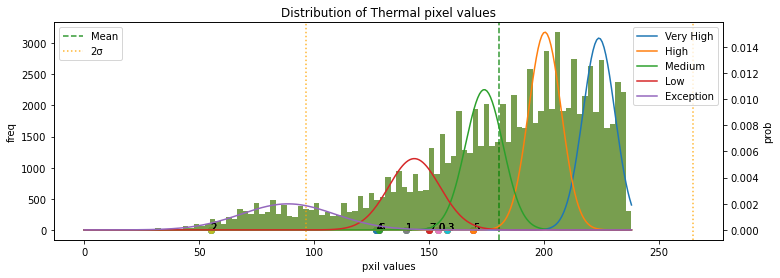

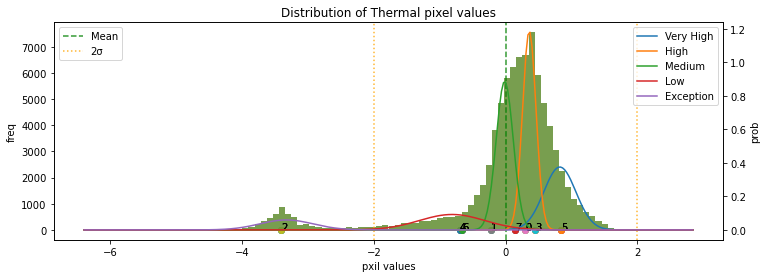

******* end *******
******* start *******
198.jpg
Module type: Normal
Cluster types1: ['Exception' 'High' 'High' 'Very High' 'High' 'High' 'Exception' 'High']
Cluster types2: ['Exception' 'Medium' 'High' 'High' 'High' 'Medium' 'Exception' 'High']
Hotspot weights: 0.0


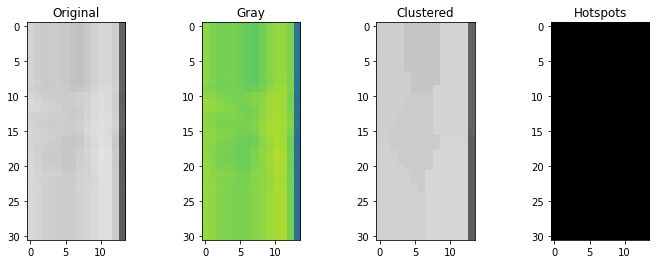

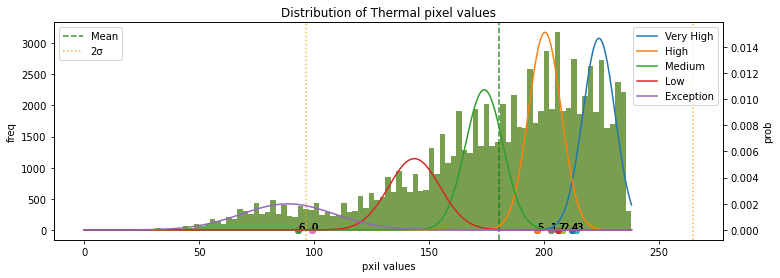

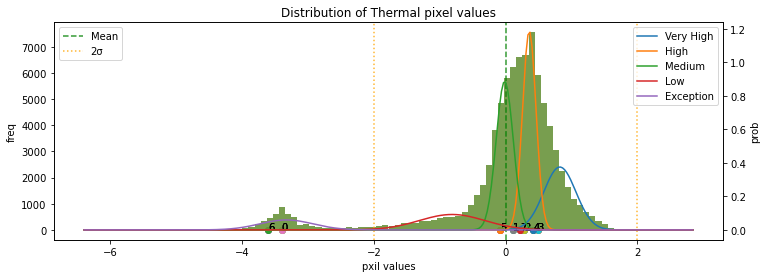

******* end *******
******* start *******
66.jpg
Module type: Normal
Cluster types1: ['High' 'Medium' 'Low' 'High' 'Low' 'Medium' 'Medium' 'Exception']
Cluster types2: ['Very High' 'Low' 'Low' 'Very High' 'Low' 'High' 'Medium' 'Exception']
Hotspot weights: 0.0


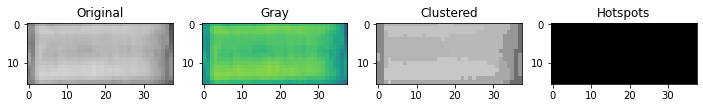

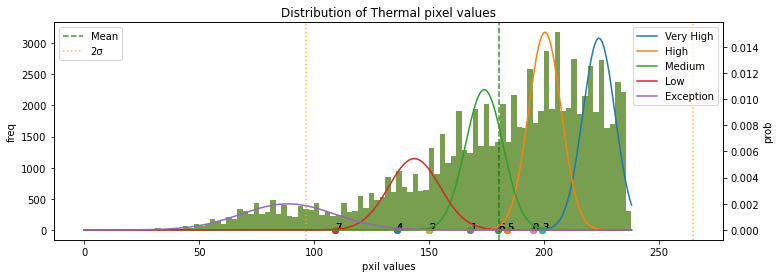

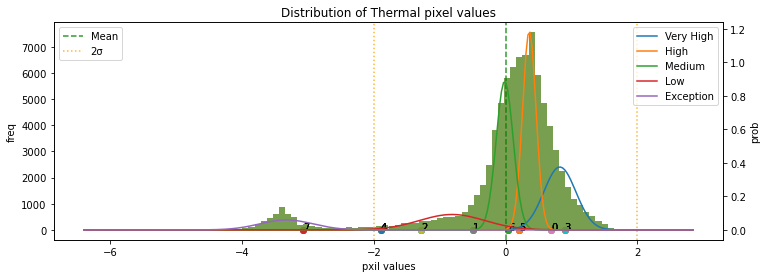

******* end *******
******* start *******
72.jpg
Module type: Single-Hotspot
Cluster types1: ['Medium' 'High' 'High' 'Exception' 'High' 'High' 'Very High' 'High']
Cluster types2: ['Low' 'High' 'High' 'Exception' 'Medium' 'Medium' 'Very High' 'High']
Hotspot weights: 0.07211538461538461


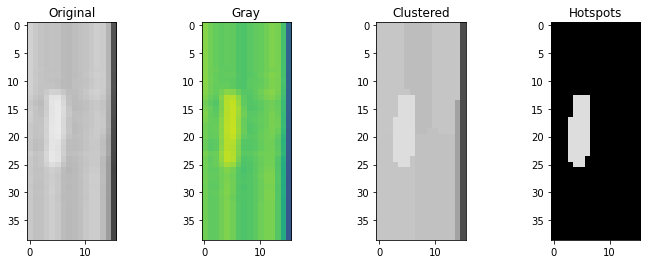

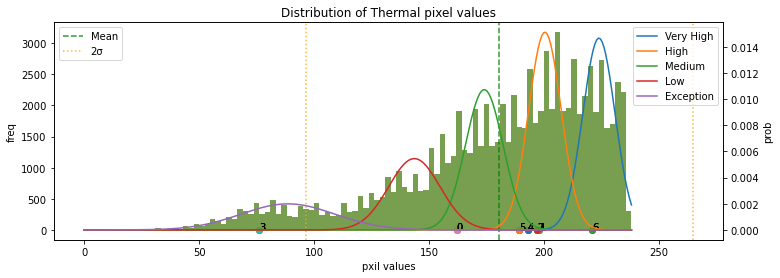

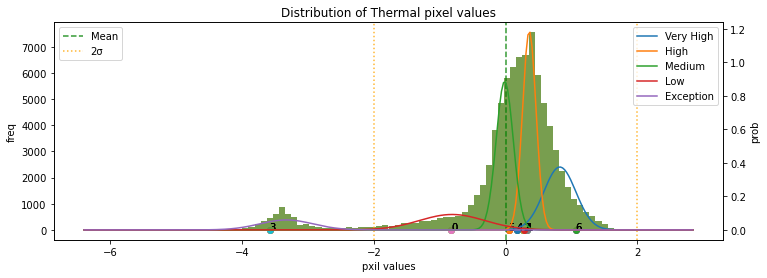

******* end *******
******* start *******
211.jpg
Module type: Cluster-Anomaly
Cluster types1: ['High' 'Exception' 'High' 'High' 'Very High' 'Very High' 'Very High'
 'Very High']
Cluster types2: ['Medium' 'Exception' 'Medium' 'Low' 'Very High' 'High' 'Very High' 'High']
Hotspot weights: 0.3392857142857143


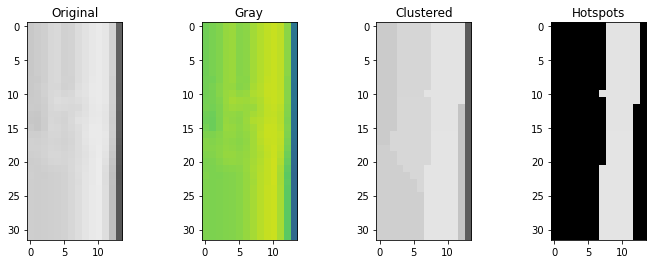

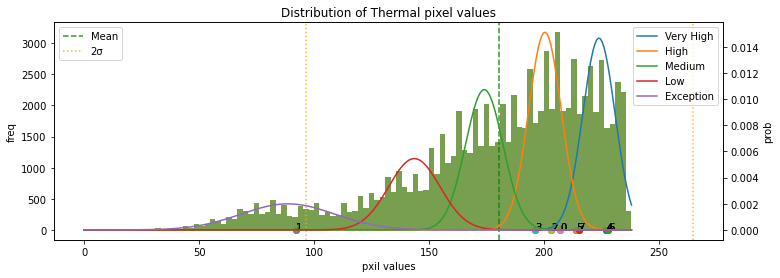

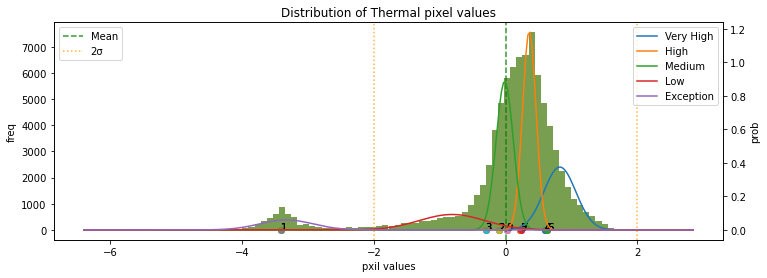

******* end *******
******* start *******
205.jpg
Module type: Normal
Cluster types1: ['Low' 'Exception' 'Low' 'Low' 'Medium' 'Low' 'Low' 'Medium']
Cluster types2: ['High' 'Exception' 'High' 'Low' 'Very High' 'Low' 'Medium' 'Very High']
Hotspot weights: 0.0


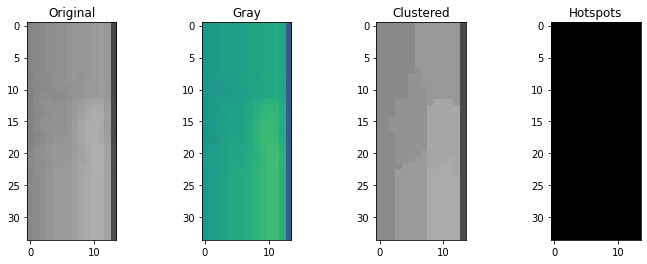

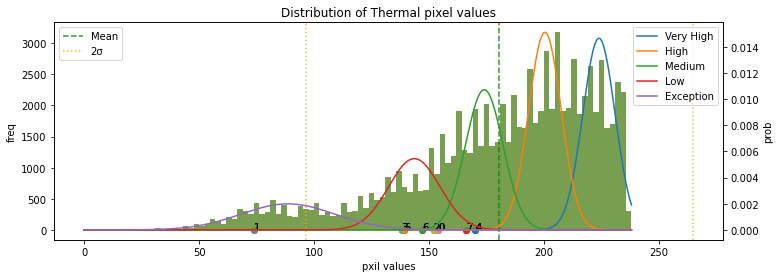

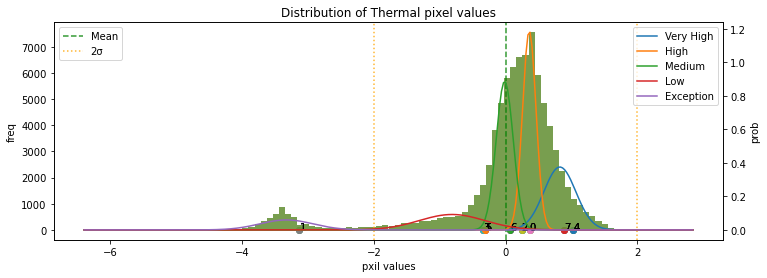

******* end *******
******* start *******
204.jpg
Module type: Normal
Cluster types1: ['Exception' 'Low' 'Exception' 'Low' 'Low' 'Low' 'Exception' 'Low']
Cluster types2: ['Low' 'Very High' 'Exception' 'Medium' 'Medium' 'High' 'Low' 'Very High']
Hotspot weights: 0.0


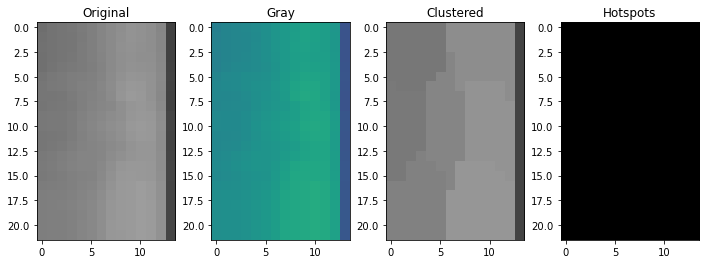

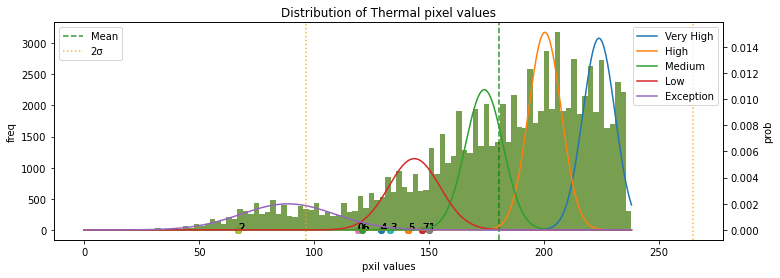

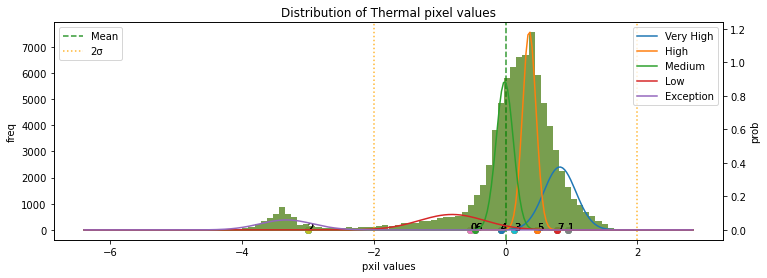

******* end *******
******* start *******
210.jpg
Module type: Cluster-Anomaly
Cluster types1: ['High' 'Very High' 'Exception' 'High' 'Very High' 'High' 'Exception'
 'High']
Cluster types2: ['Medium' 'Very High' 'Exception' 'Medium' 'Very High' 'Medium'
 'Exception' 'Medium']
Hotspot weights: 0.36830357142857145


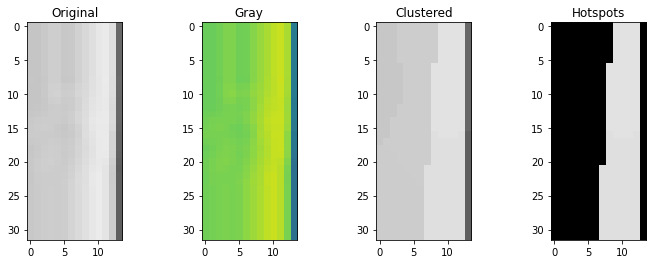

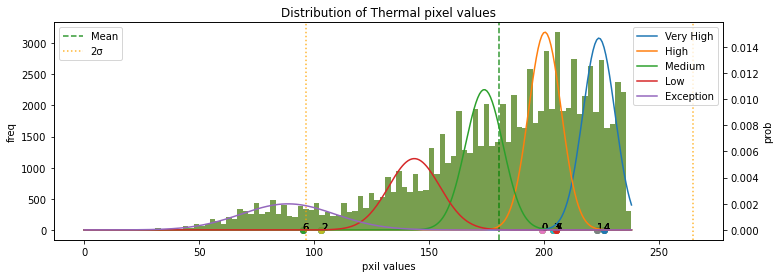

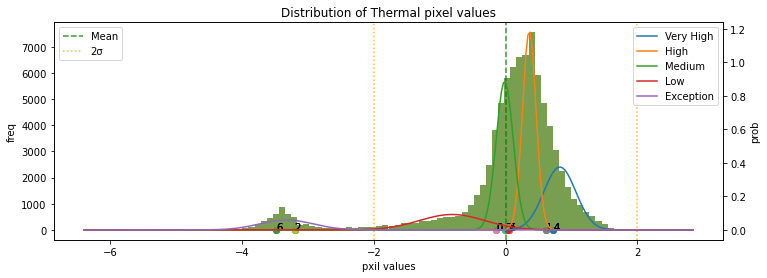

******* end *******
******* start *******
73.jpg
Module type: Normal
Cluster types1: ['High' 'Exception' 'High' 'High' 'Medium' 'Medium' 'Medium' 'High']
Cluster types2: ['High' 'Exception' 'Very High' 'High' 'Low' 'Medium' 'Medium' 'Very High']
Hotspot weights: 0.0


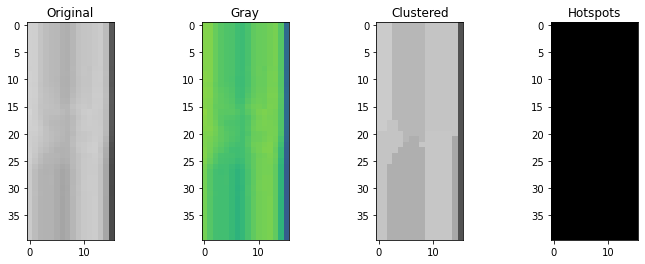

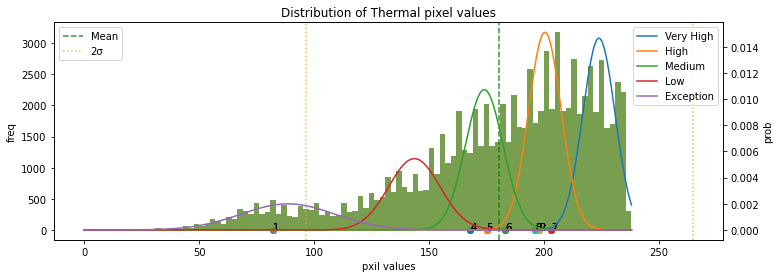

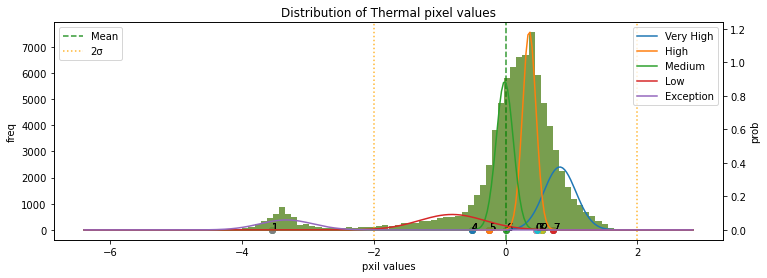

******* end *******
******* start *******
199.jpg
Module type: Normal
Cluster types1: ['Very High' 'Exception' 'Very High' 'Very High' 'Very High' 'Very High'
 'Very High' 'Very High']
Cluster types2: ['Medium' 'Exception' 'High' 'High' 'High' 'High' 'Medium' 'High']
Hotspot weights: 0.0


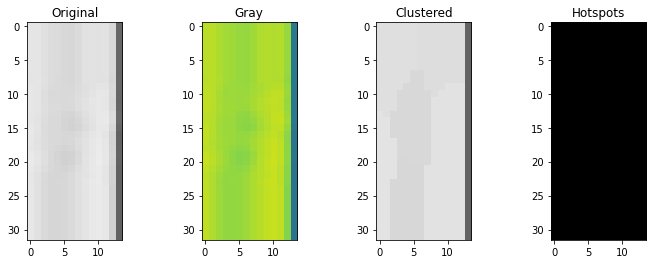

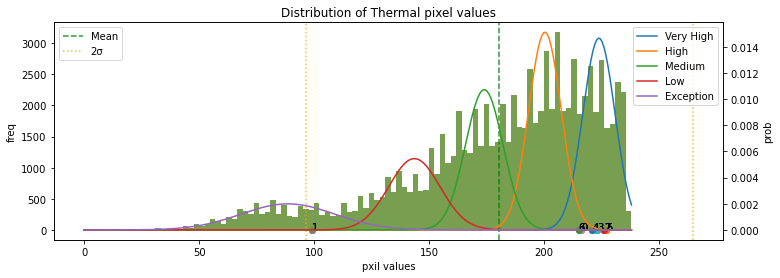

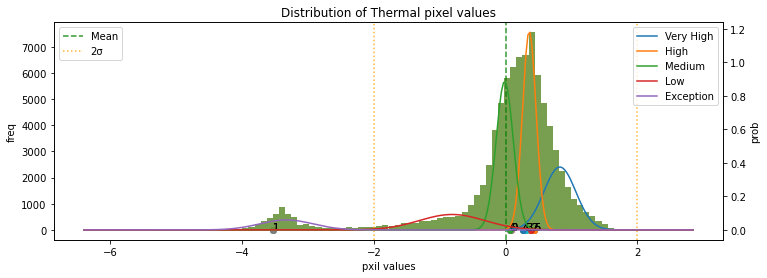

******* end *******
******* start *******
67.jpg
Module type: Single-Hotspot
Cluster types1: ['Medium' 'Exception' 'High' 'Medium' 'Very High' 'High' 'High' 'High']
Cluster types2: ['Medium' 'Exception' 'Medium' 'Medium' 'Very High' 'High' 'High' 'High']
Hotspot weights: 0.0912280701754386


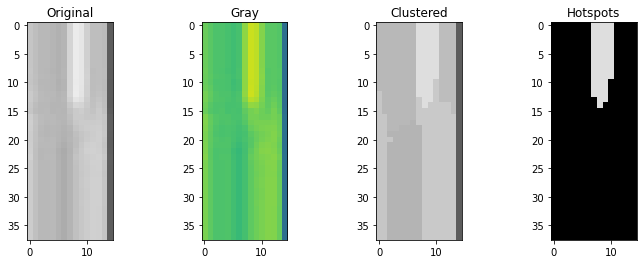

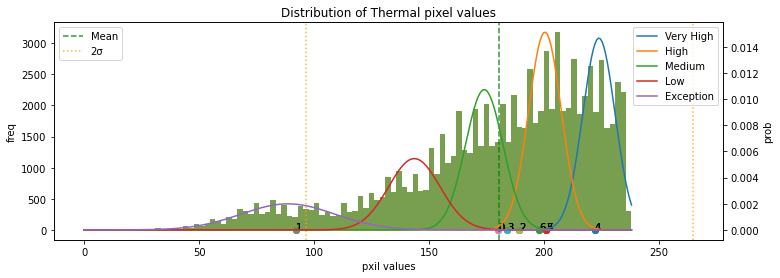

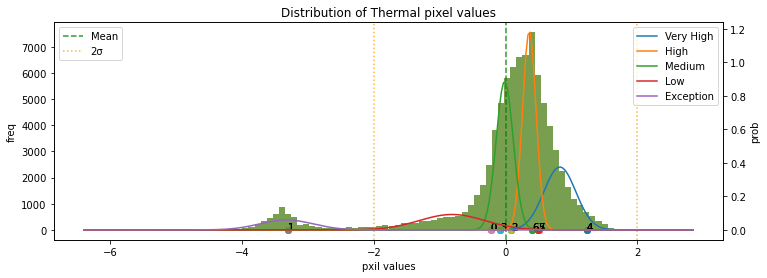

******* end *******
******* start *******
9.jpg
Module type: Normal
Cluster types1: ['Low' 'Low' 'Exception' 'Low' 'Low' 'Exception' 'Low' 'Low']
Cluster types2: ['Very High' 'Low' 'Exception' 'Medium' 'High' 'Low' 'High' 'Very High']
Hotspot weights: 0.0


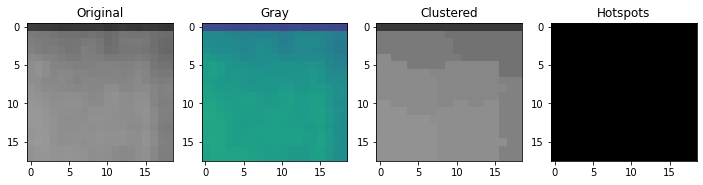

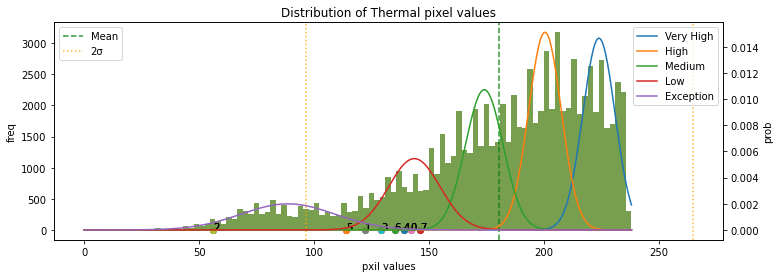

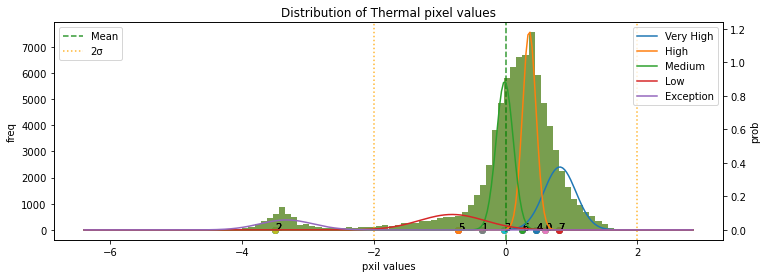

******* end *******
******* start *******
14.jpg
Module type: Normal
Cluster types1: ['Exception' 'Low' 'Exception' 'Low' 'Exception' 'Low' 'Low' 'Exception']
Cluster types2: ['Medium' 'Medium' 'Exception' 'Very High' 'Low' 'Very High' 'High'
 'Medium']
Hotspot weights: 0.0


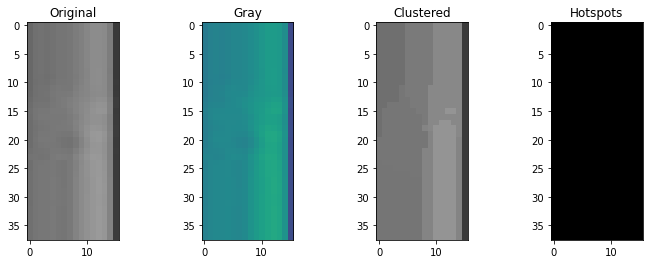

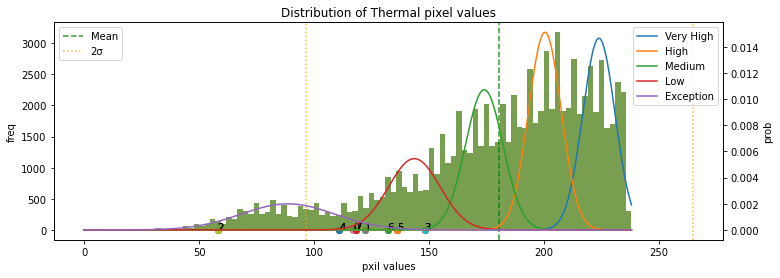

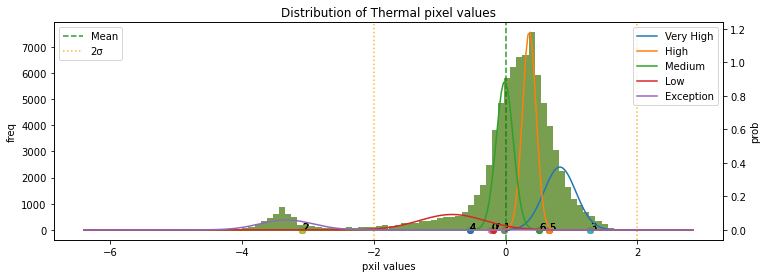

******* end *******
******* start *******
129.jpg
Module type: Normal
Cluster types1: ['Very High' 'Exception' 'Very High' 'Very High' 'Medium' 'Very High'
 'Low' 'Very High']
Cluster types2: ['High' 'Exception' 'High' 'High' 'Low' 'High' 'Low' 'High']
Hotspot weights: 0.0


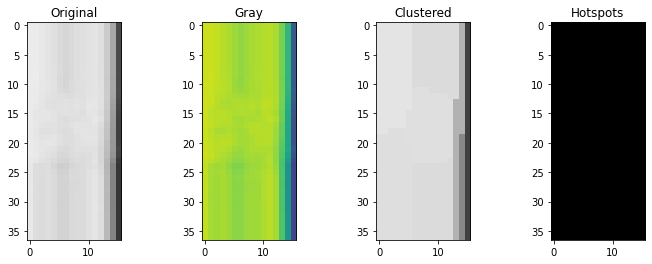

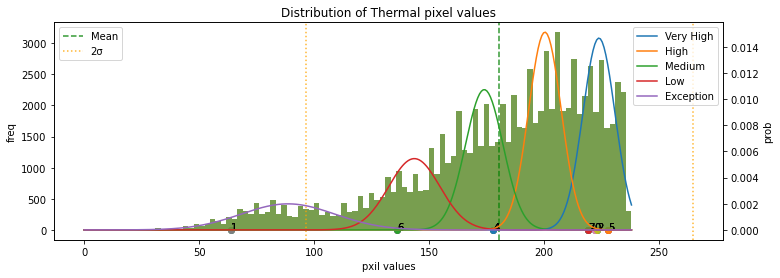

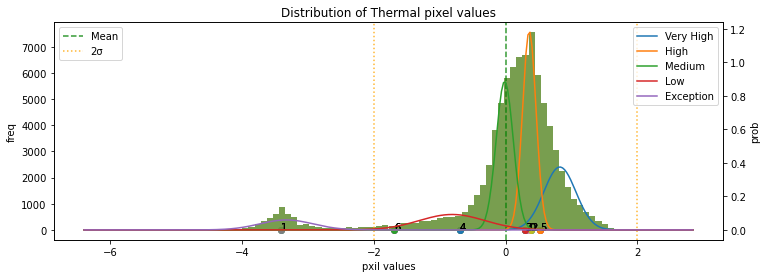

******* end *******
******* start *******
115.jpg
Module type: Normal
Cluster types1: ['High' 'Exception' 'Very High' 'Very High' 'Medium' 'Very High'
 'Very High' 'High']
Cluster types2: ['High' 'Exception' 'High' 'High' 'Low' 'High' 'High' 'High']
Hotspot weights: 0.0


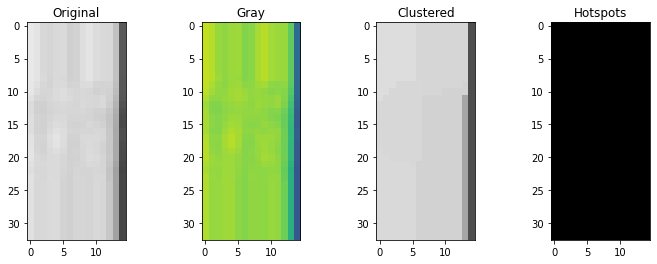

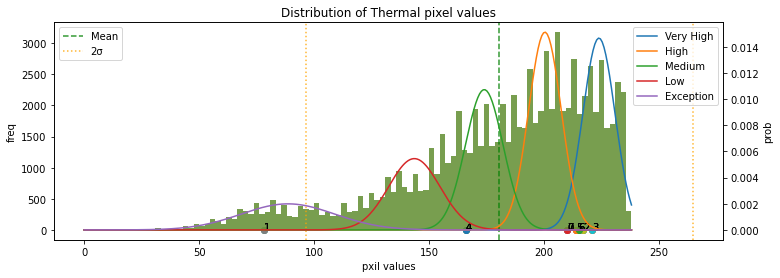

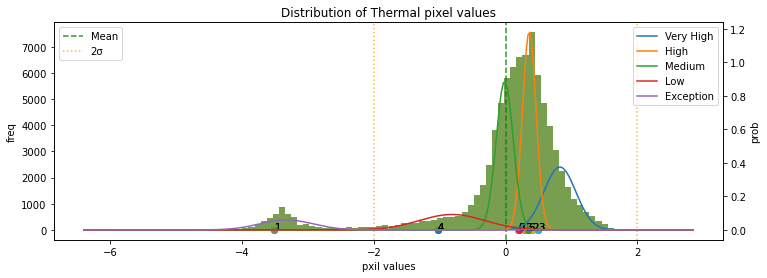

******* end *******
******* start *******
114.jpg
Module type: Normal
Cluster types1: ['High' 'Exception' 'High' 'High' 'Medium' 'Low' 'Medium' 'High']
Cluster types2: ['High' 'Exception' 'Very High' 'High' 'Medium' 'Low' 'Medium' 'Very High']
Hotspot weights: 0.0


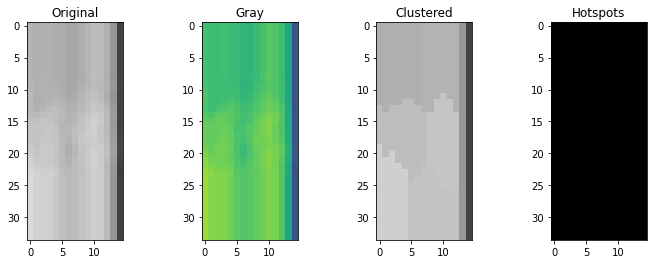

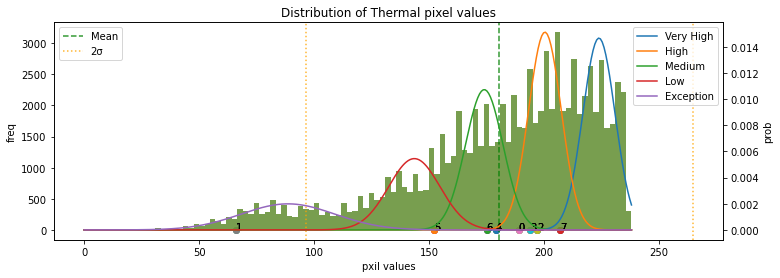

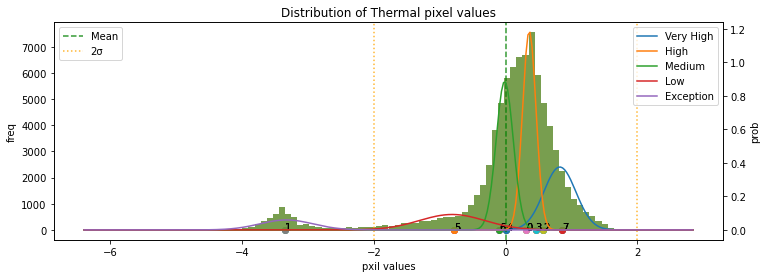

******* end *******
******* start *******
128.jpg
Module type: Normal
Cluster types1: ['Medium' 'Exception' 'High' 'High' 'Low' 'High' 'Medium' 'High']
Cluster types2: ['Medium' 'Exception' 'Very High' 'Very High' 'Low' 'High' 'Medium'
 'Very High']
Hotspot weights: 0.0


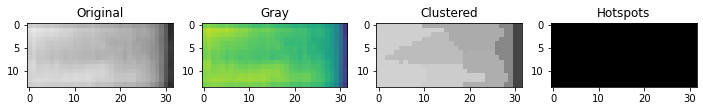

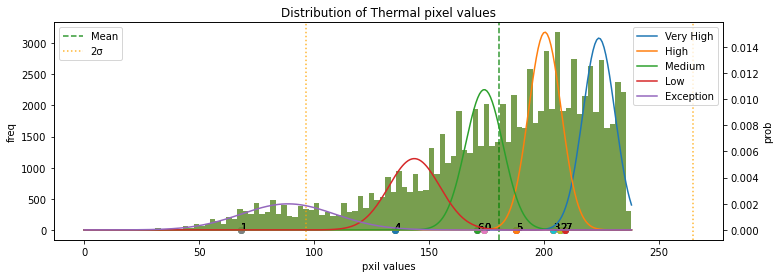

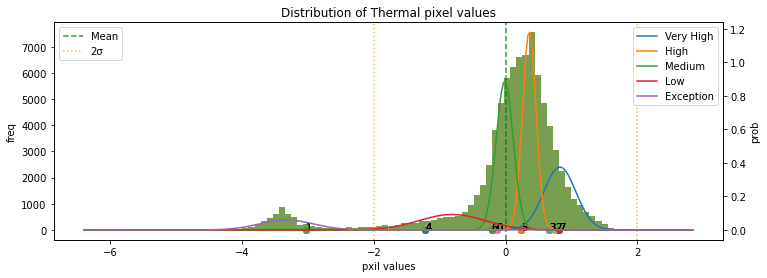

******* end *******
******* start *******
15.jpg
Module type: Normal
Cluster types1: ['Exception' 'Low' 'Low' 'Low' 'Exception' 'Low' 'Low' 'Low']
Cluster types2: ['Exception' 'Medium' 'Very High' 'Medium' 'Low' 'Very High' 'Low' 'Low']
Hotspot weights: 0.0


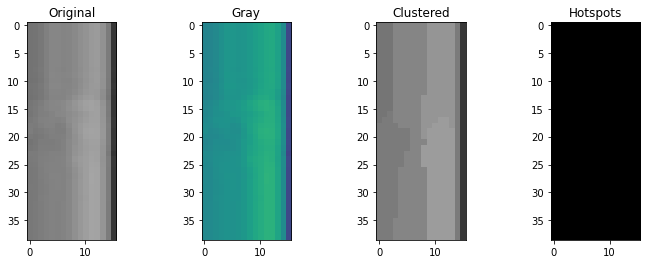

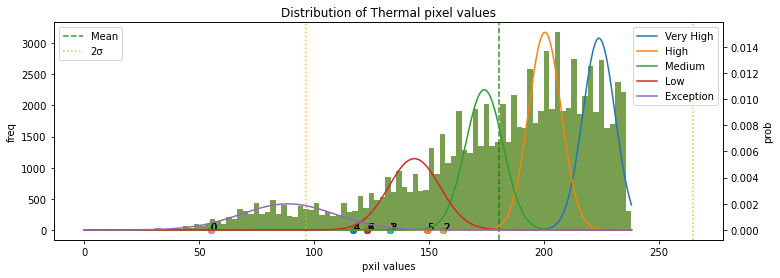

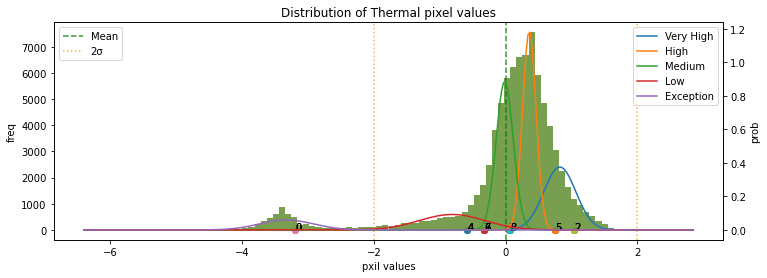

******* end *******
******* start *******
17.jpg
Module type: Normal
Cluster types1: ['Medium' 'Exception' 'Low' 'Exception' 'Exception' 'Low' 'Low'
 'Exception']
Cluster types2: ['Very High' 'Low' 'Medium' 'Exception' 'Low' 'High' 'Very High' 'Low']
Hotspot weights: 0.0


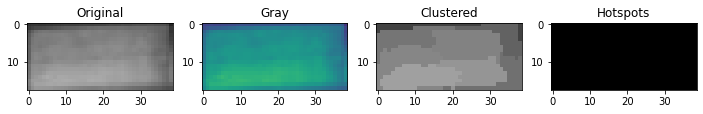

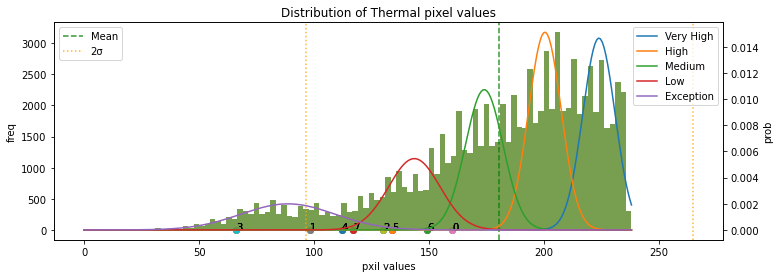

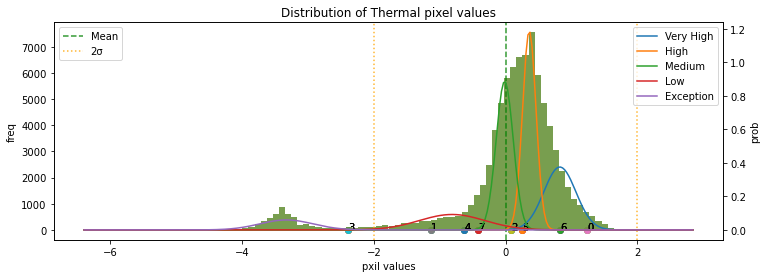

******* end *******
******* start *******
116.jpg
Module type: Cluster-Anomaly
Cluster types1: ['Very High' 'Exception' 'High' 'Low' 'Very High' 'Very High' 'Exception'
 'Medium']
Cluster types2: ['Very High' 'Exception' 'High' 'Low' 'Very High' 'Very High' 'Low'
 'Medium']
Hotspot weights: 0.5231259968102073


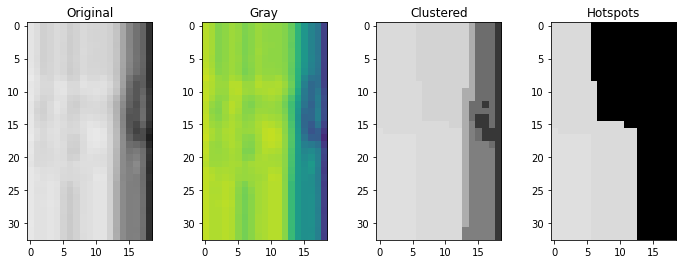

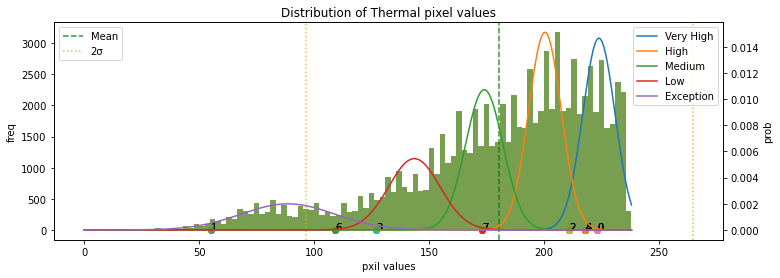

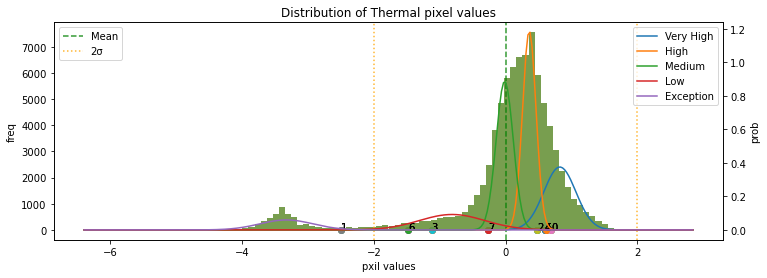

******* end *******
******* start *******
16.jpg
Module type: Normal
Cluster types1: ['Low' 'Medium' 'Exception' 'Low' 'Low' 'Low' 'Low' 'Low']
Cluster types2: ['Low' 'Very High' 'Exception' 'Medium' 'Medium' 'Very High' 'High'
 'Medium']
Hotspot weights: 0.0


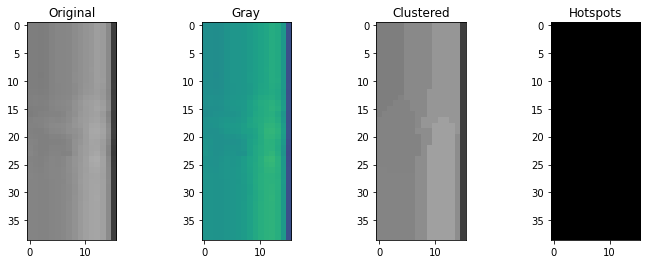

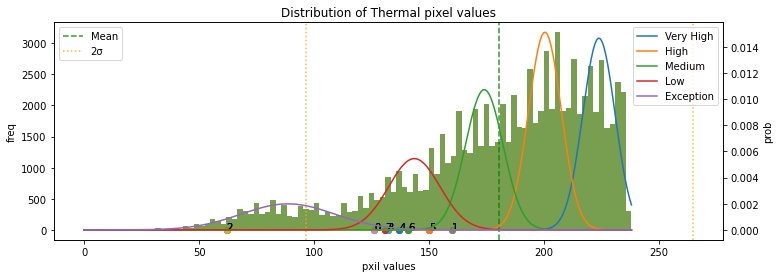

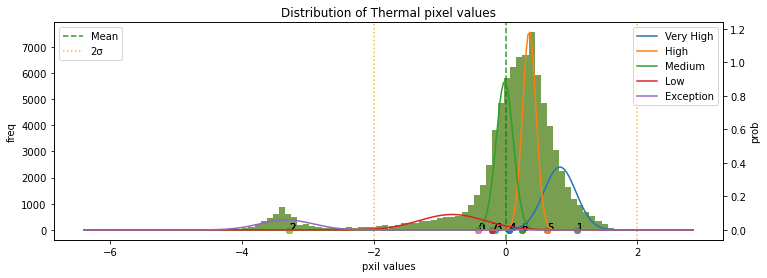

******* end *******
******* start *******
12.jpg
Module type: Normal
Cluster types1: ['Exception' 'Exception' 'Exception' 'Exception' 'Exception' 'Low'
 'Exception' 'Exception']
Cluster types2: ['Low' 'Very High' 'Exception' 'Medium' 'Low' 'Very High' 'Medium'
 'Medium']
Hotspot weights: 0.0


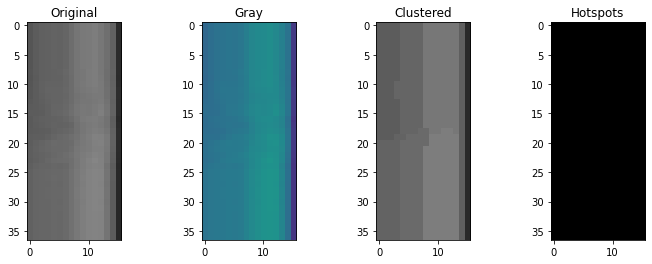

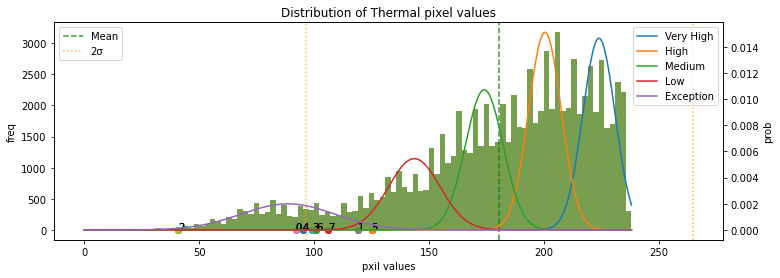

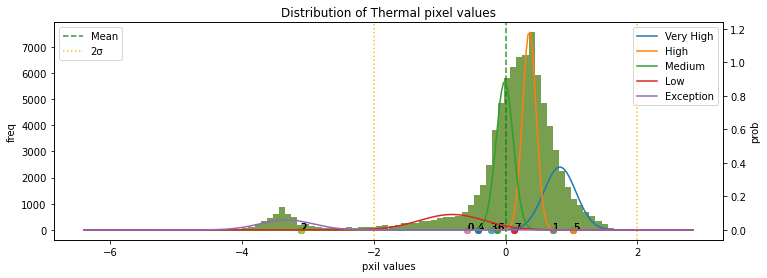

******* end *******
******* start *******
113.jpg
Module type: Single-Hotspot
Cluster types1: ['Medium' 'Very High' 'Exception' 'Very High' 'High' 'High' 'High'
 'Very High']
Cluster types2: ['Low' 'High' 'Exception' 'High' 'High' 'High' 'Low' 'Very High']
Hotspot weights: 0.15546218487394958


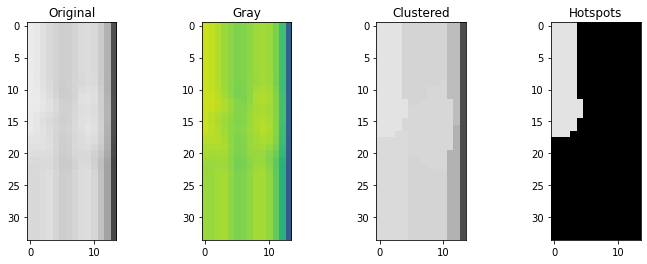

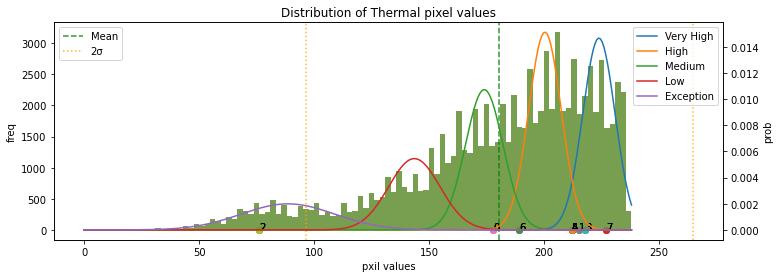

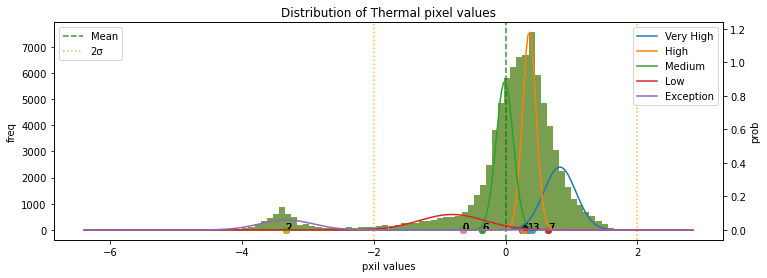

******* end *******
******* start *******
112.jpg
Module type: Single-Hotspot
Cluster types1: ['High' 'Exception' 'Very High' 'High' 'Low' 'Medium' 'High' 'Exception']
Cluster types2: ['High' 'Exception' 'Very High' 'Medium' 'Low' 'Low' 'High' 'Exception']
Hotspot weights: 0.2019607843137255


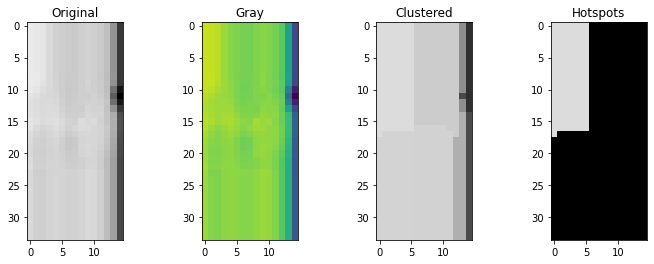

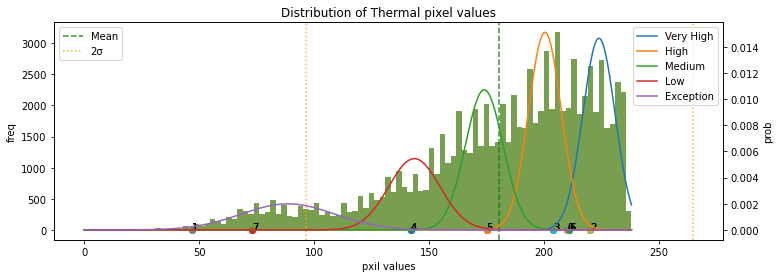

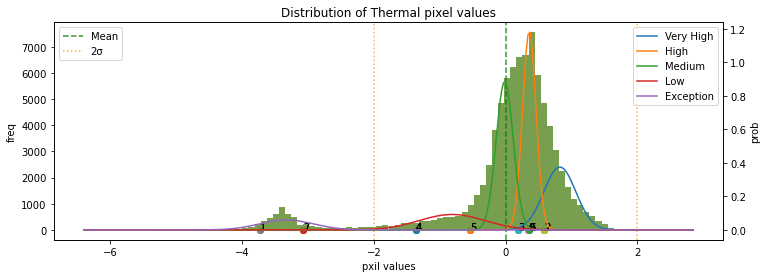

******* end *******
******* start *******
13.jpg
Module type: Normal
Cluster types1: ['Exception' 'Exception' 'Low' 'Exception' 'Exception' 'Exception' 'Low'
 'Exception']
Cluster types2: ['Medium' 'Low' 'Very High' 'Low' 'Low' 'Low' 'Very High' 'Medium']
Hotspot weights: 0.0


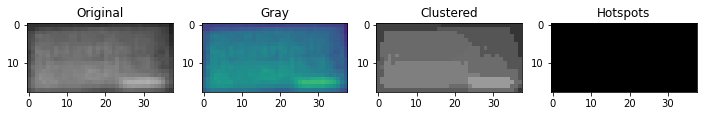

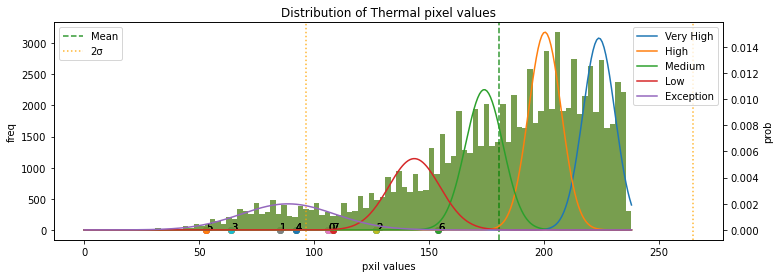

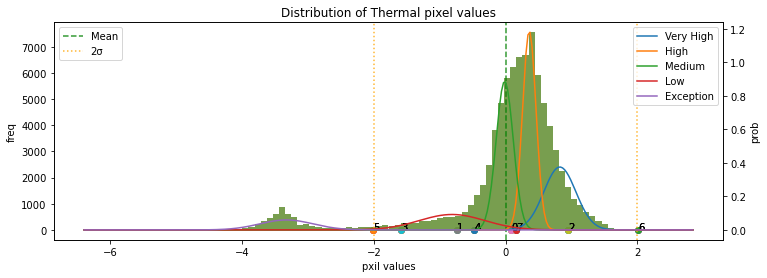

******* end *******
******* start *******
39.jpg
Module type: Single-Hotspot
Cluster types1: ['Low' 'High' 'Low' 'High' 'Very High' 'High' 'Medium' 'Medium']
Cluster types2: ['Exception' 'High' 'Low' 'High' 'Very High' 'High' 'Low' 'Low']
Hotspot weights: 0.15497076023391812


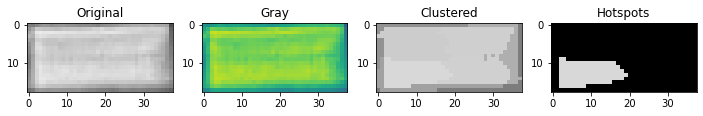

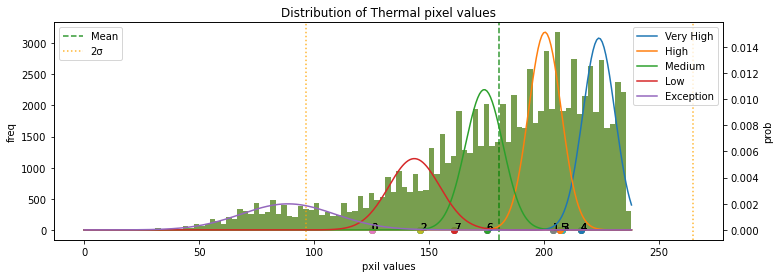

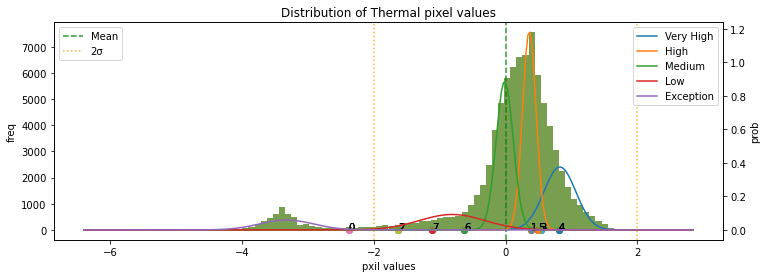

******* end *******
******* start *******
11.jpg
Module type: Normal
Cluster types1: ['Exception' 'Exception' 'Exception' 'Exception' 'Exception' 'Exception'
 'Exception' 'Exception']
Cluster types2: ['High' 'Medium' 'Low' 'Very High' 'Very High' 'Medium' 'Exception' 'Low']
Hotspot weights: 0.0


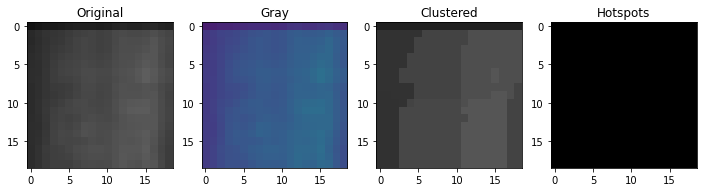

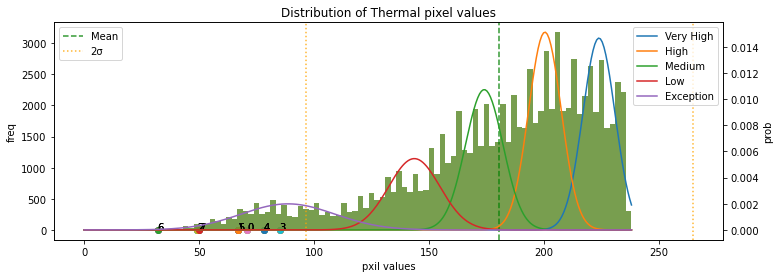

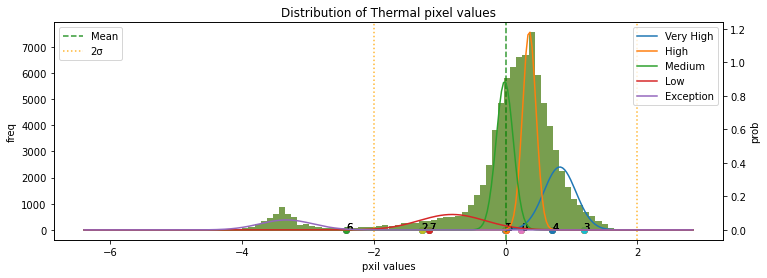

******* end *******
******* start *******
138.jpg
Module type: Normal
Cluster types1: ['High' 'Exception' 'High' 'High' 'High' 'Medium' 'High' 'Medium']
Cluster types2: ['High' 'Exception' 'High' 'High' 'High' 'Medium' 'Very High' 'Medium']
Hotspot weights: 0.0


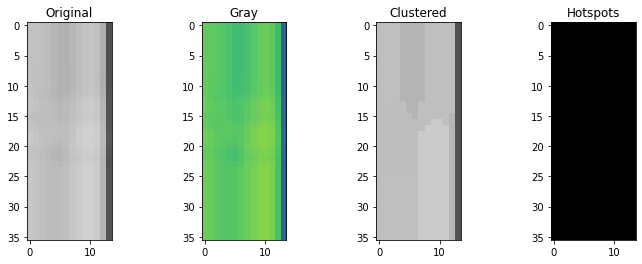

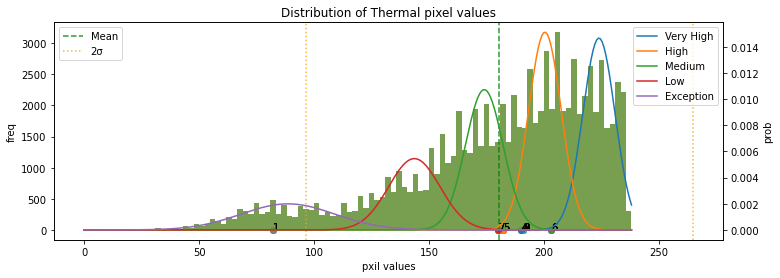

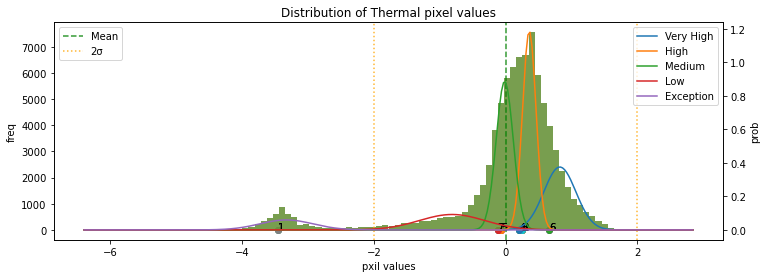

******* end *******
******* start *******
139.jpg
Module type: Single-Hotspot
Cluster types1: ['High' 'Exception' 'High' 'High' 'Very High' 'Exception' 'Medium' 'High']
Cluster types2: ['Medium' 'Exception' 'High' 'Medium' 'Very High' 'Exception' 'Low' 'High']
Hotspot weights: 0.17316017316017315


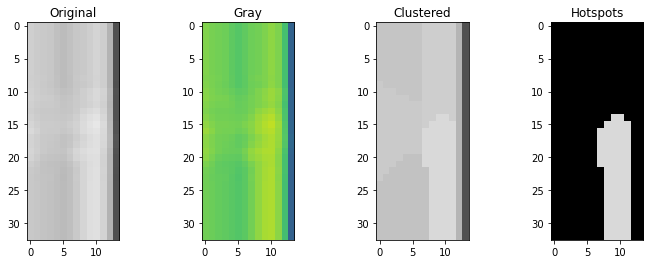

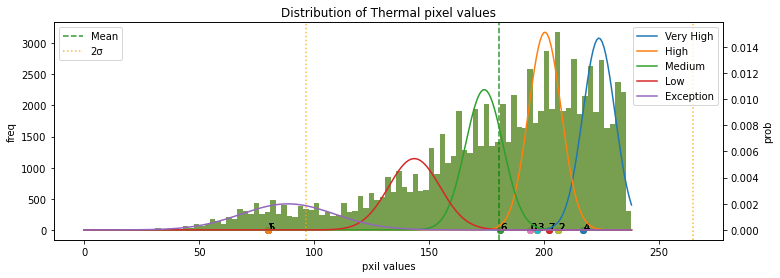

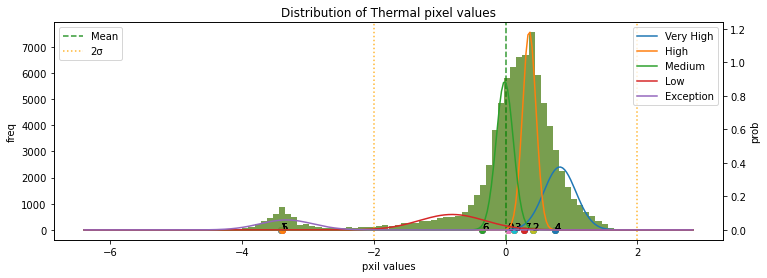

******* end *******
******* start *******
111.jpg
Module type: Normal
Cluster types1: ['Medium' 'High' 'Exception' 'High' 'High' 'Exception' 'Low' 'High']
Cluster types2: ['Low' 'High' 'Exception' 'High' 'High' 'Exception' 'Low' 'High']
Hotspot weights: 0.0


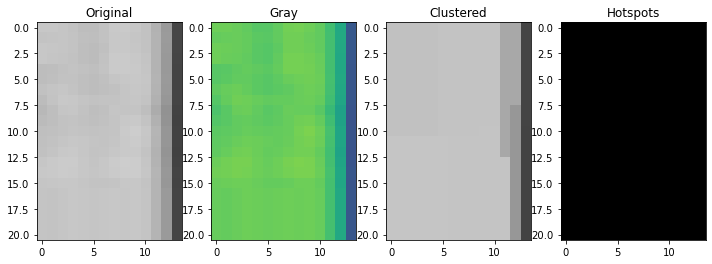

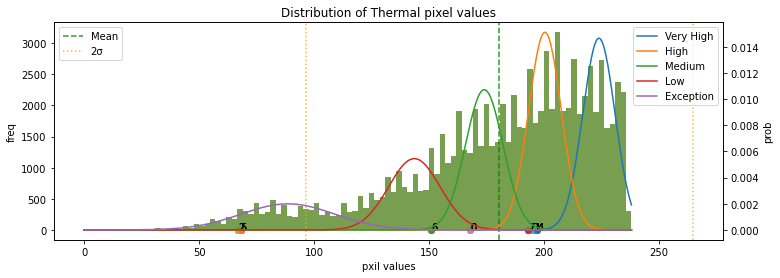

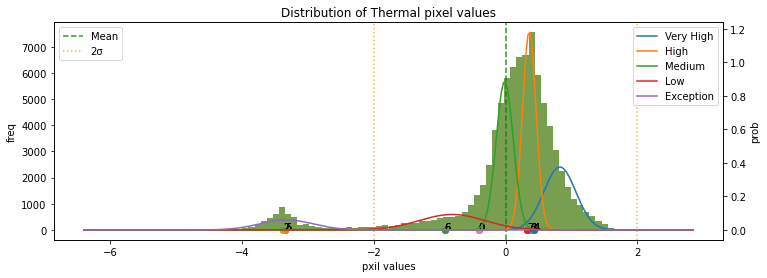

******* end *******
******* start *******
10.jpg
Module type: Normal
Cluster types1: ['Exception' 'Exception' 'Exception' 'Exception' 'Exception' 'Exception'
 'Exception' 'Exception']
Cluster types2: ['Low' 'Very High' 'Exception' 'High' 'High' 'Very High' 'Low' 'Medium']
Hotspot weights: 0.0


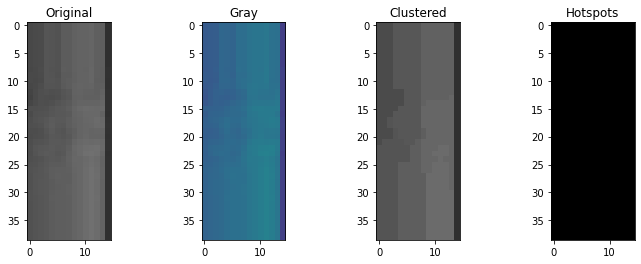

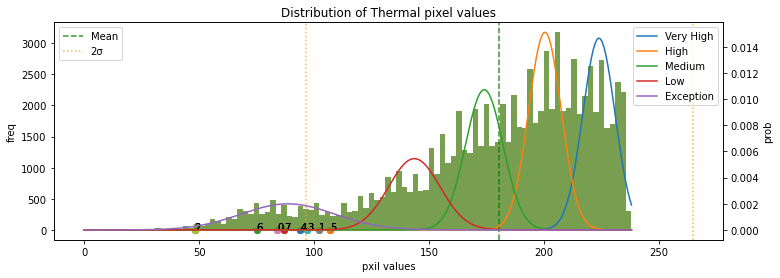

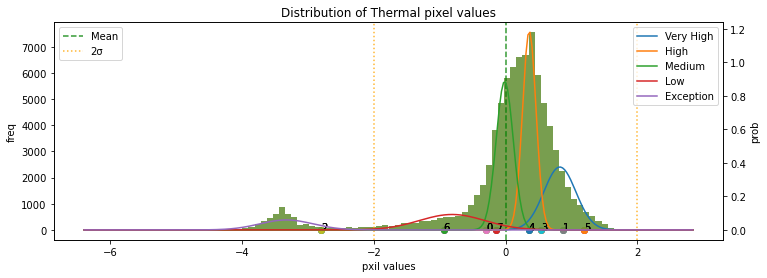

******* end *******
******* start *******
38.jpg
Module type: Normal
Cluster types1: ['Very High' 'Low' 'High' 'Exception' 'High' 'Very High' 'High' 'Medium']
Cluster types2: ['High' 'Low' 'High' 'Exception' 'High' 'High' 'High' 'Low']
Hotspot weights: 0.0


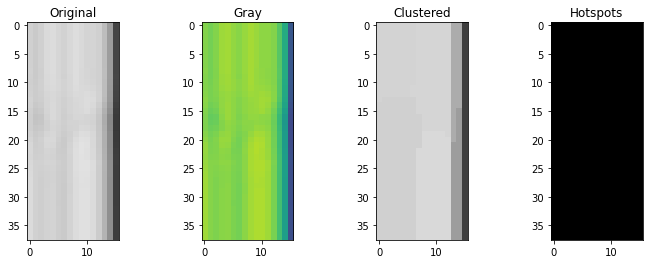

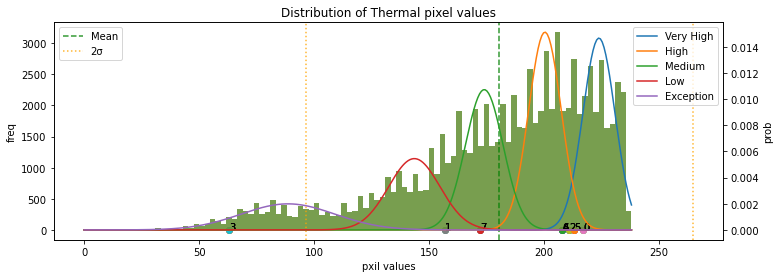

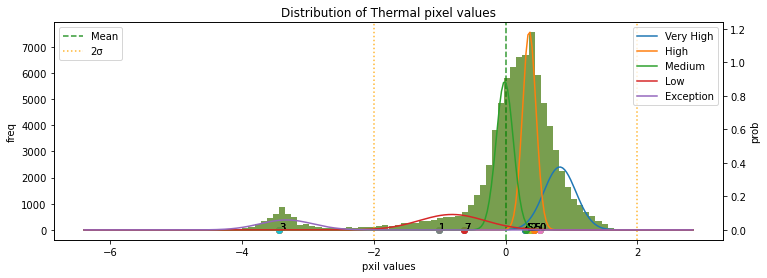

******* end *******
******* start *******
35.jpg
Module type: Normal
Cluster types1: ['Low' 'High' 'Exception' 'Medium' 'High' 'Medium' 'Medium' 'Medium']
Cluster types2: ['Low' 'Very High' 'Exception' 'Medium' 'Very High' 'High' 'High' 'Medium']
Hotspot weights: 0.0


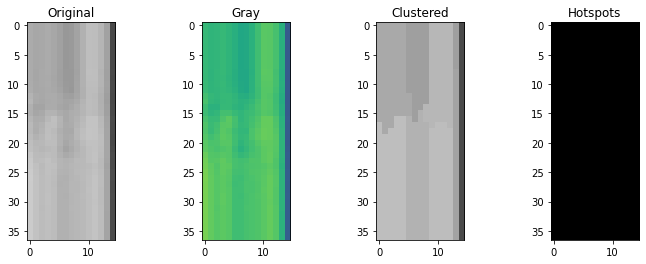

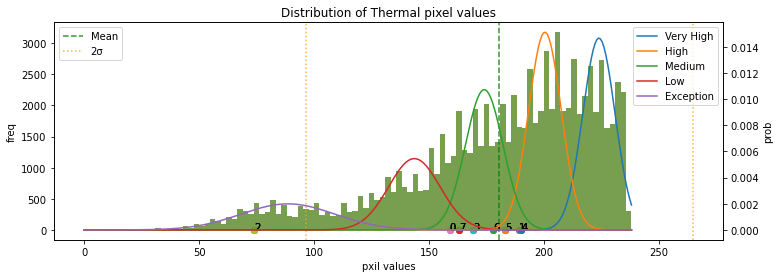

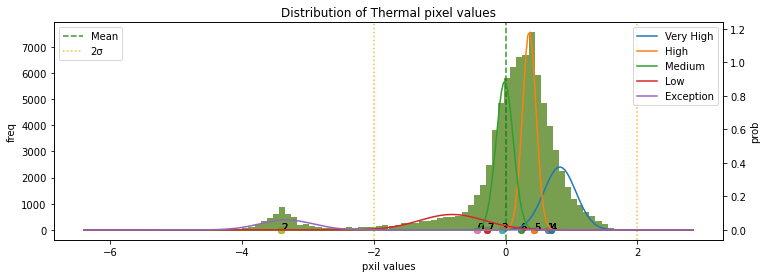

******* end *******
******* start *******
120.jpg
Module type: Normal
Cluster types1: ['Very High' 'Low' 'Very High' 'High' 'Very High' 'Medium' 'Medium'
 'Exception']
Cluster types2: ['High' 'Low' 'High' 'Medium' 'High' 'Low' 'Low' 'Exception']
Hotspot weights: 0.0


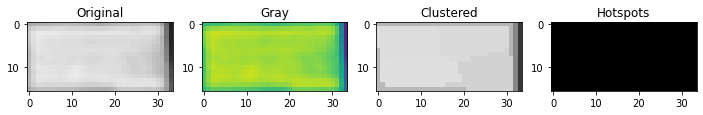

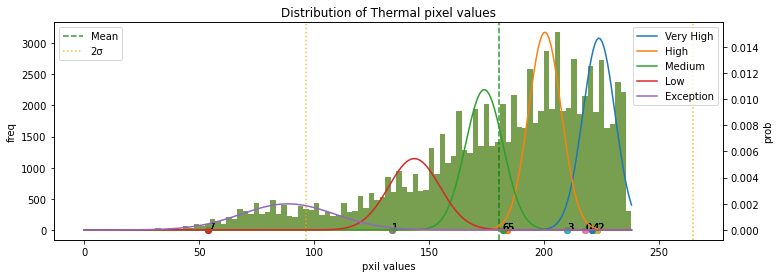

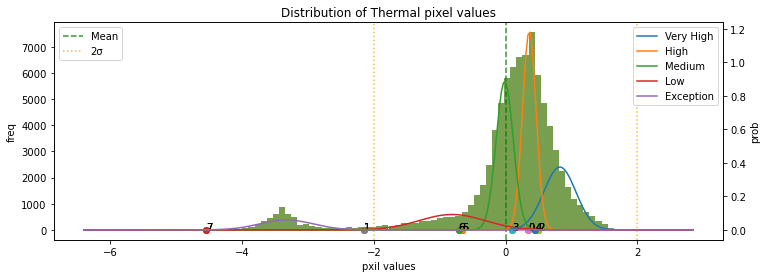

******* end *******
******* start *******
134.jpg
Module type: Normal
Cluster types1: ['Very High' 'Exception' 'Very High' 'High' 'High' 'High' 'Very High'
 'Very High']
Cluster types2: ['High' 'Exception' 'High' 'Medium' 'Medium' 'Medium' 'High' 'High']
Hotspot weights: 0.0


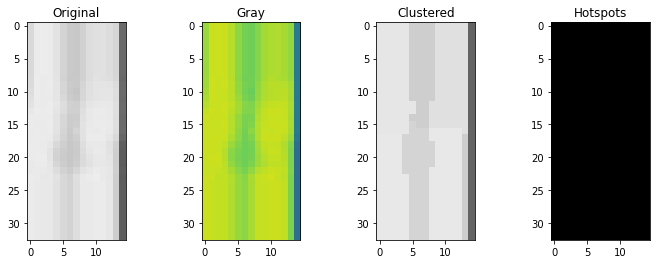

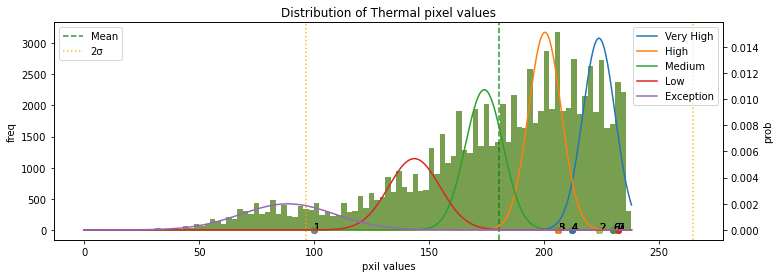

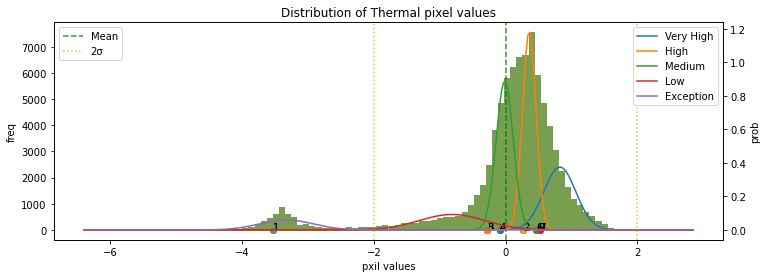

******* end *******
******* start *******
121.jpg
Module type: Normal
Cluster types1: ['Very High' 'Exception' 'Very High' 'Medium' 'Very High' 'Very High'
 'Medium' 'Very High']
Cluster types2: ['High' 'Exception' 'High' 'Low' 'High' 'High' 'Low' 'High']
Hotspot weights: 0.0


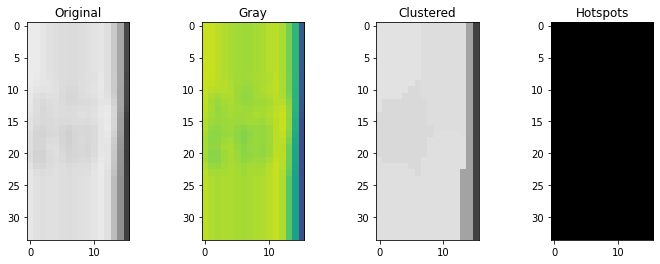

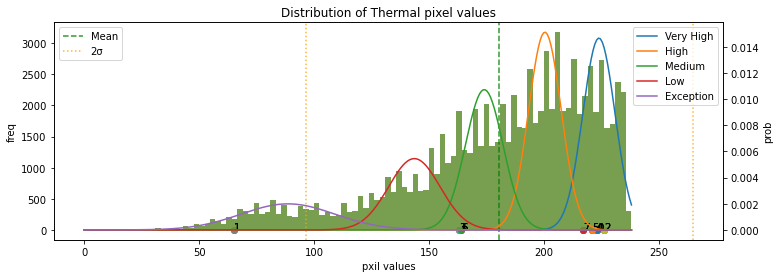

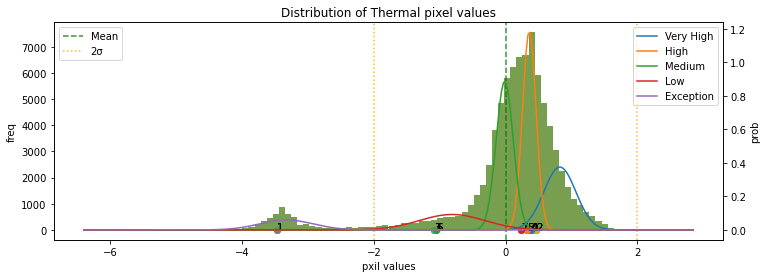

******* end *******
******* start *******
34.jpg
Module type: Single-Hotspot
Cluster types1: ['High' 'Exception' 'Very High' 'High' 'High' 'High' 'High' 'Medium']
Cluster types2: ['High' 'Exception' 'Very High' 'Medium' 'Medium' 'Medium' 'High' 'Low']
Hotspot weights: 0.12612612612612611


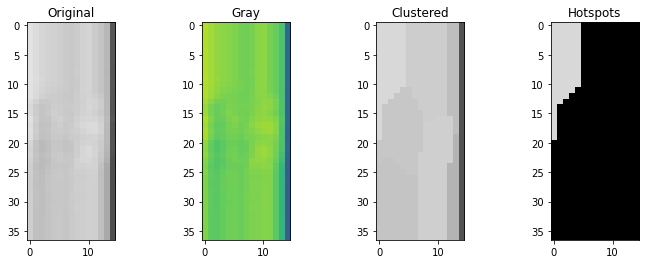

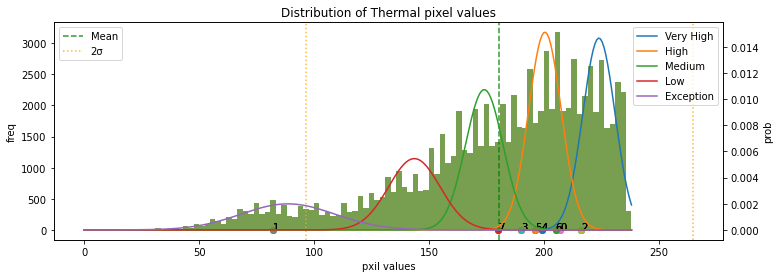

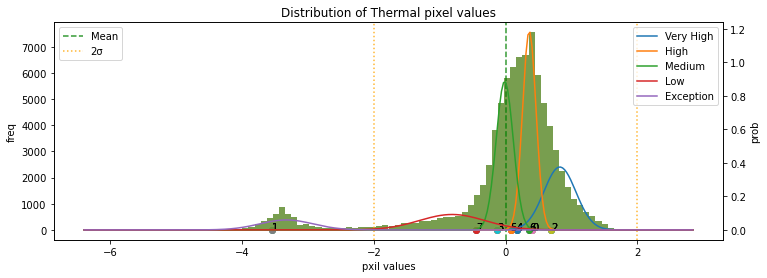

******* end *******
******* start *******
36.jpg
Module type: Normal
Cluster types1: ['High' 'Medium' 'Low' 'High' 'High' 'High' 'Medium' 'Medium']
Cluster types2: ['Medium' 'Low' 'Exception' 'Very High' 'High' 'Very High' 'Low' 'Low']
Hotspot weights: 0.0


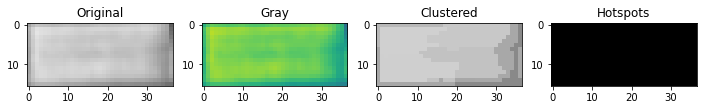

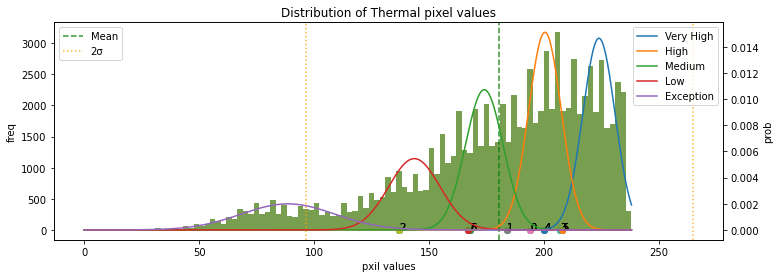

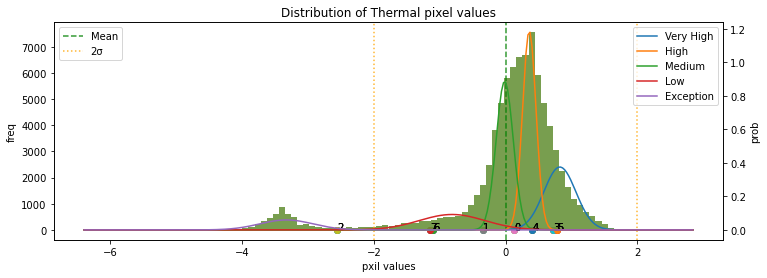

******* end *******
******* start *******
137.jpg
Module type: Normal
Cluster types1: ['Very High' 'Exception' 'Very High' 'High' 'Very High' 'Very High'
 'Exception' 'Very High']
Cluster types2: ['High' 'Exception' 'Medium' 'Medium' 'High' 'High' 'Exception' 'High']
Hotspot weights: 0.0


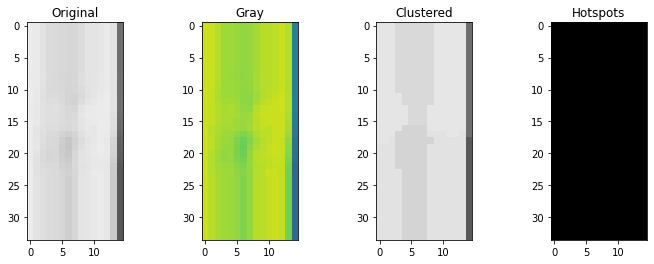

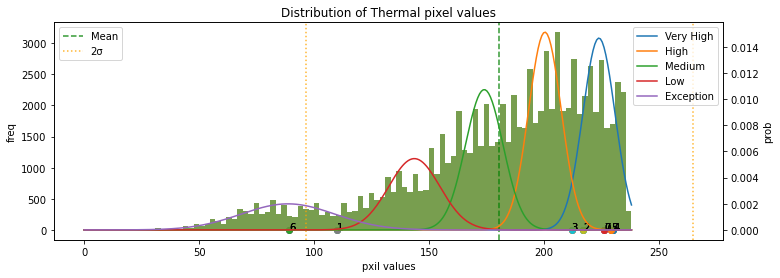

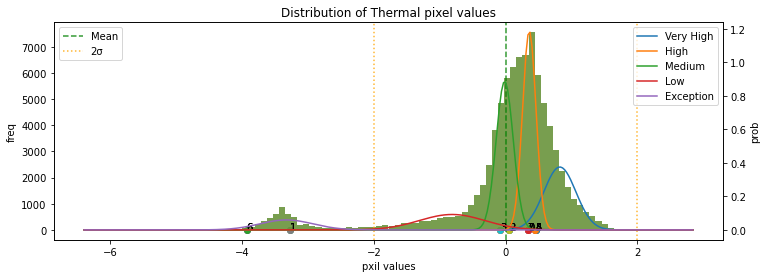

******* end *******
******* start *******
123.jpg
Module type: Normal
Cluster types1: ['Very High' 'Exception' 'Very High' 'High' 'Very High' 'Low' 'Very High'
 'Very High']
Cluster types2: ['High' 'Exception' 'High' 'Low' 'High' 'Low' 'High' 'High']
Hotspot weights: 0.0


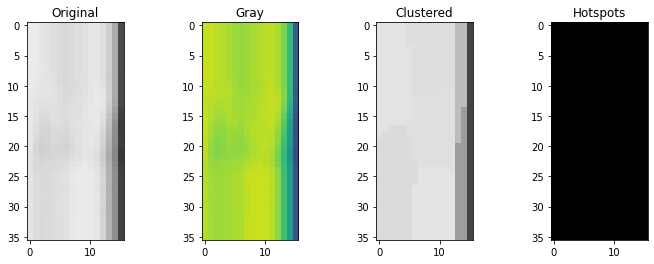

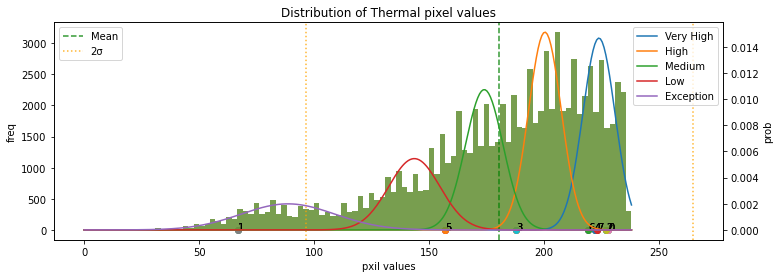

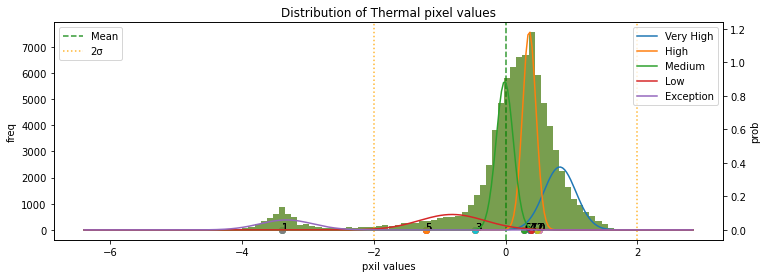

******* end *******
******* start *******
136.jpg
Module type: Normal
Cluster types1: ['Exception' 'Very High' 'Very High' 'Very High' 'Very High' 'Exception'
 'High' 'Very High']
Cluster types2: ['Exception' 'High' 'High' 'High' 'Medium' 'Exception' 'Medium' 'High']
Hotspot weights: 0.0


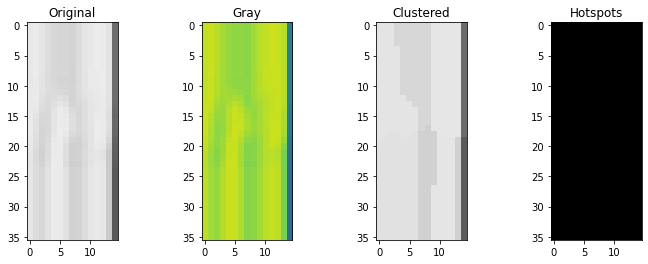

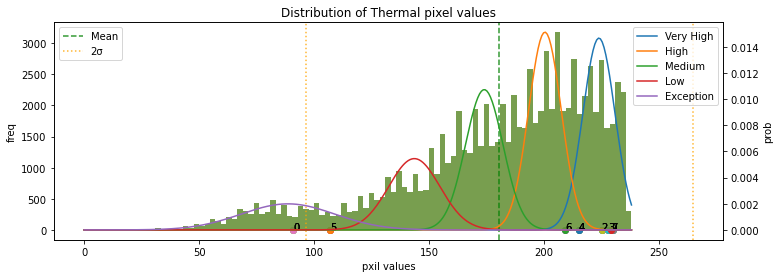

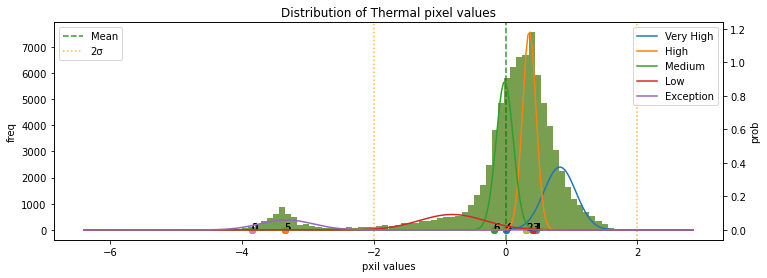

******* end *******
******* start *******
37.jpg
Module type: Single-Hotspot
Cluster types1: ['Very High' 'Exception' 'High' 'Low' 'High' 'High' 'High' 'Medium']
Cluster types2: ['Very High' 'Exception' 'High' 'Low' 'High' 'High' 'High' 'Low']
Hotspot weights: 0.16722972972972974


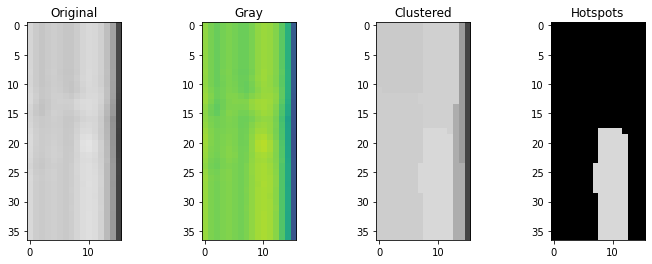

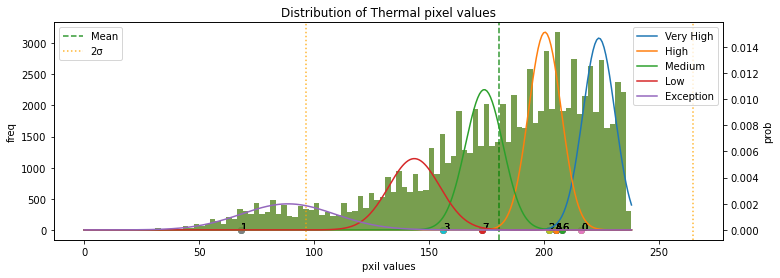

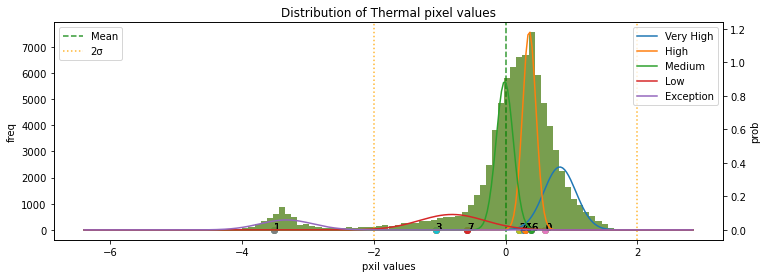

******* end *******
******* start *******
33.jpg
Module type: Single-Hotspot
Cluster types1: ['High' 'High' 'Exception' 'High' 'Very High' 'High' 'Low' 'High']
Cluster types2: ['High' 'Medium' 'Exception' 'High' 'Very High' 'High' 'Low' 'High']
Hotspot weights: 0.08518518518518518


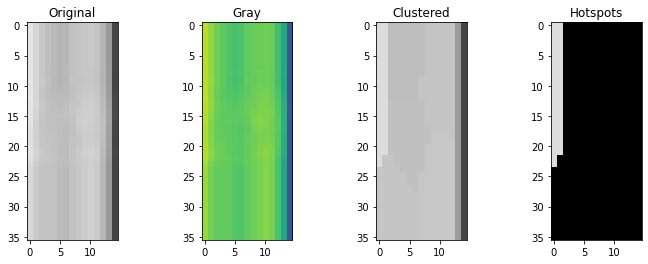

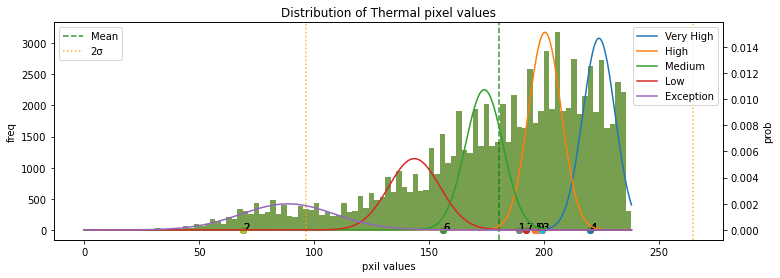

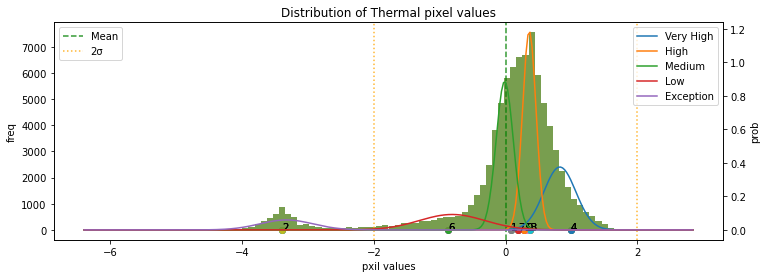

******* end *******
******* start *******
132.jpg
Module type: Normal
Cluster types1: ['Very High' 'Exception' 'Very High' 'Very High' 'Very High' 'High' 'High'
 'Exception']
Cluster types2: ['High' 'Exception' 'High' 'High' 'High' 'Medium' 'Medium' 'Exception']
Hotspot weights: 0.0


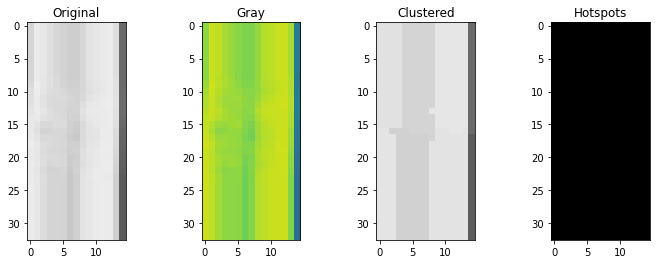

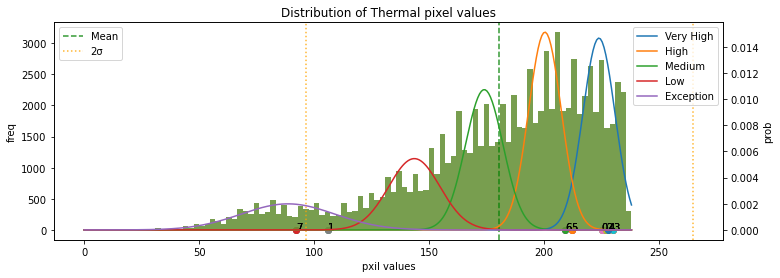

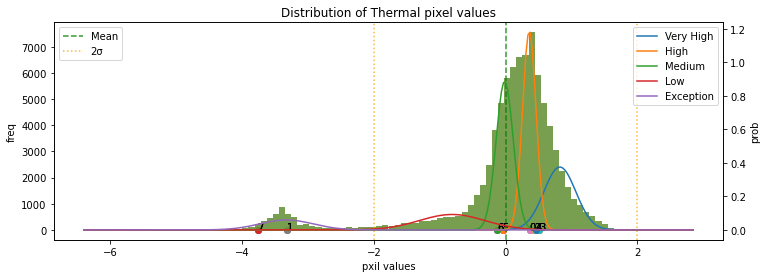

******* end *******
******* start *******
126.jpg
Module type: Single-Hotspot
Cluster types1: ['High' 'High' 'Exception' 'Very High' 'High' 'Very High' 'Very High'
 'Very High']
Cluster types2: ['Medium' 'Medium' 'Exception' 'High' 'Medium' 'High' 'Very High' 'High']
Hotspot weights: 0.15756302521008403


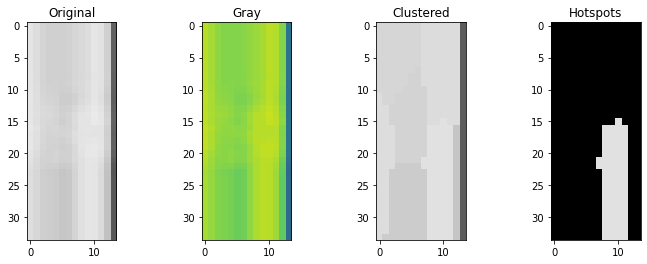

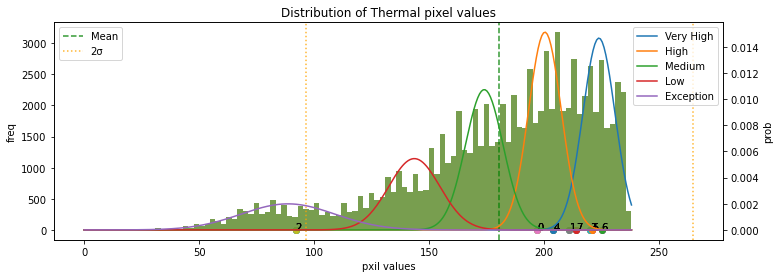

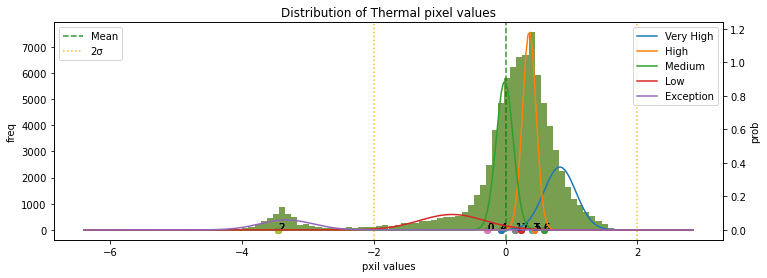

******* end *******
******* start *******
127.jpg
Module type: Normal
Cluster types1: ['Low' 'Very High' 'Very High' 'Exception' 'Very High' 'Medium'
 'Very High' 'Very High']
Cluster types2: ['Low' 'High' 'High' 'Exception' 'High' 'Low' 'High' 'High']
Hotspot weights: 0.0


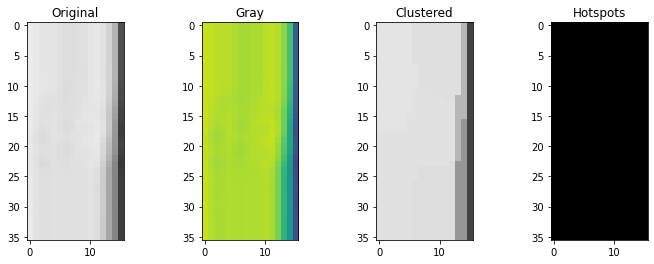

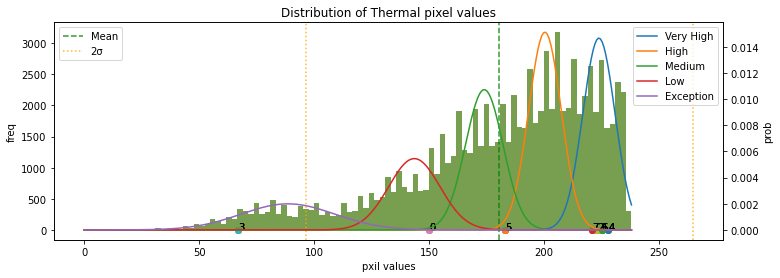

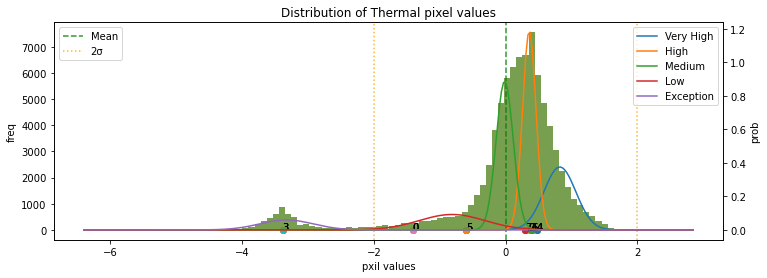

******* end *******
******* start *******
133.jpg
Module type: Multi-Hotspots
Cluster types1: ['Very High' 'Medium' 'Very High' 'Very High' 'Very High' 'Low' 'Medium'
 'High']
Cluster types2: ['Very High' 'Low' 'Medium' 'Very High' 'Very High' 'Exception' 'Low'
 'Medium']
Hotspot weights: 0.4685714285714286


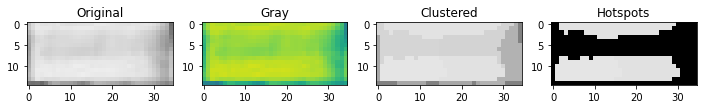

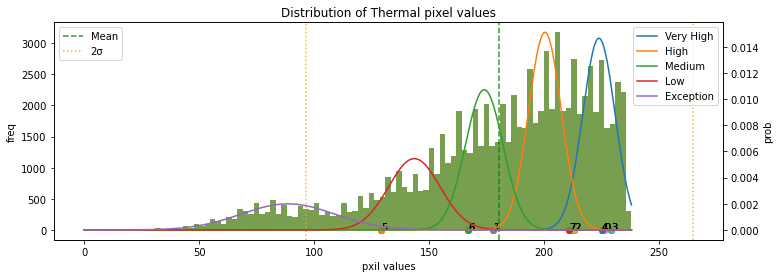

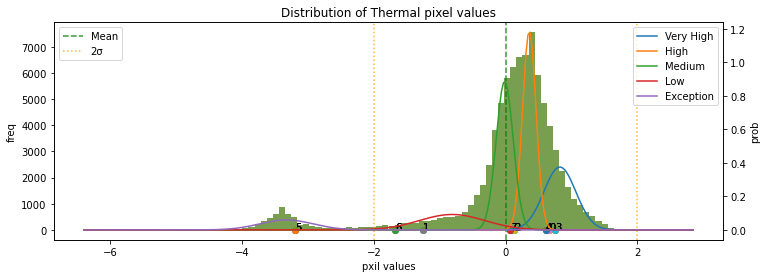

******* end *******
******* start *******
32.jpg
Module type: Normal
Cluster types1: ['Medium' 'Exception' 'High' 'Medium' 'Medium' 'High' 'Low' 'High']
Cluster types2: ['High' 'Exception' 'High' 'High' 'High' 'Very High' 'Low' 'High']
Hotspot weights: 0.0


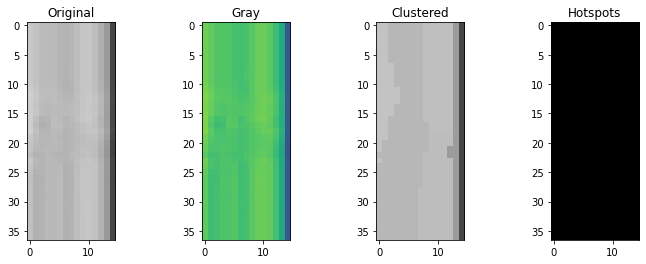

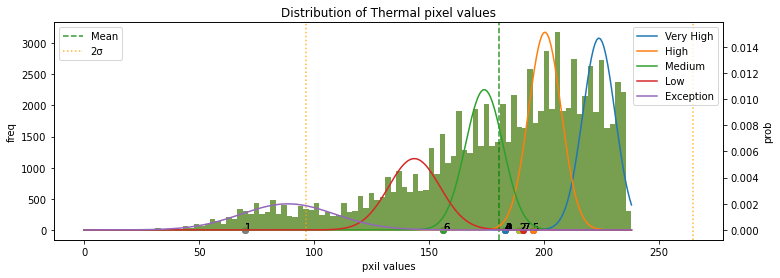

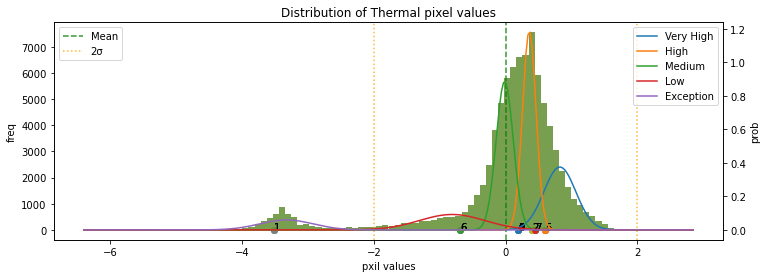

******* end *******
******* start *******
18.jpg
Module type: Normal
Cluster types1: ['Low' 'Low' 'Exception' 'Medium' 'Low' 'Low' 'Low' 'Low']
Cluster types2: ['Medium' 'Medium' 'Exception' 'Very High' 'Low' 'Medium' 'Very High'
 'Very High']
Hotspot weights: 0.0


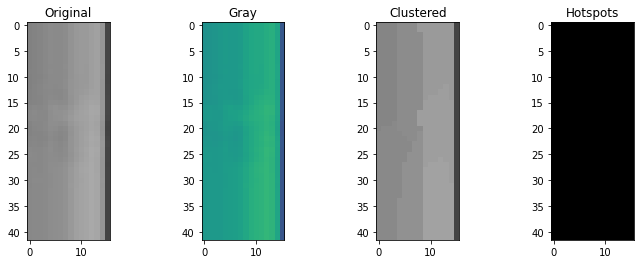

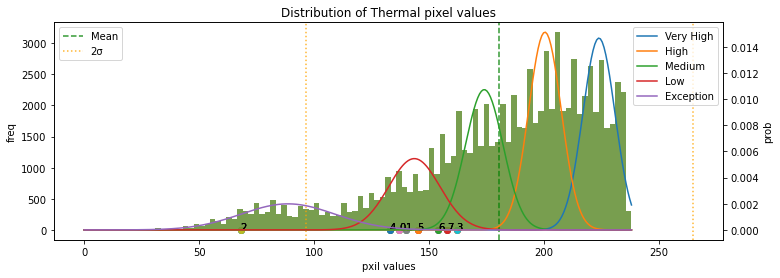

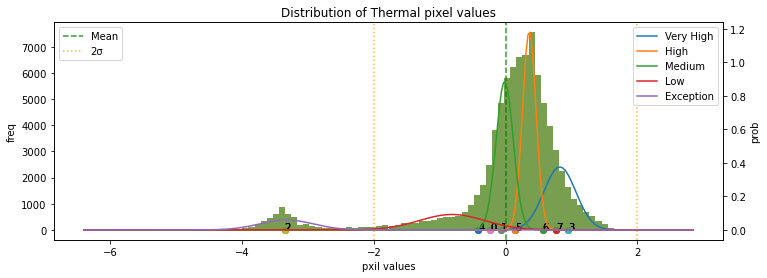

******* end *******
******* start *******
30.jpg
Module type: Normal
Cluster types1: ['Medium' 'Exception' 'Medium' 'Low' 'Low' 'Exception' 'Medium' 'Medium']
Cluster types2: ['High' 'Exception' 'Very High' 'Low' 'Medium' 'Low' 'High' 'High']
Hotspot weights: 0.0


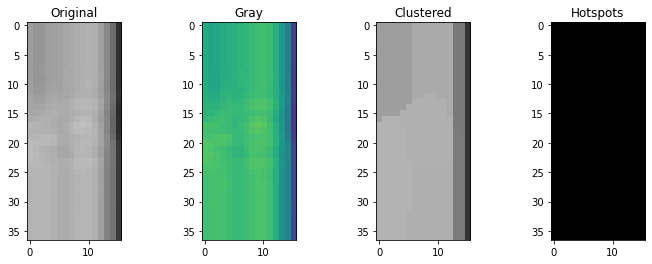

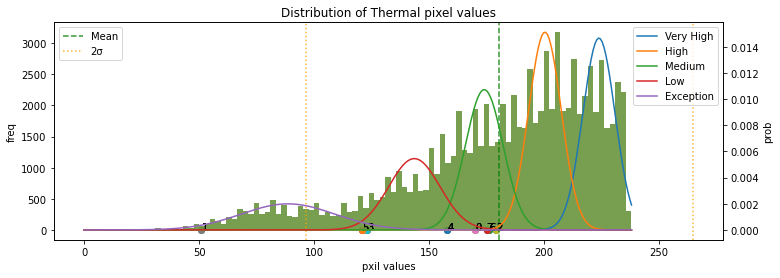

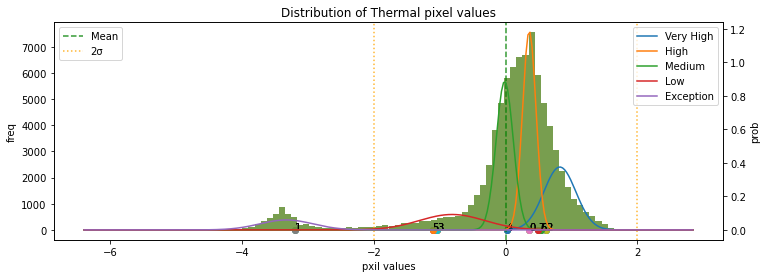

******* end *******
******* start *******
131.jpg
Module type: Multi-Hotspots
Cluster types1: ['Very High' 'Very High' 'Exception' 'Medium' 'Medium' 'Very High'
 'Very High' 'High']
Cluster types2: ['High' 'Very High' 'Exception' 'Low' 'Low' 'Very High' 'High' 'Medium']
Hotspot weights: 0.30707070707070705


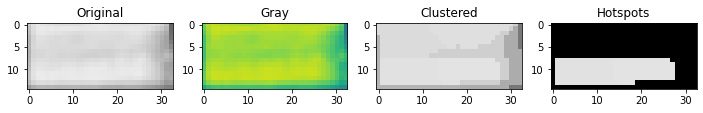

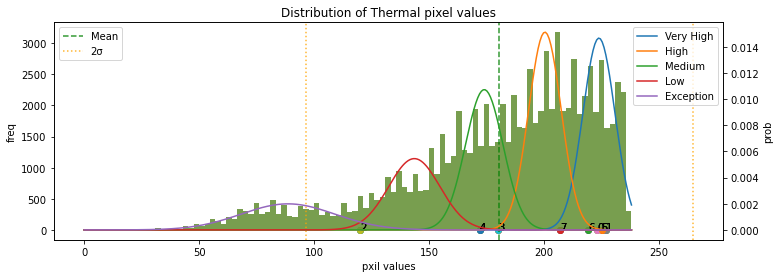

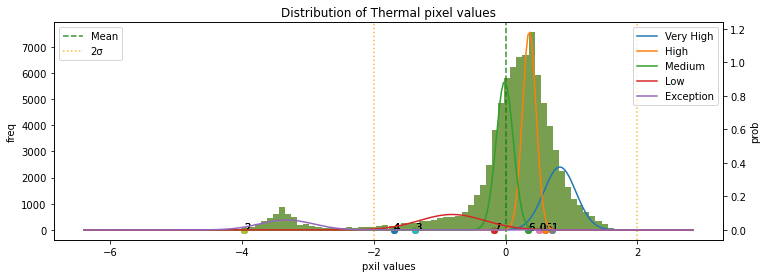

******* end *******
******* start *******
119.jpg
Module type: Single-Hotspot
Cluster types1: ['Very High' 'Medium' 'Low' 'Very High' 'Medium' 'Medium' 'Very High'
 'Very High']
Cluster types2: ['High' 'Low' 'Exception' 'High' 'Low' 'Low' 'Very High' 'High']
Hotspot weights: 0.20036764705882354


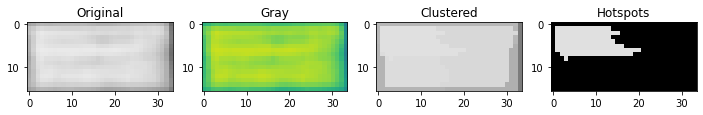

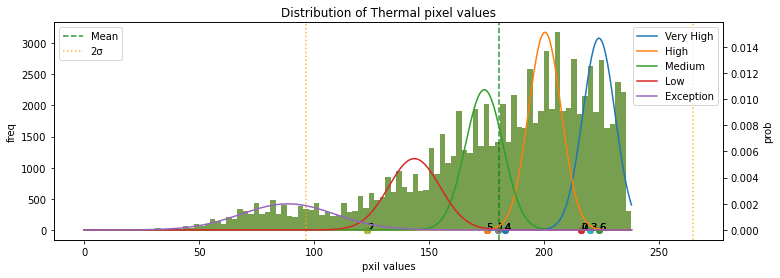

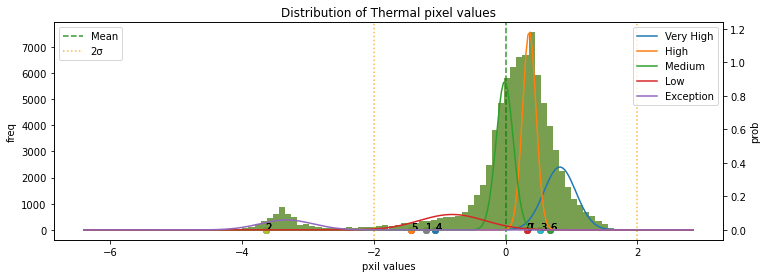

******* end *******
******* start *******
118.jpg
Module type: Single-Hotspot
Cluster types1: ['Very High' 'Low' 'Very High' 'Exception' 'Medium' 'Very High'
 'Very High' 'Medium']
Cluster types2: ['Very High' 'Low' 'High' 'Exception' 'Low' 'High' 'High' 'Low']
Hotspot weights: 0.21714285714285714


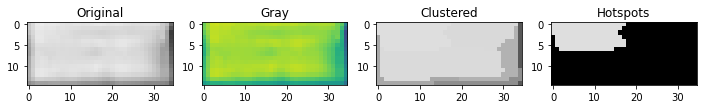

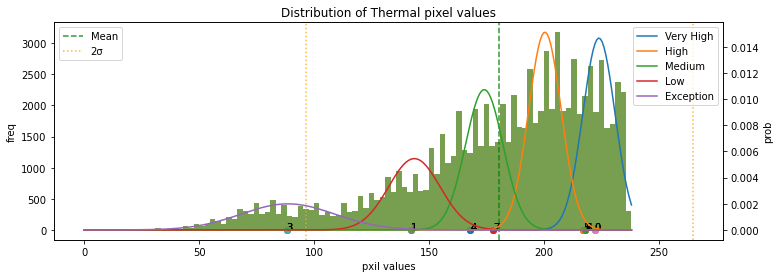

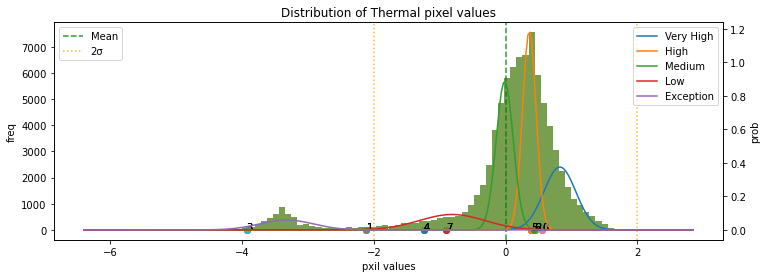

******* end *******
******* start *******
130.jpg
Module type: Multi-Hotspots
Cluster types1: ['High' 'Exception' 'Very High' 'Very High' 'High' 'Very High' 'High'
 'Very High']
Cluster types2: ['Medium' 'Exception' 'High' 'Very High' 'Medium' 'High' 'Medium'
 'Very High']
Hotspot weights: 0.24791666666666667


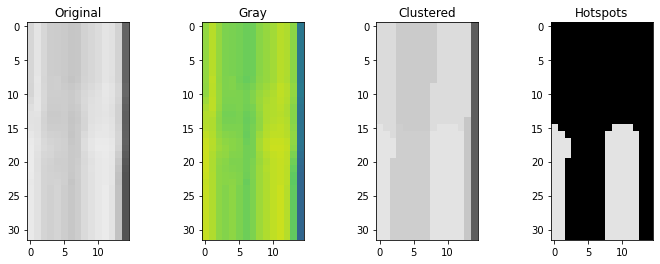

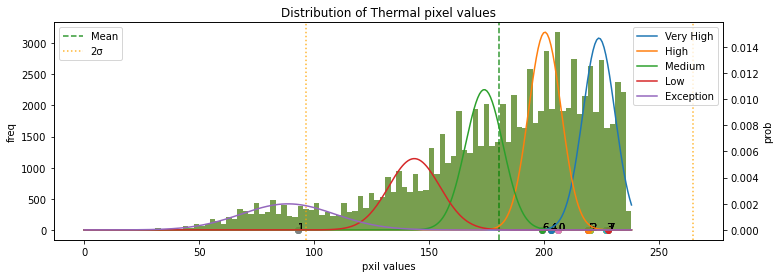

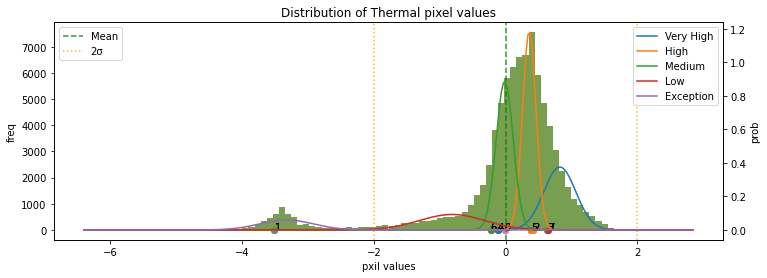

******* end *******
******* start *******
124.jpg
Module type: Single-Hotspot
Cluster types1: ['High' 'Exception' 'High' 'Medium' 'High' 'High' 'Very High' 'High']
Cluster types2: ['High' 'Exception' 'Medium' 'Low' 'High' 'High' 'Very High' 'Very High']
Hotspot weights: 0.12605042016806722


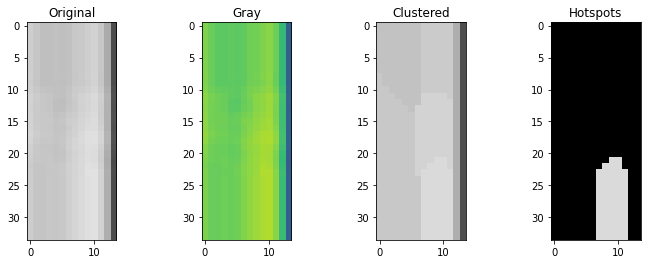

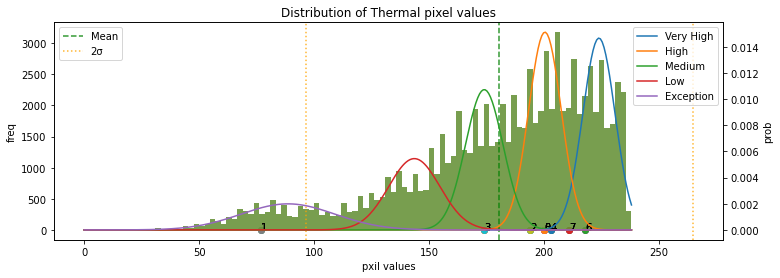

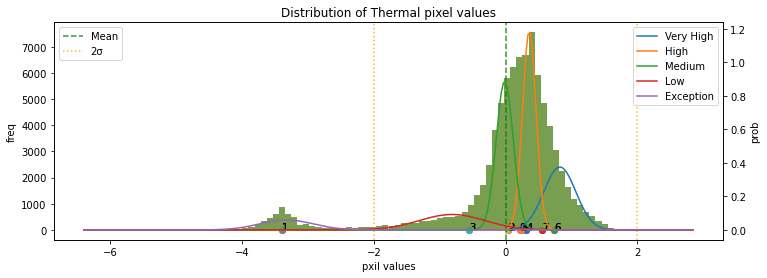

******* end *******
******* start *******
31.jpg
Module type: Normal
Cluster types1: ['Medium' 'Exception' 'Low' 'Medium' 'Medium' 'High' 'Medium' 'Medium']
Cluster types2: ['High' 'Exception' 'Low' 'High' 'High' 'Very High' 'High' 'Medium']
Hotspot weights: 0.0


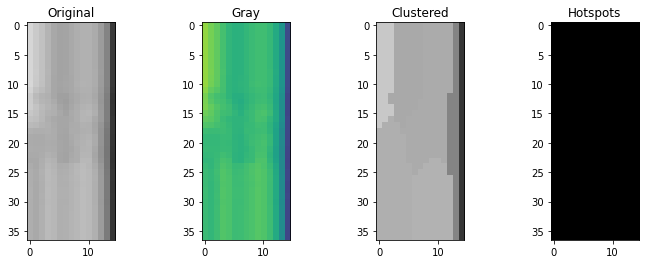

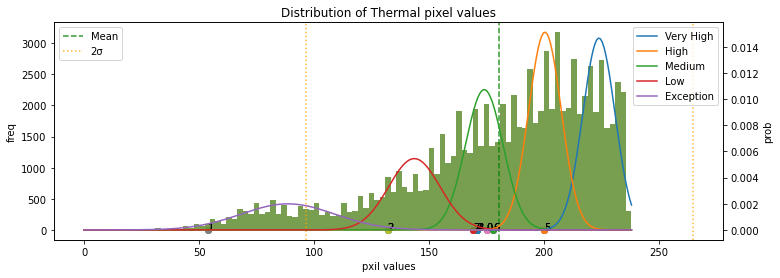

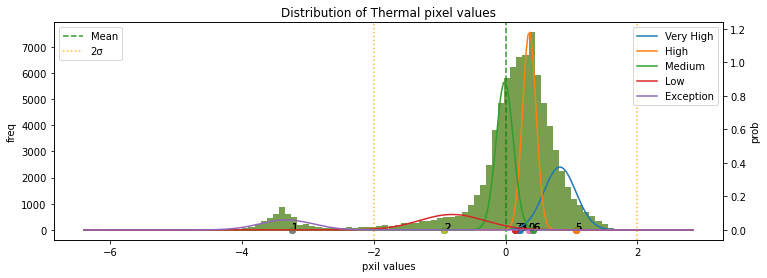

******* end *******
******* start *******
19.jpg
Module type: Normal
Cluster types1: ['Exception' 'Low' 'Exception' 'Exception' 'Exception' 'Low' 'Exception'
 'Exception']
Cluster types2: ['Medium' 'Very High' 'Exception' 'High' 'Low' 'Very High' 'Low' 'High']
Hotspot weights: 0.0


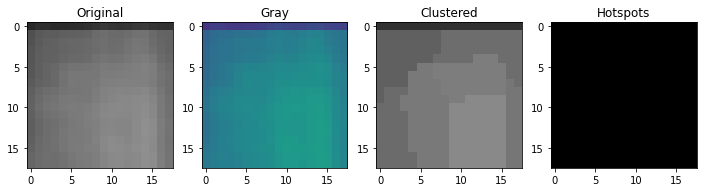

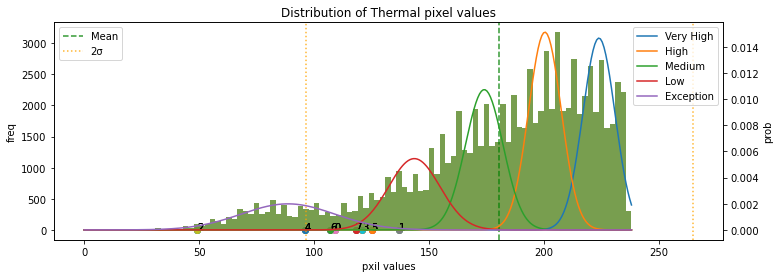

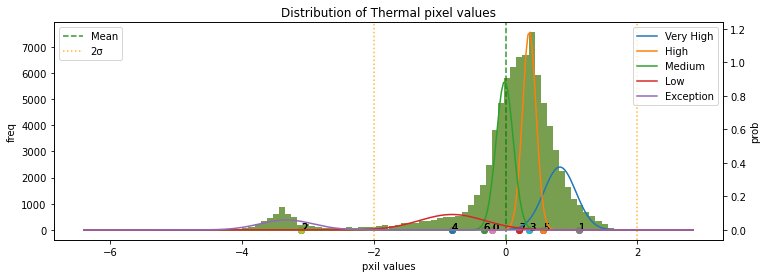

******* end *******
******* start *******
42.jpg
Module type: Single-Hotspot
Cluster types1: ['Medium' 'High' 'Very High' 'Exception' 'High' 'High' 'High' 'High']
Cluster types2: ['Low' 'Medium' 'Very High' 'Exception' 'High' 'Medium' 'High' 'High']
Hotspot weights: 0.09775641025641026


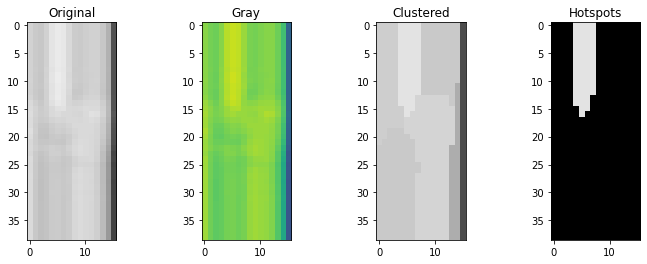

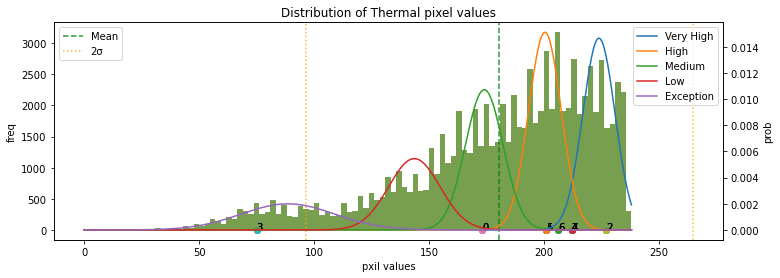

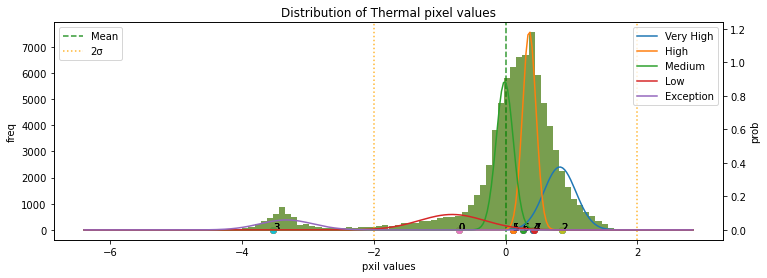

******* end *******
******* start *******
4.jpg
Module type: Normal
Cluster types1: ['Low' 'Exception' 'Low' 'Low' 'Low' 'Low' 'Low' 'Low']
Cluster types2: ['High' 'Exception' 'High' 'Low' 'High' 'High' 'Medium' 'Low']
Hotspot weights: 0.0


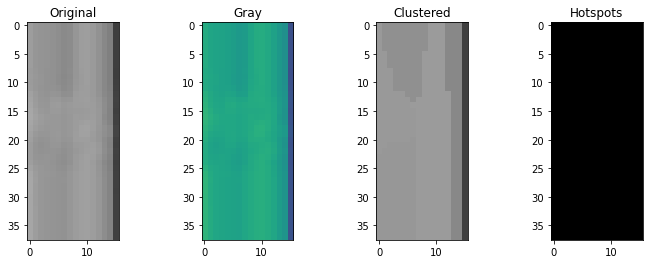

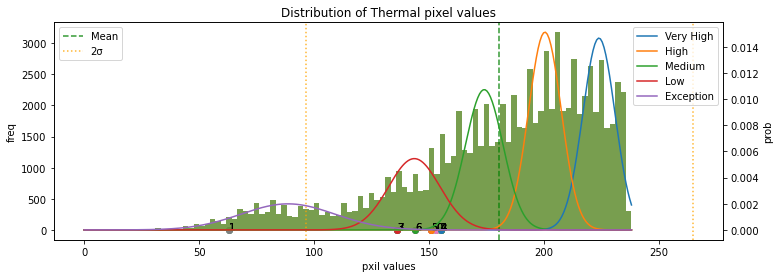

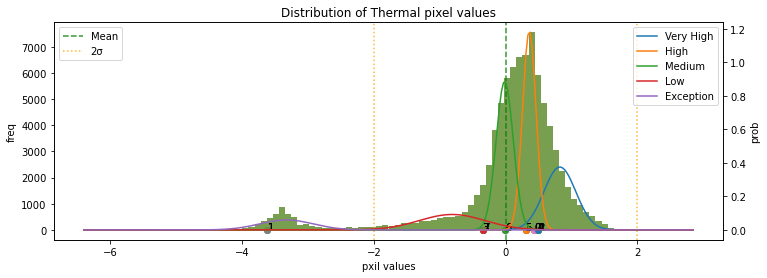

******* end *******
******* start *******
56.jpg
Module type: Single-Hotspot
Cluster types1: ['High' 'Exception' 'Very High' 'Very High' 'High' 'Very High' 'Medium'
 'High']
Cluster types2: ['Medium' 'Exception' 'High' 'Very High' 'Medium' 'High' 'Low' 'Low']
Hotspot weights: 0.08388157894736842


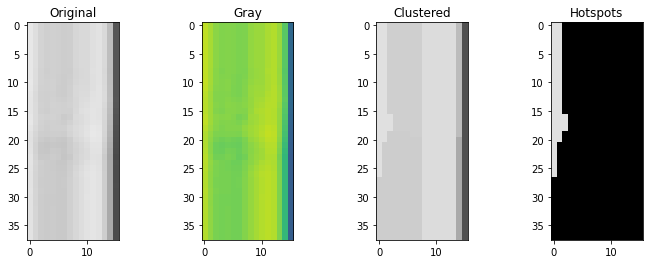

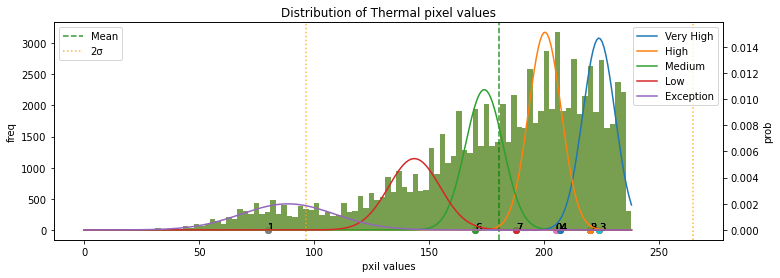

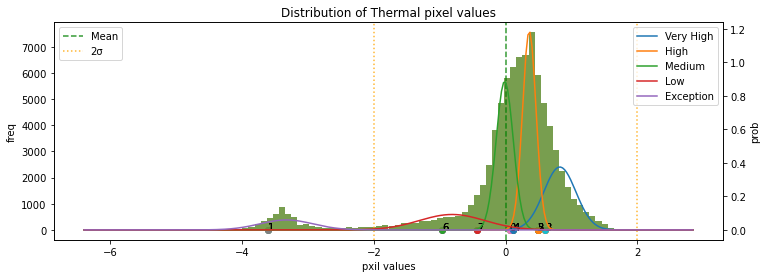

******* end *******
******* start *******
180.jpg
Module type: Normal
Cluster types1: ['Very High' 'Exception' 'Very High' 'Very High' 'Very High' 'Very High'
 'High' 'Very High']
Cluster types2: ['High' 'Exception' 'High' 'Medium' 'High' 'High' 'Low' 'High']
Hotspot weights: 0.0


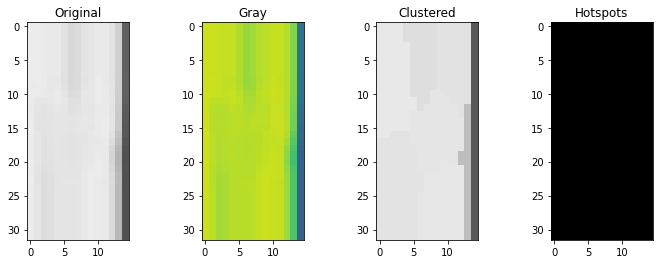

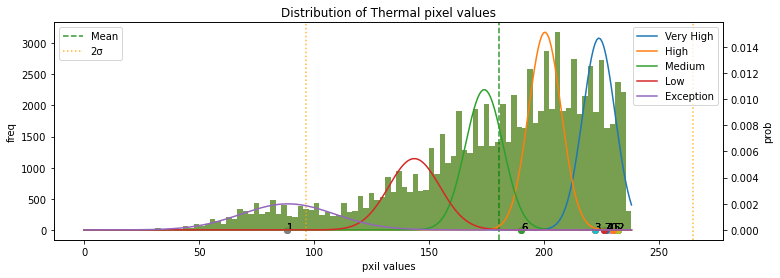

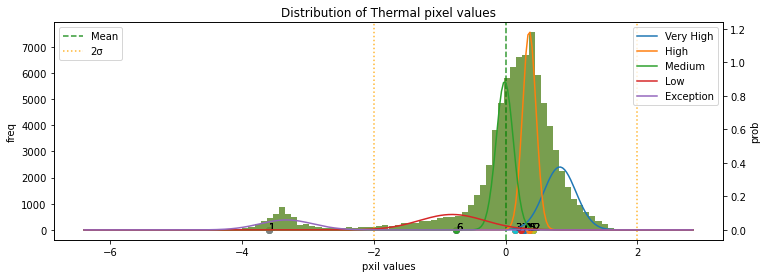

******* end *******
******* start *******
81.jpg
Module type: Normal
Cluster types1: ['Low' 'Medium' 'Exception' 'Low' 'Medium' 'Low' 'Medium' 'Low']
Cluster types2: ['Medium' 'High' 'Exception' 'Medium' 'Very High' 'Medium' 'Very High'
 'Low']
Hotspot weights: 0.0


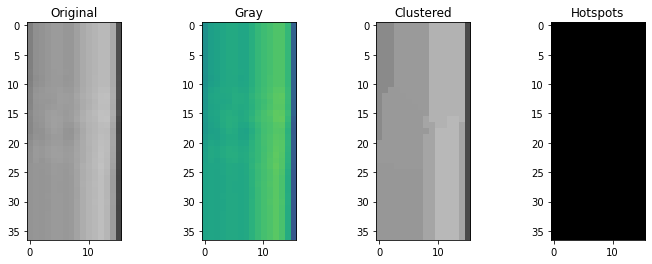

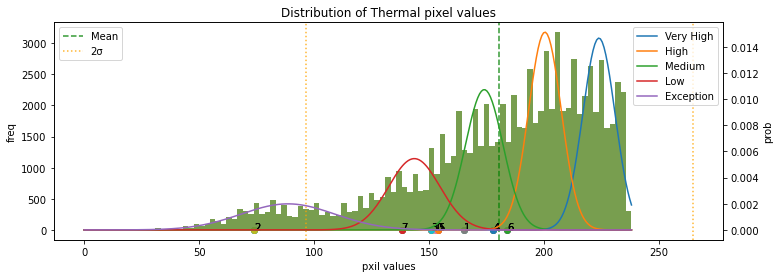

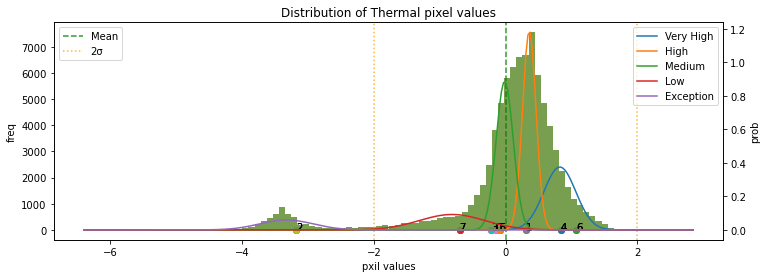

******* end *******
******* start *******
143.jpg
Module type: Single-Hotspot
Cluster types1: ['Very High' 'Low' 'Medium' 'Very High' 'Very High' 'Very High' 'High'
 'Exception']
Cluster types2: ['High' 'Low' 'Low' 'Very High' 'High' 'High' 'Low' 'Exception']
Hotspot weights: 0.15865384615384615


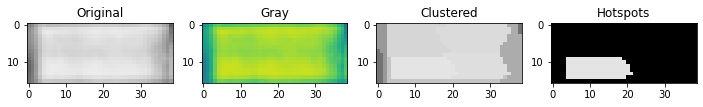

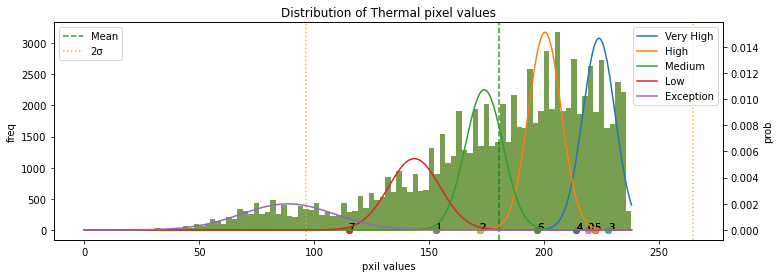

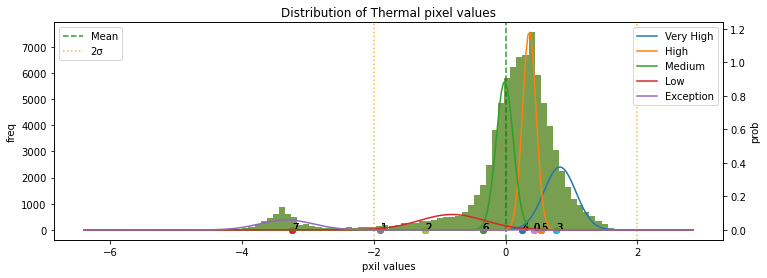

******* end *******
******* start *******
157.jpg
Module type: Normal
Cluster types1: ['Medium' 'High' 'Exception' 'High' 'Medium' 'Exception' 'Medium' 'Medium']
Cluster types2: ['Medium' 'Very High' 'Exception' 'Very High' 'Low' 'Exception' 'Medium'
 'Medium']
Hotspot weights: 0.0


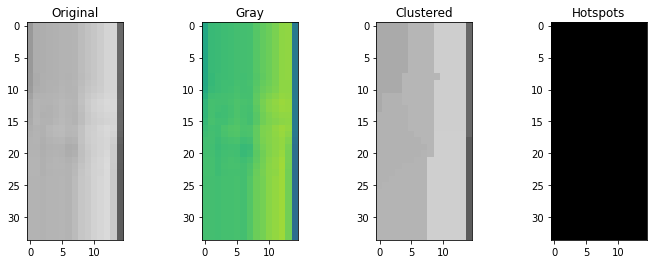

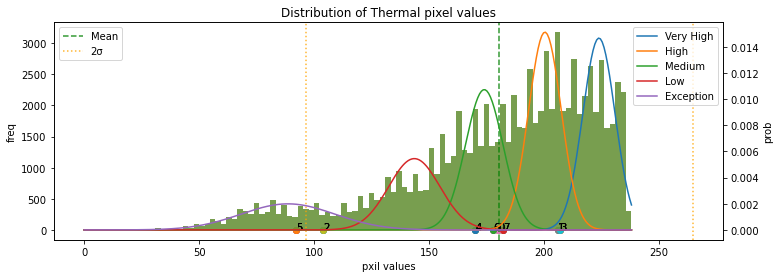

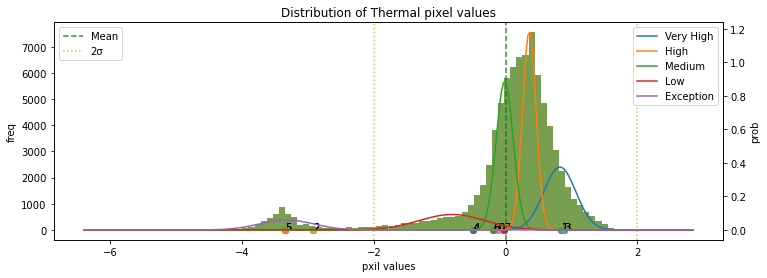

******* end *******
******* start *******
209.jpg
Module type: Multi-Hotspots
Cluster types1: ['High' 'Very High' 'Exception' 'Very High' 'High' 'Very High' 'Medium'
 'High']
Cluster types2: ['Medium' 'Very High' 'Exception' 'Very High' 'Medium' 'High' 'Low'
 'Medium']
Hotspot weights: 0.27455357142857145


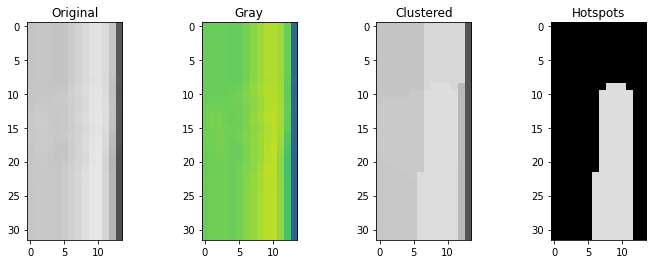

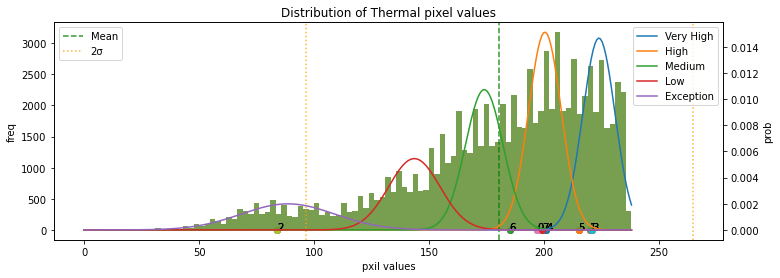

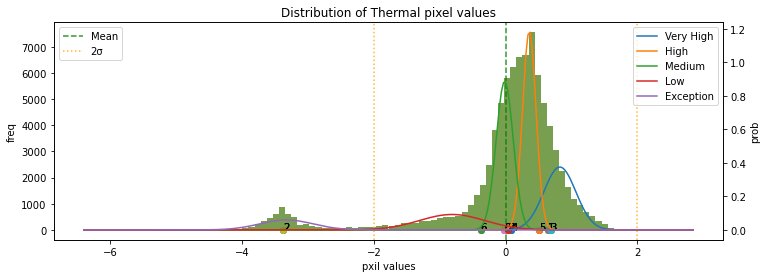

******* end *******
******* start *******
208.jpg
Module type: Single-Hotspot
Cluster types1: ['Medium' 'Medium' 'Exception' 'High' 'High' 'Very High' 'High' 'High']
Cluster types2: ['Medium' 'Medium' 'Exception' 'Very High' 'Medium' 'Very High' 'Medium'
 'Medium']
Hotspot weights: 0.171875


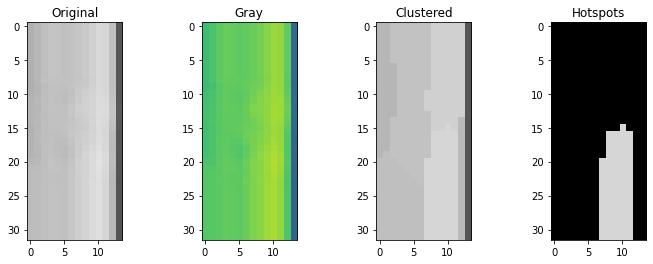

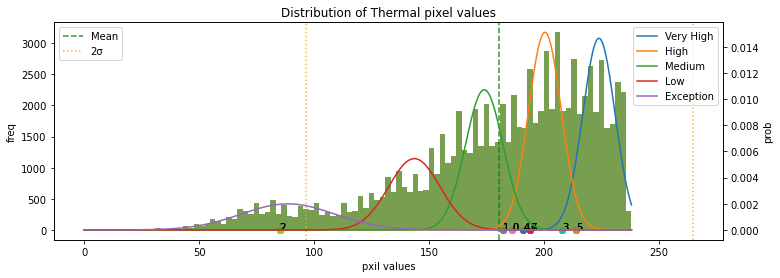

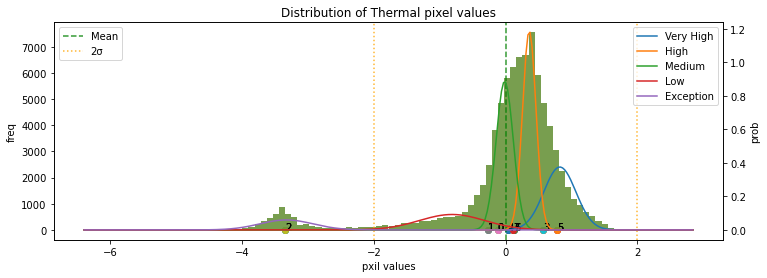

******* end *******
******* start *******
156.jpg
Module type: Normal
Cluster types1: ['High' 'Medium' 'Exception' 'High' 'Low' 'Low' 'Low' 'Medium']
Cluster types2: ['Very High' 'Medium' 'Exception' 'Very High' 'Low' 'Low' 'Low' 'Medium']
Hotspot weights: 0.0


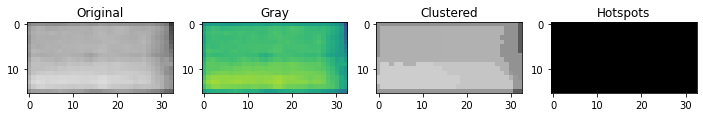

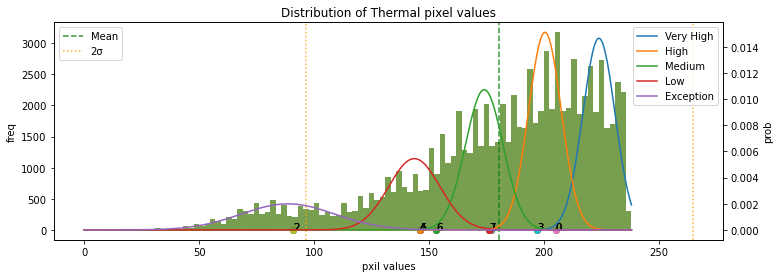

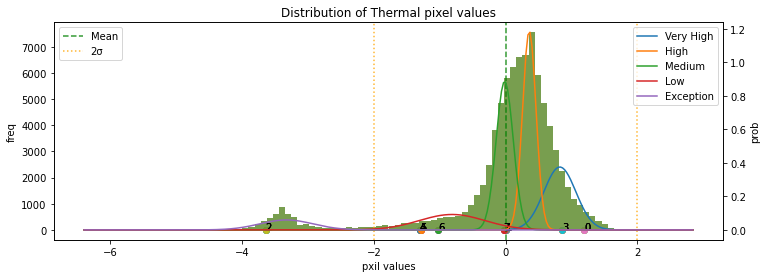

******* end *******
******* start *******
142.jpg
Module type: Multi-Hotspots
Cluster types1: ['High' 'Exception' 'High' 'Very High' 'High' 'Very High' 'Medium'
 'Medium']
Cluster types2: ['Medium' 'Exception' 'High' 'Very High' 'Medium' 'Very High' 'Low' 'Low']
Hotspot weights: 0.32323232323232326


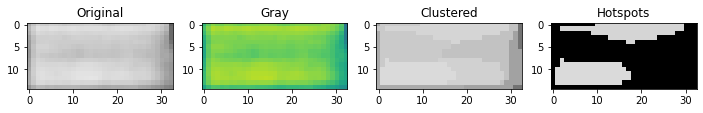

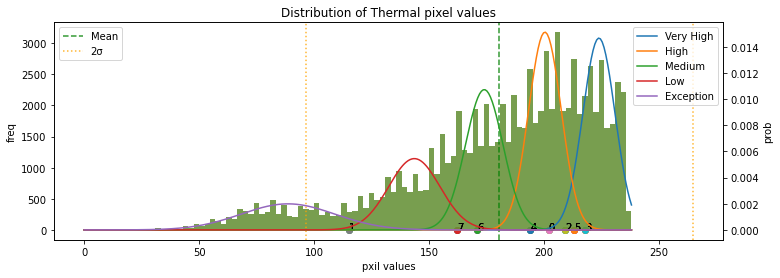

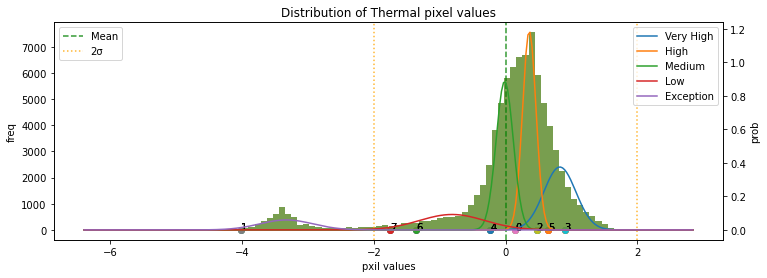

******* end *******
******* start *******
80.jpg
Module type: Normal
Cluster types1: ['Low' 'Exception' 'Low' 'Medium' 'Low' 'Low' 'Low' 'Low']
Cluster types2: ['High' 'Exception' 'Medium' 'Very High' 'Low' 'Medium' 'High' 'Medium']
Hotspot weights: 0.0


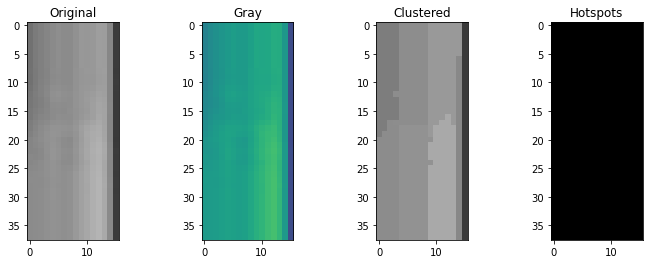

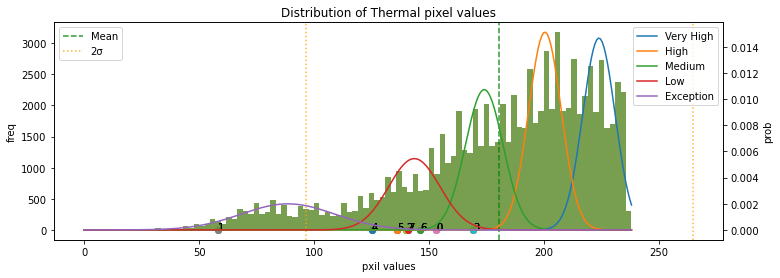

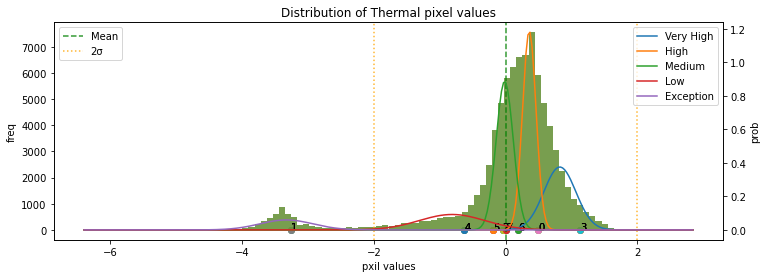

******* end *******
******* start *******
195.jpg
Module type: Normal
Cluster types1: ['Medium' 'Exception' 'Low' 'Medium' 'Low' 'Medium' 'Medium' 'Low']
Cluster types2: ['High' 'Exception' 'Medium' 'Very High' 'Medium' 'High' 'Very High'
 'Medium']
Hotspot weights: 0.0


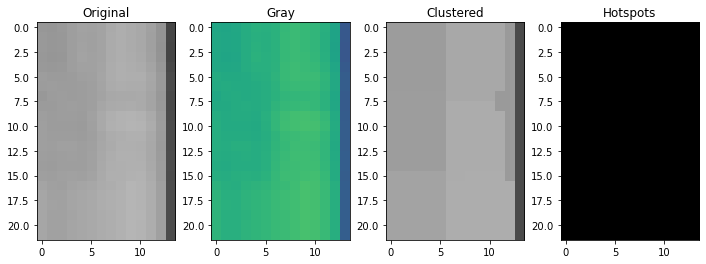

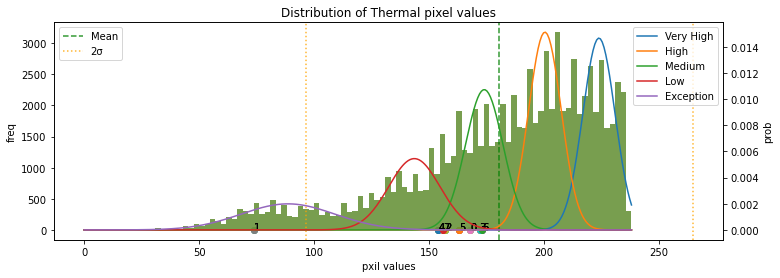

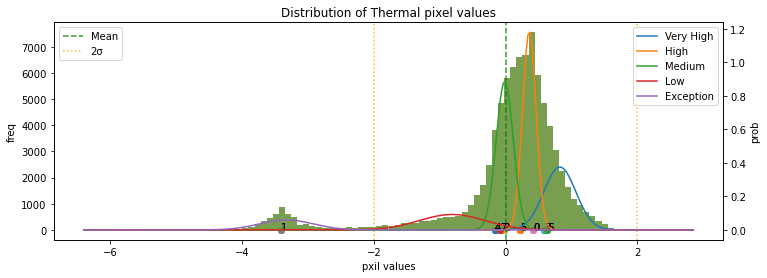

******* end *******
******* start *******
181.jpg
Module type: Normal
Cluster types1: ['Very High' 'High' 'Exception' 'Very High' 'Very High' 'Very High'
 'Medium' 'Very High']
Cluster types2: ['High' 'Low' 'Exception' 'High' 'High' 'High' 'Low' 'High']
Hotspot weights: 0.0


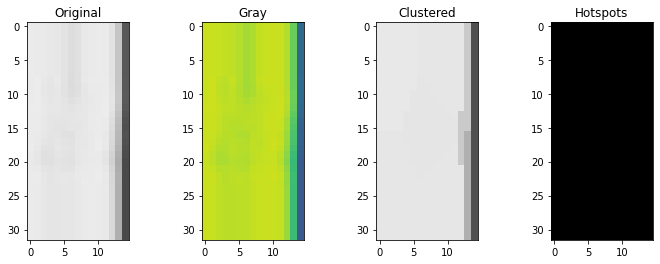

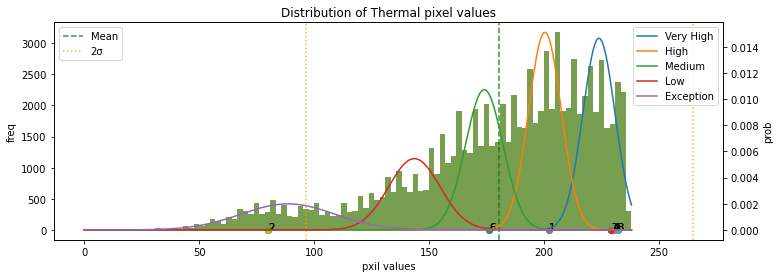

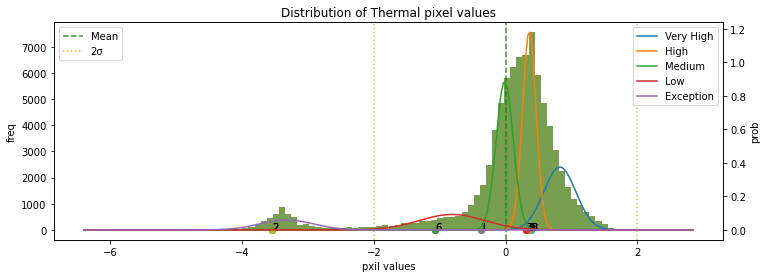

******* end *******
******* start *******
5.jpg
Module type: Normal
Cluster types1: ['Medium' 'Exception' 'Low' 'Medium' 'Medium' 'Medium' 'Low' 'Medium']
Cluster types2: ['Very High' 'Exception' 'Medium' 'High' 'High' 'Very High' 'Medium'
 'High']
Hotspot weights: 0.0


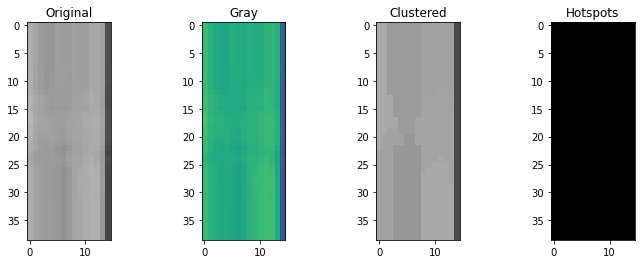

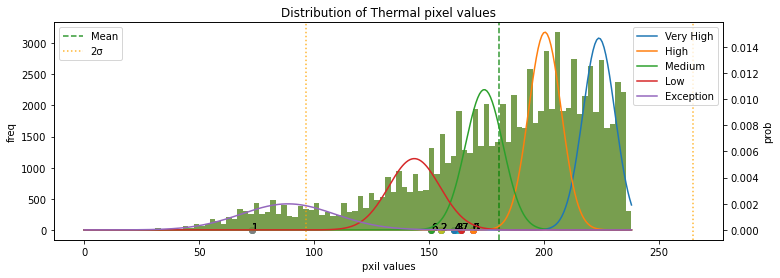

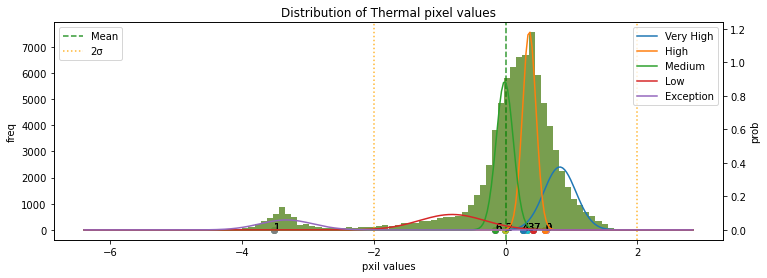

******* end *******
******* start *******
57.jpg
Module type: Multi-Hotspots
Cluster types1: ['High' 'Very High' 'Low' 'Low' 'Very High' 'Very High' 'High' 'Medium']
Cluster types2: ['High' 'Very High' 'Exception' 'Low' 'Very High' 'Very High' 'Medium'
 'Low']
Hotspot weights: 0.38461538461538464


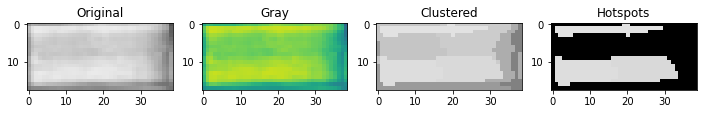

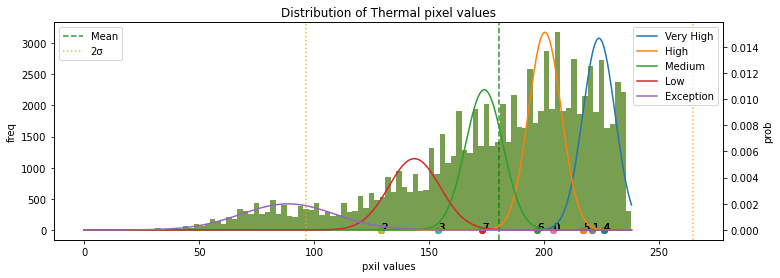

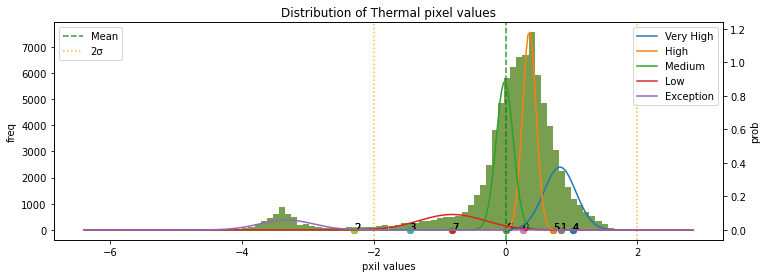

******* end *******
******* start *******
43.jpg
Module type: Normal
Cluster types1: ['High' 'Exception' 'Medium' 'High' 'High' 'High' 'High' 'Low']
Cluster types2: ['High' 'Exception' 'Low' 'High' 'High' 'Medium' 'High' 'Low']
Hotspot weights: 0.0


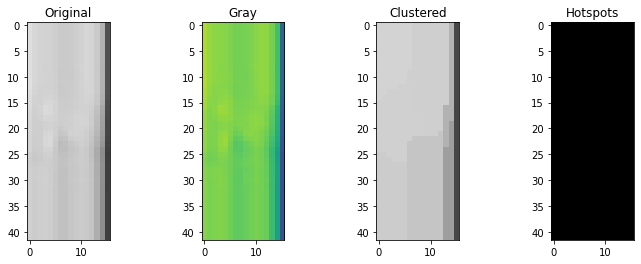

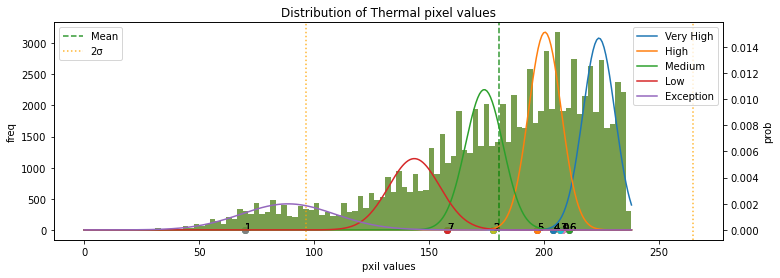

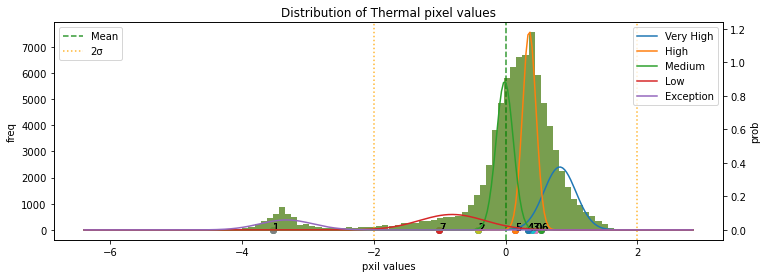

******* end *******
******* start *******
55.jpg
Module type: Single-Hotspot
Cluster types1: ['Exception' 'Very High' 'High' 'High' 'Exception' 'Low' 'High'
 'Very High']
Cluster types2: ['Exception' 'Very High' 'Medium' 'Medium' 'Exception' 'Low' 'High' 'High']
Hotspot weights: 0.16447368421052633


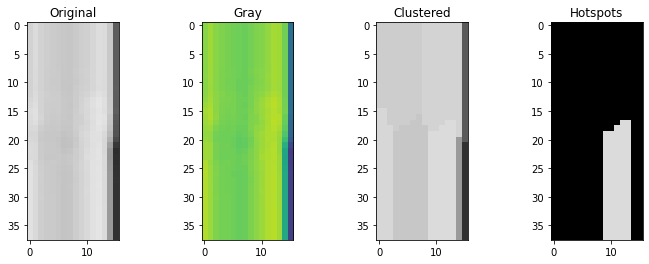

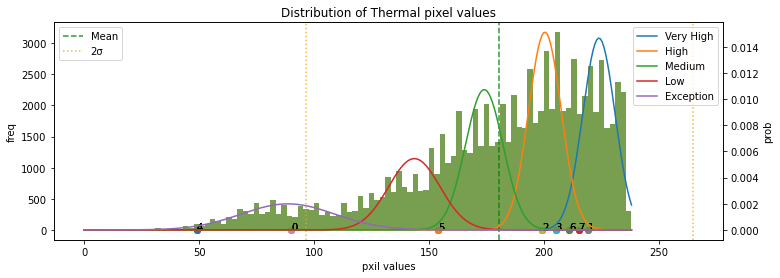

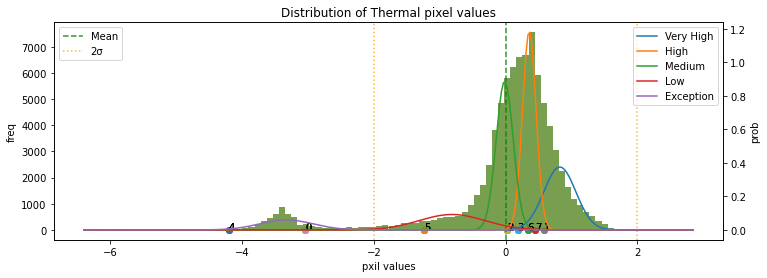

******* end *******
******* start *******
7.jpg
Module type: Normal
Cluster types1: ['Medium' 'Low' 'Exception' 'Low' 'Medium' 'Medium' 'Low' 'Medium']
Cluster types2: ['High' 'Medium' 'Exception' 'Medium' 'Very High' 'High' 'Low' 'High']
Hotspot weights: 0.0


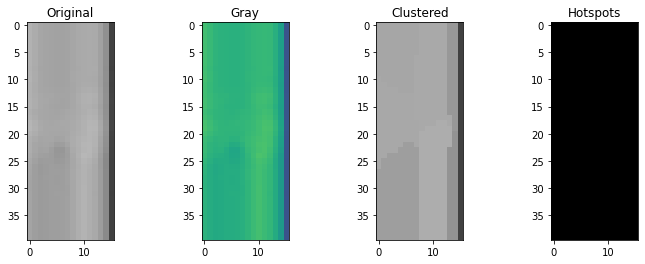

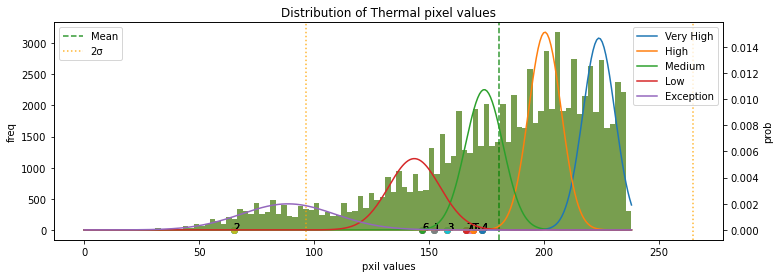

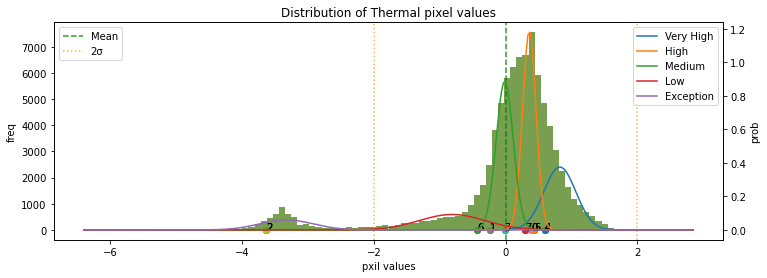

******* end *******
******* start *******
41.jpg
Module type: Single-Hotspot
Cluster types1: ['High' 'Exception' 'High' 'Medium' 'High' 'High' 'Very High' 'Medium']
Cluster types2: ['High' 'Exception' 'High' 'Low' 'High' 'High' 'Very High' 'Low']
Hotspot weights: 0.14743589743589744


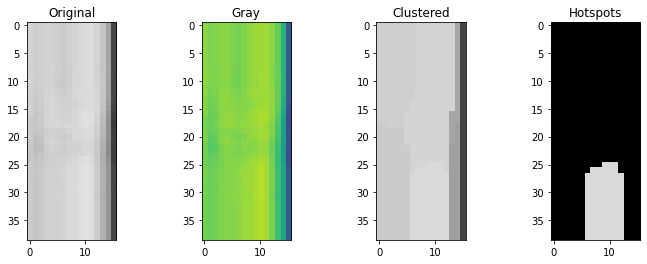

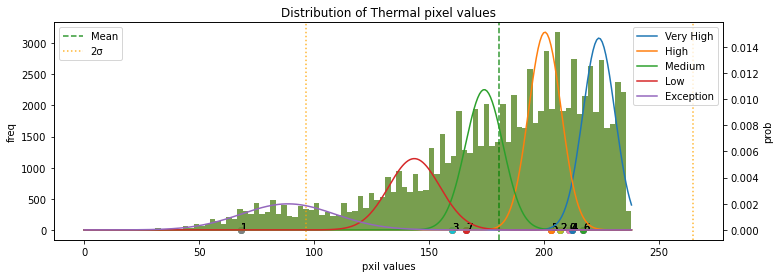

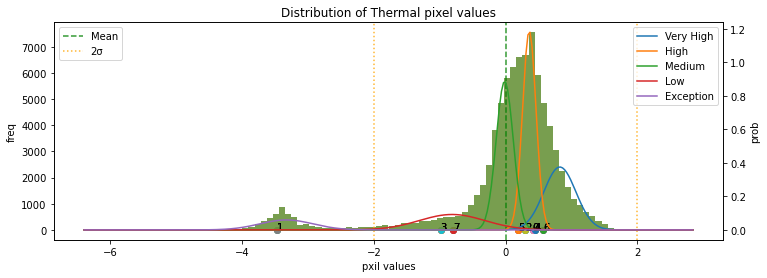

******* end *******
******* start *******
69.jpg
Module type: Normal
Cluster types1: ['High' 'High' 'Low' 'High' 'Medium' 'Low' 'High' 'Medium']
Cluster types2: ['Very High' 'High' 'Exception' 'Medium' 'Low' 'Exception' 'Very High'
 'Low']
Hotspot weights: 0.0


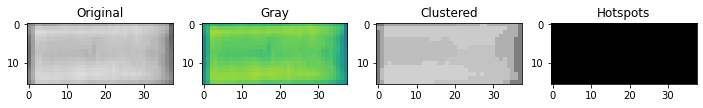

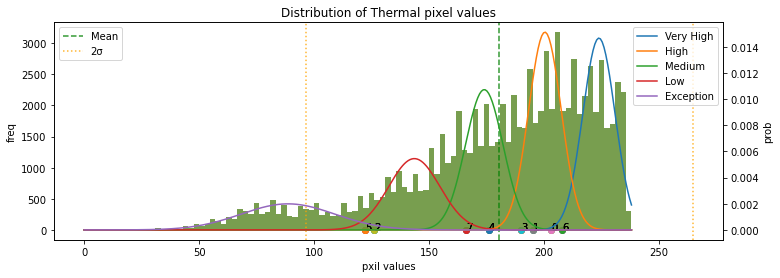

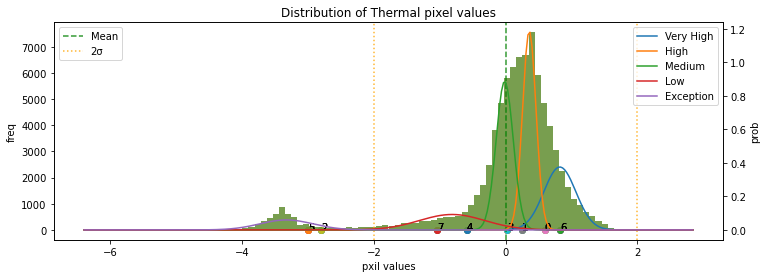

******* end *******
******* start *******
197.jpg
Module type: Normal
Cluster types1: ['High' 'Exception' 'High' 'High' 'High' 'High' 'High' 'Medium']
Cluster types2: ['Medium' 'Exception' 'High' 'Medium' 'Very High' 'Medium' 'High' 'Medium']
Hotspot weights: 0.0


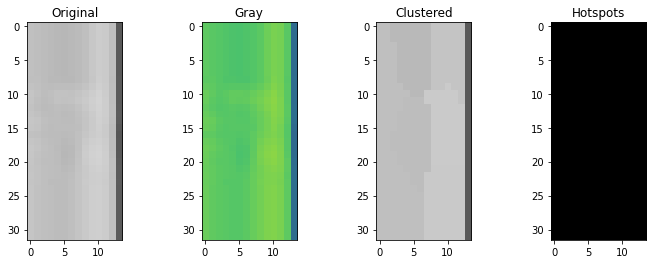

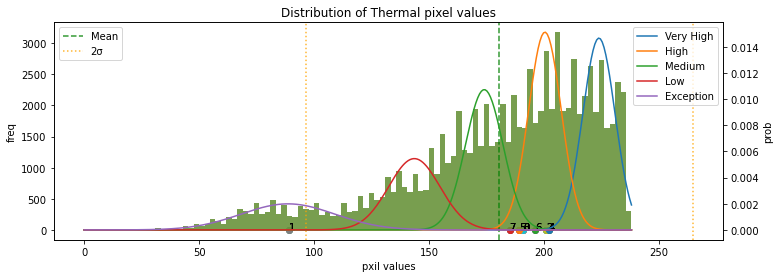

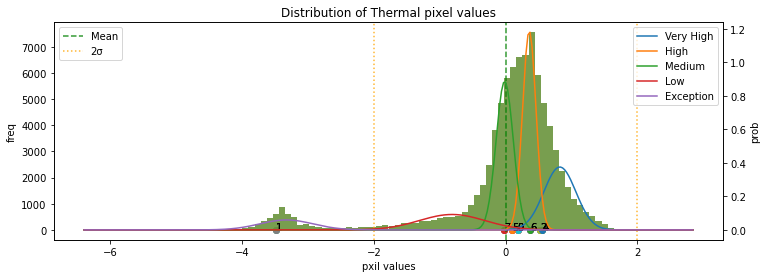

******* end *******
******* start *******
183.jpg
Module type: Normal
Cluster types1: ['Very High' 'Exception' 'Very High' 'Very High' 'Very High' 'Very High'
 'Very High' 'Exception']
Cluster types2: ['High' 'Exception' 'High' 'High' 'High' 'Medium' 'High' 'Exception']
Hotspot weights: 0.0


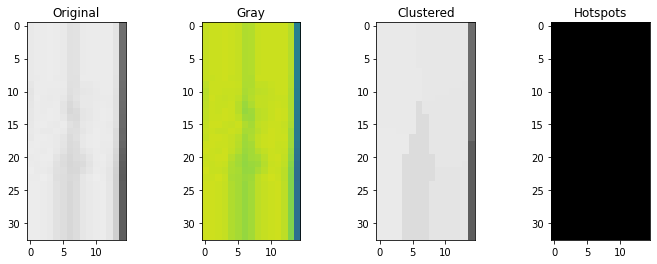

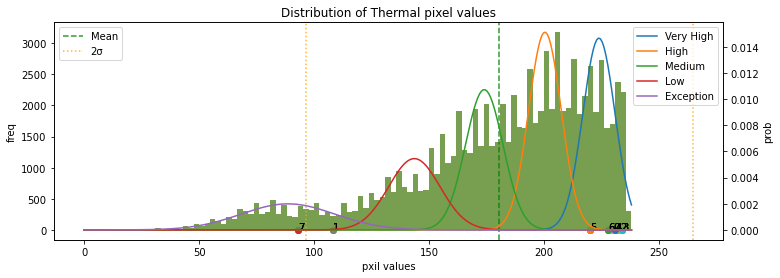

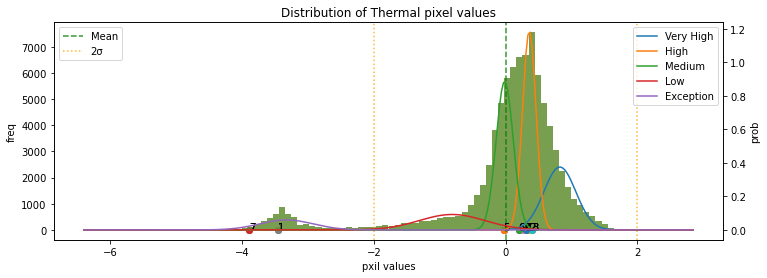

******* end *******
******* start *******
82.jpg
Module type: Normal
Cluster types1: ['Medium' 'Exception' 'Medium' 'Medium' 'Medium' 'Medium' 'Medium' 'Low']
Cluster types2: ['High' 'Exception' 'Very High' 'Medium' 'Medium' 'Medium' 'Very High'
 'Low']
Hotspot weights: 0.0


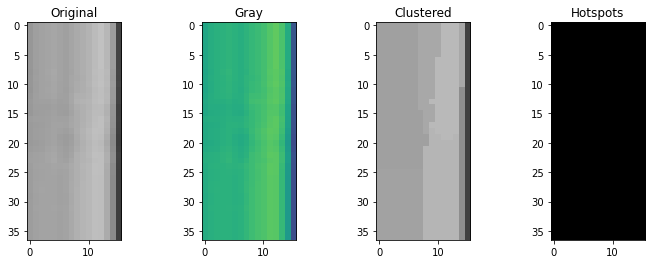

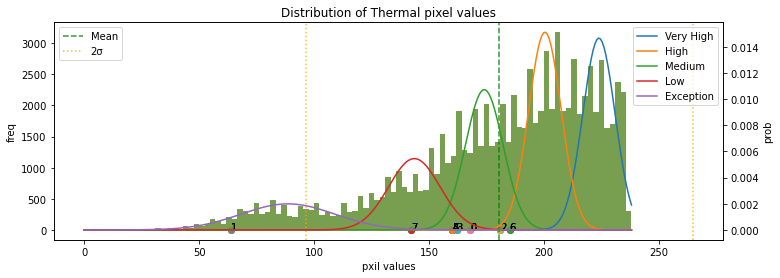

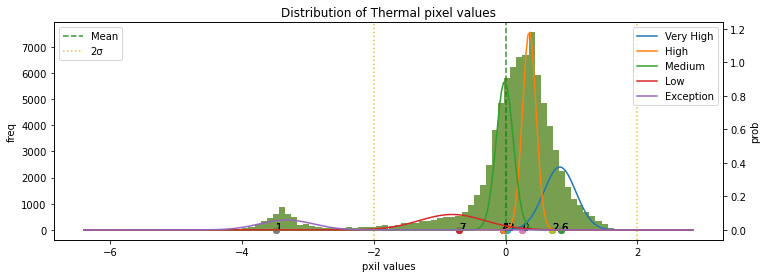

******* end *******
******* start *******
154.jpg
Module type: Single-Hotspot
Cluster types1: ['High' 'Low' 'High' 'Low' 'Medium' 'Very High' 'Exception' 'Very High']
Cluster types2: ['Medium' 'Low' 'High' 'Low' 'Low' 'Very High' 'Exception' 'High']
Hotspot weights: 0.16891891891891891


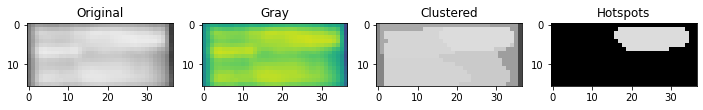

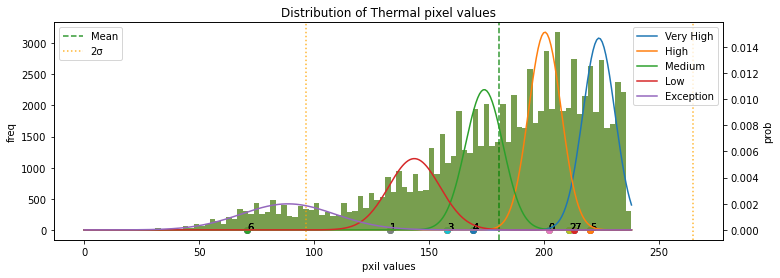

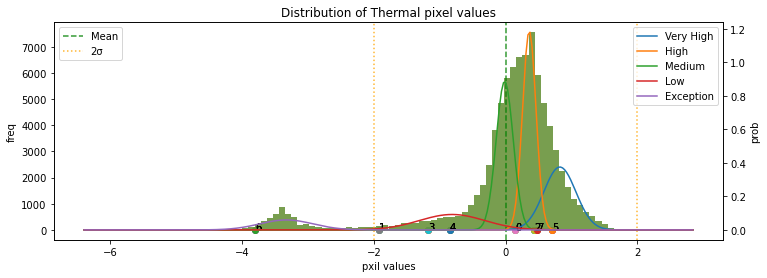

******* end *******
******* start *******
140.jpg
Module type: Normal
Cluster types1: ['Medium' 'Exception' 'Medium' 'High' 'Medium' 'Medium' 'Medium' 'Medium']
Cluster types2: ['High' 'Exception' 'Medium' 'Very High' 'Medium' 'Medium' 'Medium'
 'Medium']
Hotspot weights: 0.0


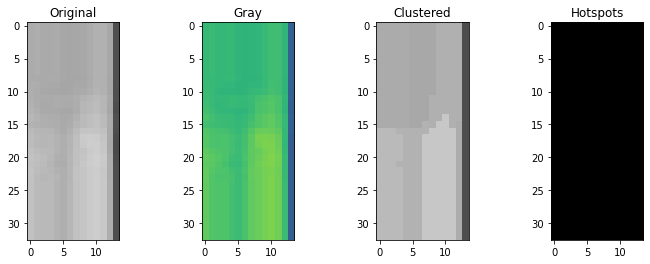

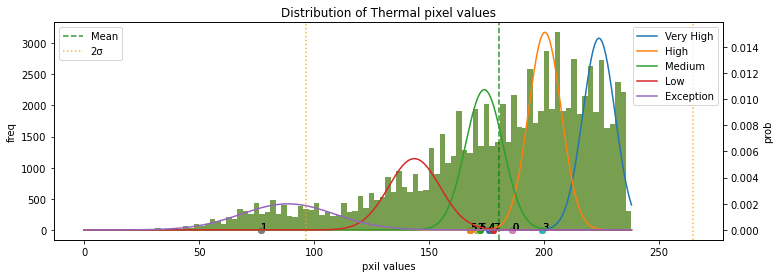

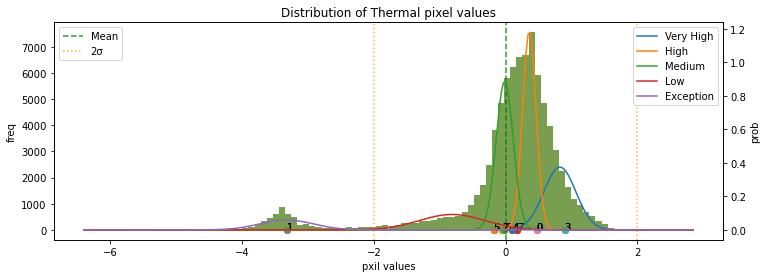

******* end *******
******* start *******
141.jpg
Module type: Normal
Cluster types1: ['Very High' 'Very High' 'Exception' 'Very High' 'Very High' 'High'
 'Very High' 'Exception']
Cluster types2: ['Medium' 'High' 'Exception' 'Medium' 'High' 'Low' 'High' 'Exception']
Hotspot weights: 0.0


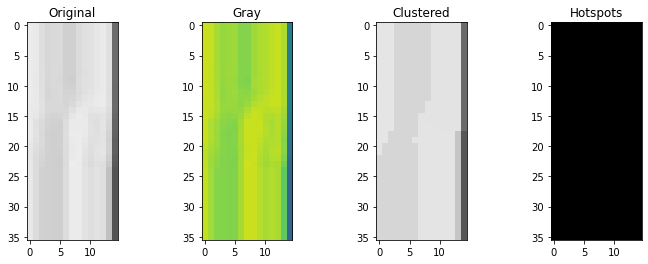

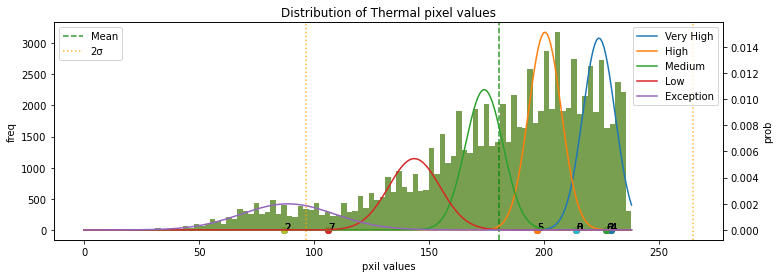

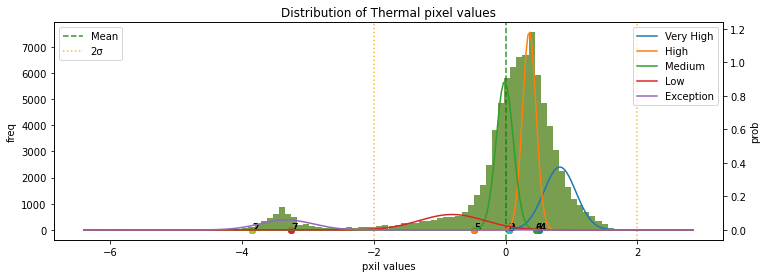

******* end *******
******* start *******
155.jpg
Module type: Normal
Cluster types1: ['Medium' 'High' 'Medium' 'Medium' 'Low' 'Low' 'Medium' 'Exception']
Cluster types2: ['Medium' 'Very High' 'Medium' 'High' 'Low' 'Low' 'High' 'Exception']
Hotspot weights: 0.0


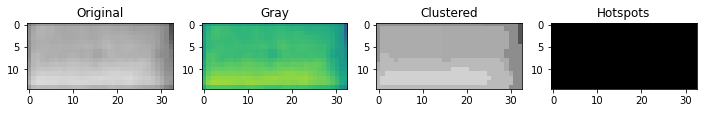

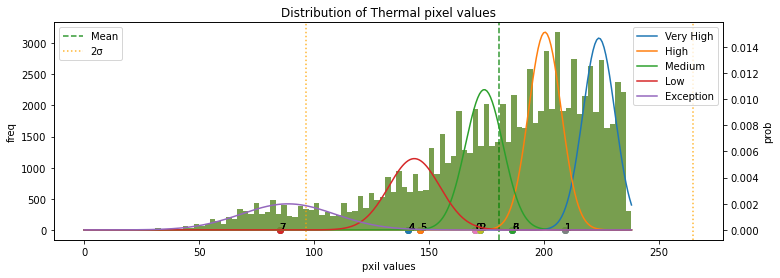

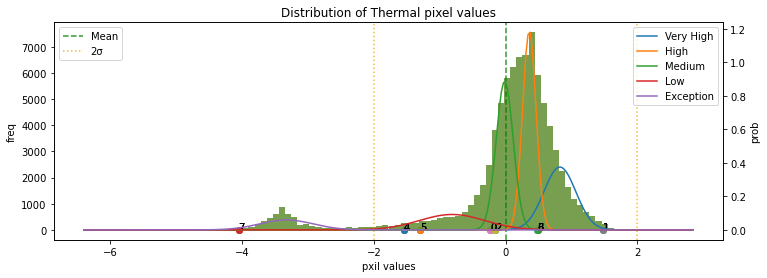

******* end *******
******* start *******
83.jpg
Module type: Normal
Cluster types1: ['Medium' 'Exception' 'High' 'Medium' 'Medium' 'Medium' 'Low' 'Medium']
Cluster types2: ['Medium' 'Exception' 'Very High' 'Very High' 'Medium' 'High' 'Low'
 'Medium']
Hotspot weights: 0.0


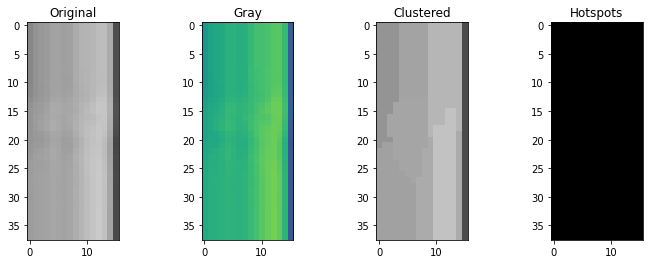

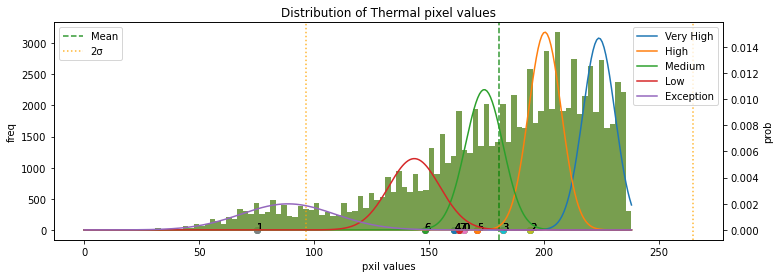

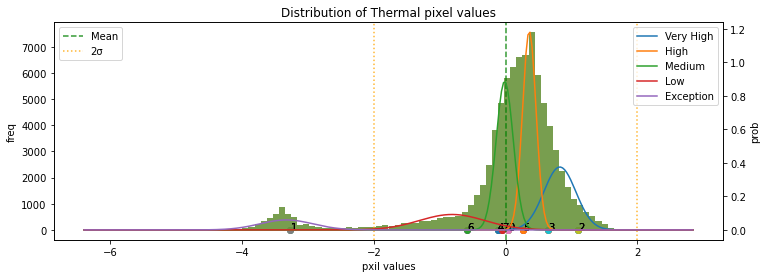

******* end *******
******* start *******
68.jpg
Module type: Normal
Cluster types1: ['High' 'Exception' 'High' 'High' 'Low' 'High' 'High' 'Exception']
Cluster types2: ['Medium' 'Exception' 'High' 'Medium' 'Low' 'Very High' 'High' 'Exception']
Hotspot weights: 0.0


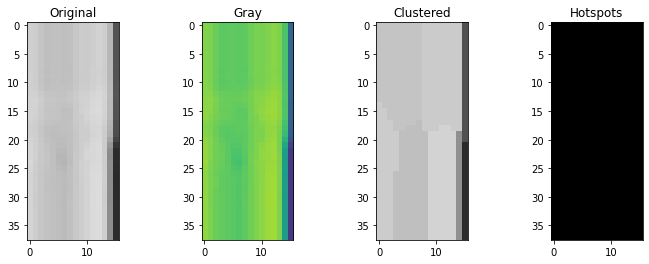

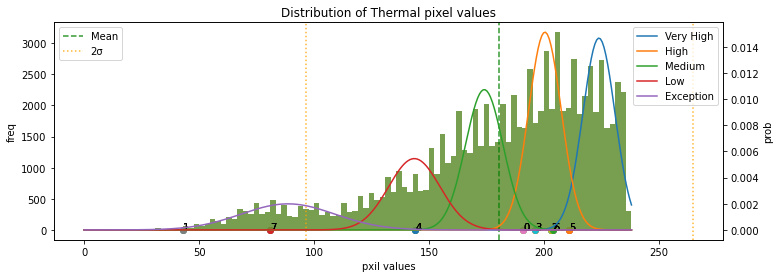

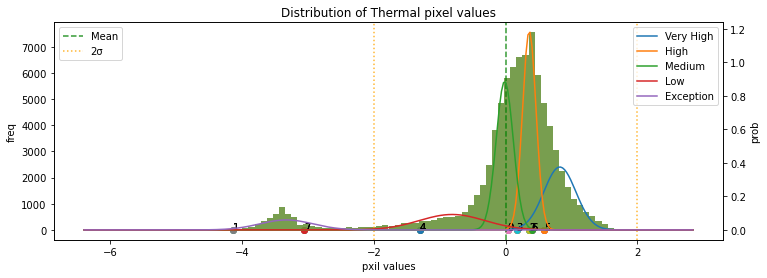

******* end *******
******* start *******
196.jpg
Module type: Normal
Cluster types1: ['Medium' 'Medium' 'Exception' 'High' 'Medium' 'Medium' 'Medium' 'Medium']
Cluster types2: ['Medium' 'Medium' 'Exception' 'Very High' 'High' 'Medium' 'Medium'
 'Very High']
Hotspot weights: 0.0


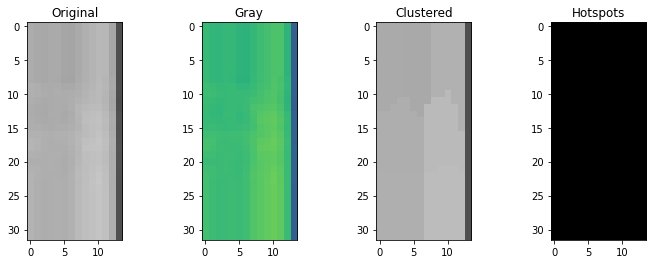

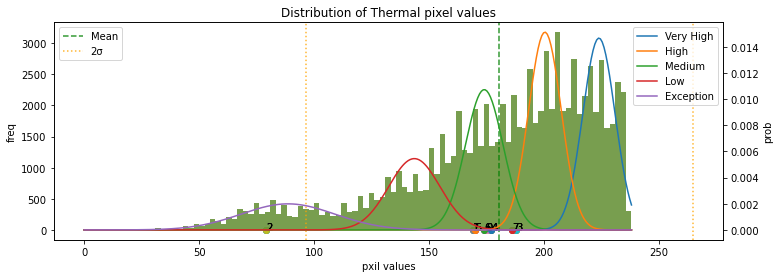

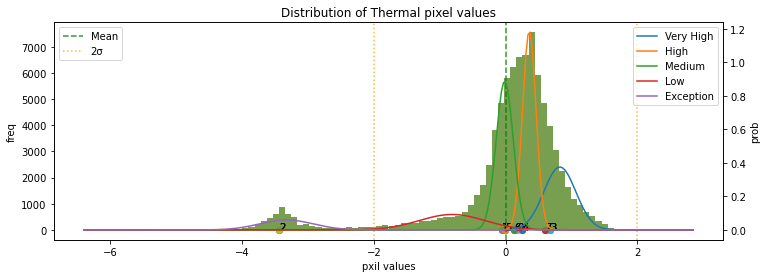

******* end *******
******* start *******
40.jpg
Module type: Single-Hotspot
Cluster types1: ['Very High' 'Exception' 'High' 'Very High' 'Medium' 'High' 'Medium'
 'High']
Cluster types2: ['High' 'Exception' 'High' 'Very High' 'Low' 'Medium' 'Low' 'High']
Hotspot weights: 0.14309210526315788


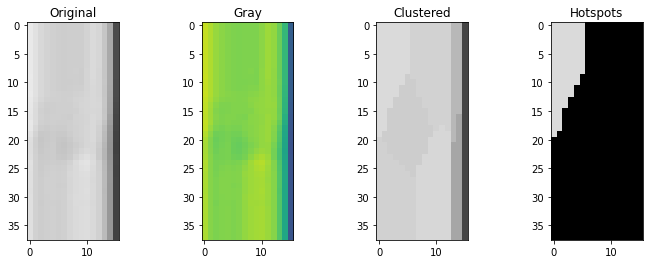

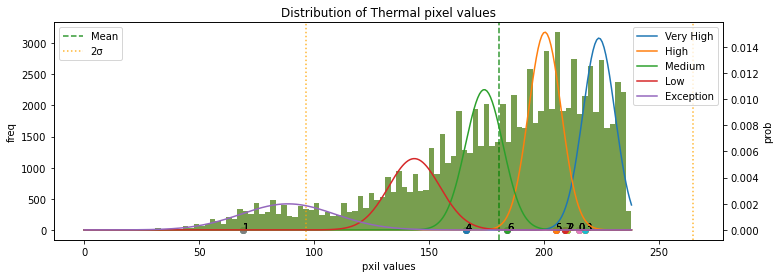

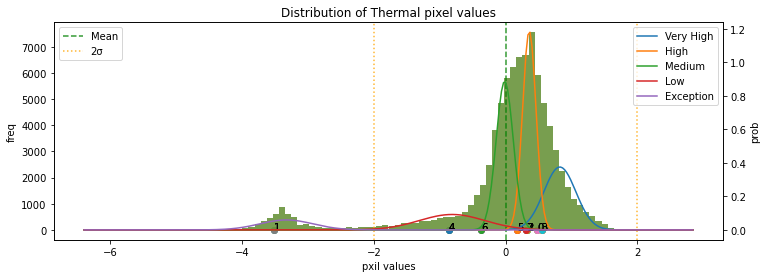

******* end *******
******* start *******
54.jpg
Module type: Single-Hotspot
Cluster types1: ['High' 'Medium' 'High' 'High' 'Medium' 'Very High' 'Low' 'Exception']
Cluster types2: ['High' 'Low' 'High' 'High' 'Low' 'Very High' 'Low' 'Exception']
Hotspot weights: 0.14309210526315788


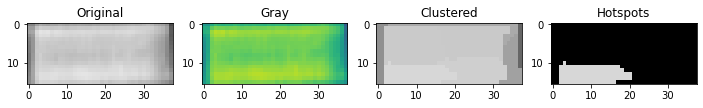

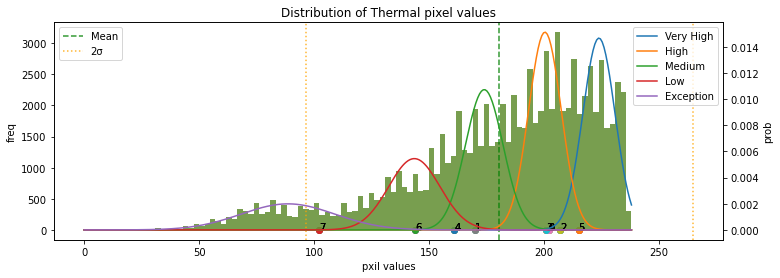

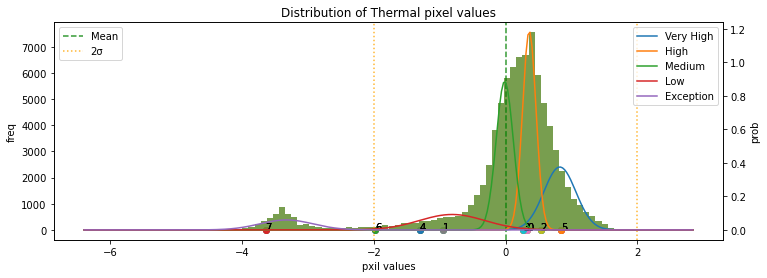

******* end *******
******* start *******
6.jpg
Module type: Normal
Cluster types1: ['Low' 'Medium' 'Exception' 'Medium' 'Medium' 'Medium' 'Medium' 'Low']
Cluster types2: ['Medium' 'High' 'Exception' 'Very High' 'High' 'Medium' 'High' 'Low']
Hotspot weights: 0.0


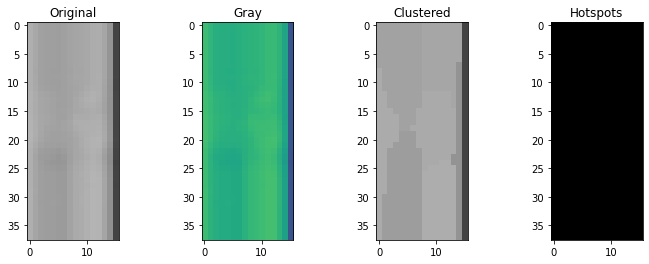

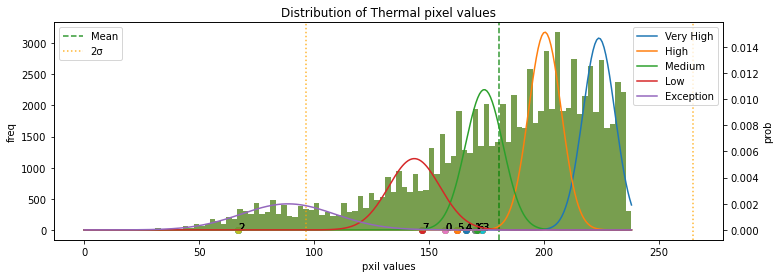

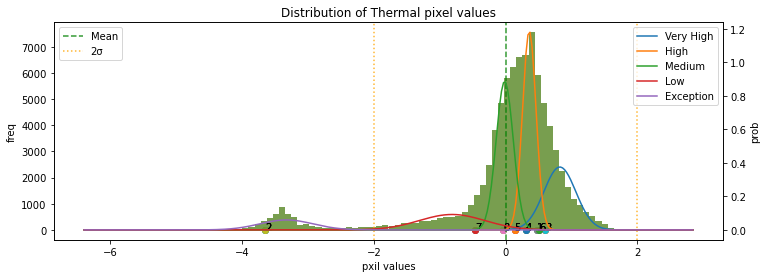

******* end *******
******* start *******
192.jpg
Module type: Normal
Cluster types1: ['Very High' 'Exception' 'Very High' 'Very High' 'High' 'Exception'
 'Very High' 'Very High']
Cluster types2: ['High' 'Exception' 'High' 'High' 'Low' 'Exception' 'High' 'High']
Hotspot weights: 0.0


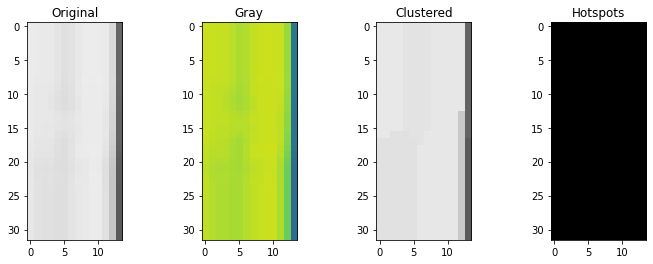

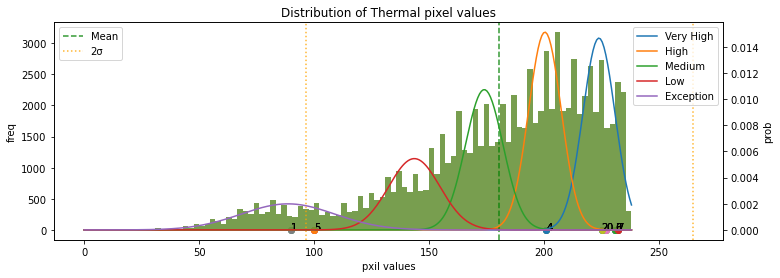

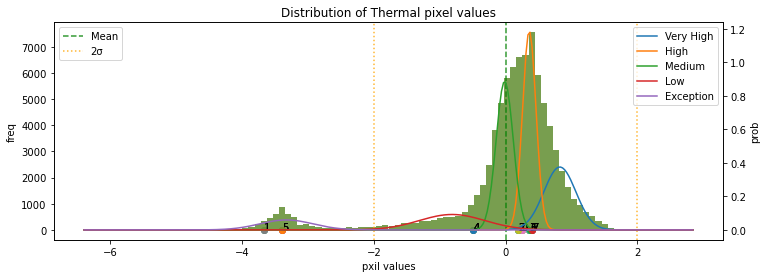

******* end *******
******* start *******
78.jpg
Module type: Normal
Cluster types1: ['Low' 'Medium' 'Exception' 'Medium' 'Low' 'Low' 'Medium' 'Medium']
Cluster types2: ['Low' 'Very High' 'Exception' 'Very High' 'Medium' 'Medium' 'Very High'
 'Medium']
Hotspot weights: 0.0


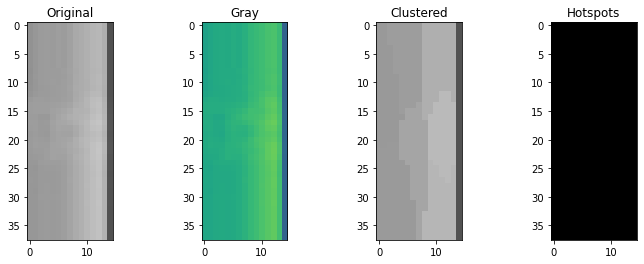

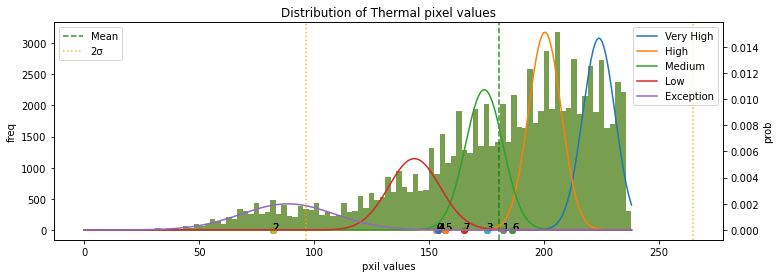

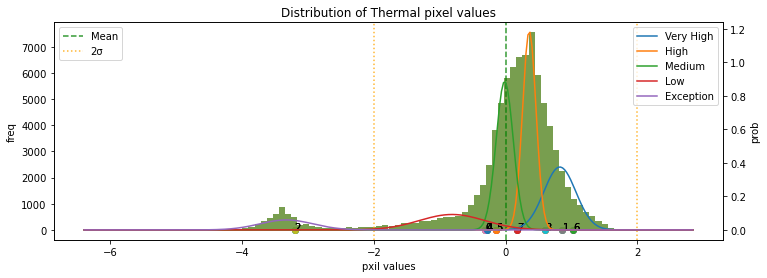

******* end *******
******* start *******
186.jpg
Module type: Single-Hotspot
Cluster types1: ['High' 'Exception' 'Very High' 'High' 'High' 'Exception' 'Medium' 'High']
Cluster types2: ['Medium' 'Exception' 'Very High' 'High' 'High' 'Exception' 'Low' 'High']
Hotspot weights: 0.16964285714285715


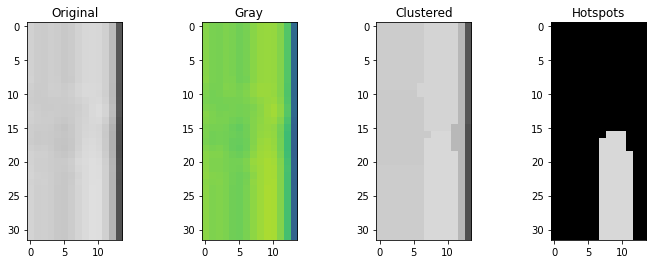

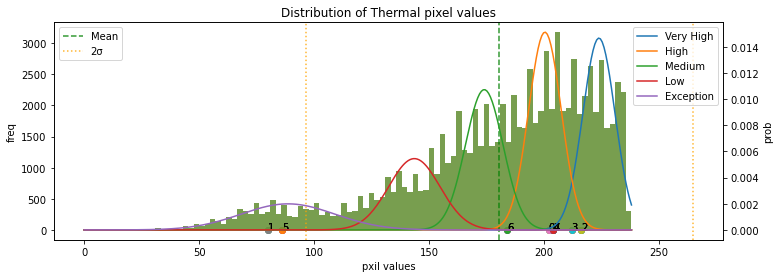

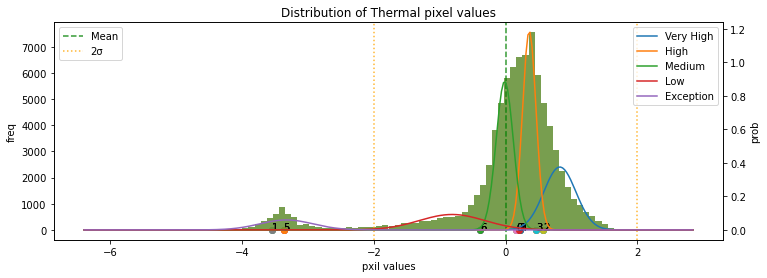

******* end *******
******* start *******
2.jpg
Module type: Normal
Cluster types1: ['Low' 'Exception' 'Low' 'Low' 'Low' 'Low' 'Exception' 'Low']
Cluster types2: ['Medium' 'Exception' 'Very High' 'High' 'Medium' 'Very High' 'Exception'
 'Medium']
Hotspot weights: 0.0


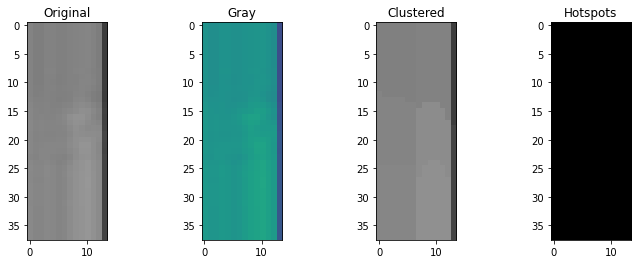

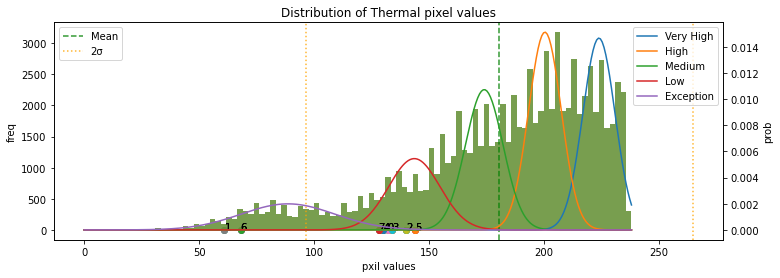

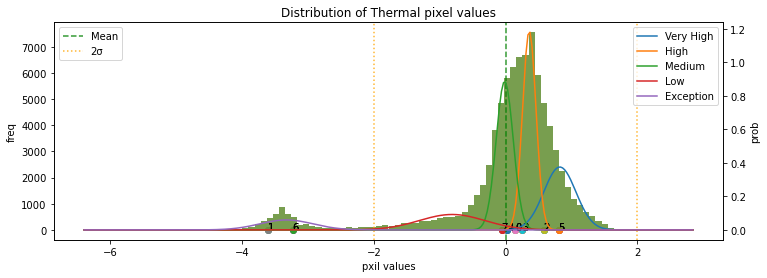

******* end *******
******* start *******
50.jpg
Module type: Single-Hotspot
Cluster types1: ['High' 'High' 'Exception' 'High' 'Very High' 'High' 'High' 'High']
Cluster types2: ['Medium' 'Very High' 'Exception' 'Medium' 'Very High' 'Medium' 'High'
 'Medium']
Hotspot weights: 0.17407407407407408


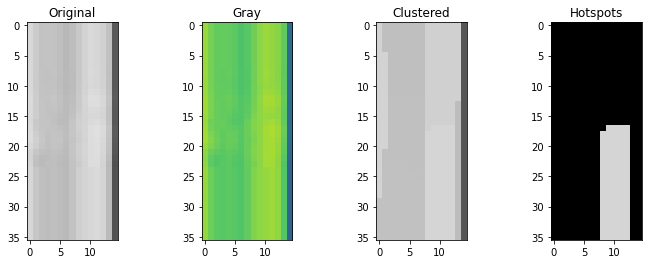

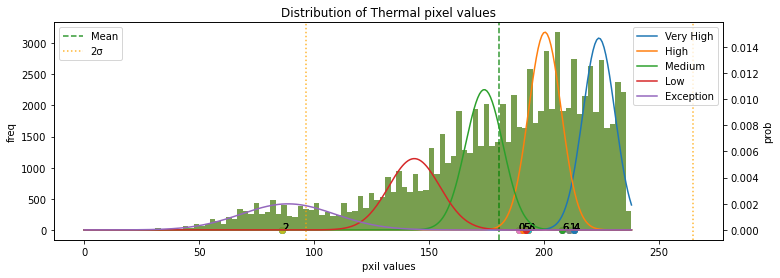

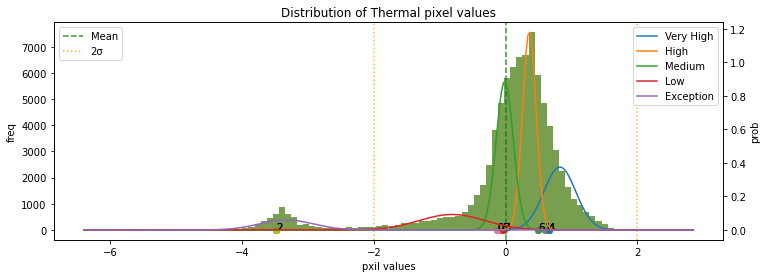

******* end *******
******* start *******
151.jpg
Module type: Normal
Cluster types1: ['Medium' 'Low' 'Exception' 'Medium' 'Low' 'Medium' 'Low' 'Low']
Cluster types2: ['Very High' 'Low' 'Exception' 'Very High' 'Medium' 'High' 'Medium'
 'Medium']
Hotspot weights: 0.0


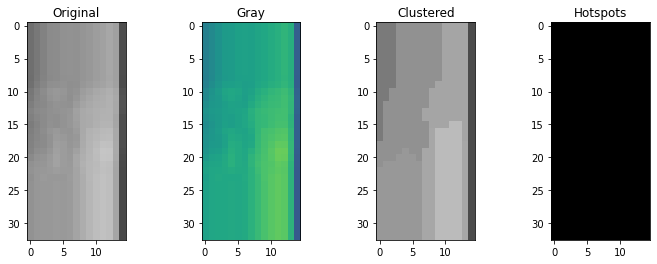

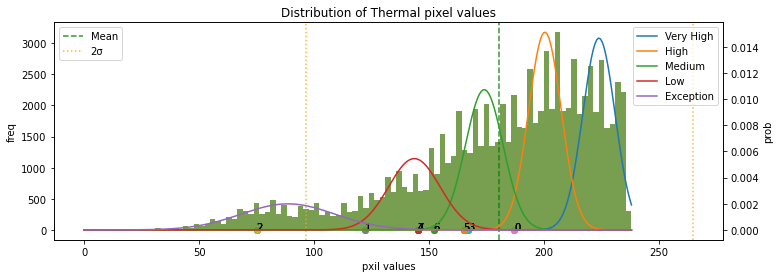

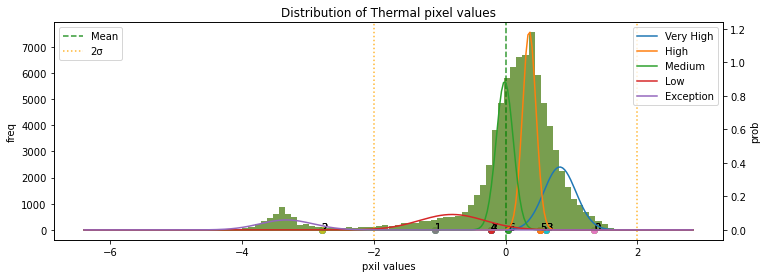

******* end *******
******* start *******
145.jpg
Module type: Single-Hotspot
Cluster types1: ['High' 'Exception' 'High' 'Very High' 'Very High' 'Exception' 'Very High'
 'Very High']
Cluster types2: ['Medium' 'Exception' 'Medium' 'High' 'Very High' 'Exception' 'High'
 'High']
Hotspot weights: 0.11717171717171718


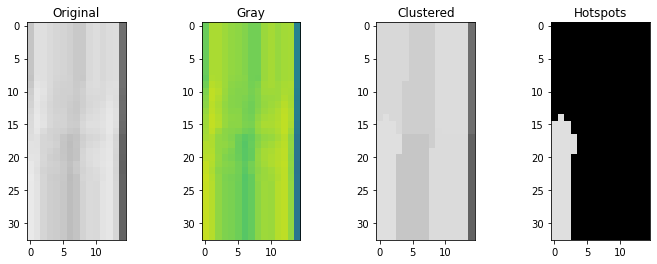

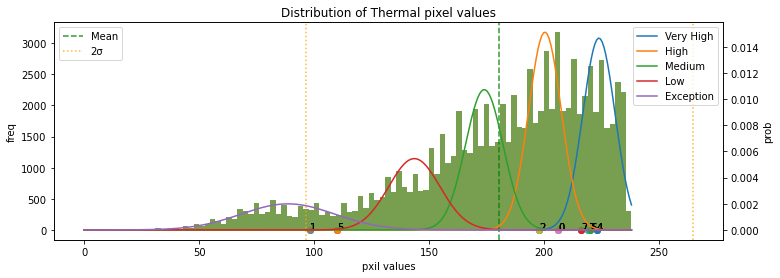

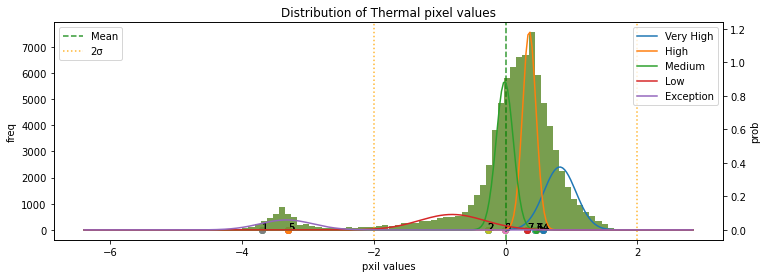

******* end *******
******* start *******
87.jpg
Module type: Normal
Cluster types1: ['Medium' 'Medium' 'Low' 'Low' 'Exception' 'High' 'Low' 'Low']
Cluster types2: ['Very High' 'Medium' 'Medium' 'Low' 'Low' 'Very High' 'Low' 'Low']
Hotspot weights: 0.0


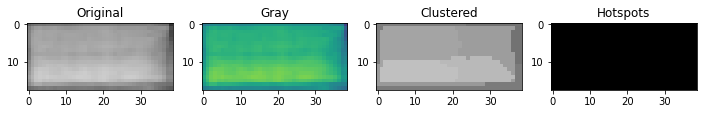

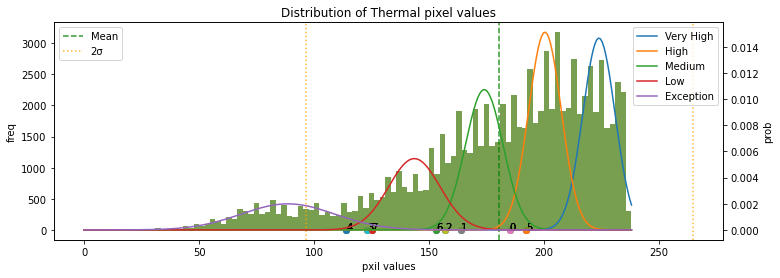

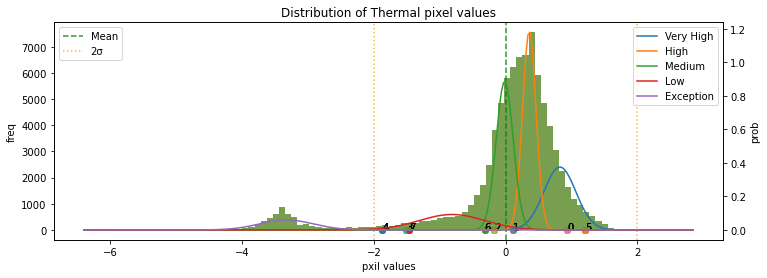

******* end *******
******* start *******
179.jpg
Module type: Normal
Cluster types1: ['Medium' 'Very High' 'Exception' 'Very High' 'Very High' 'Very High'
 'High' 'Very High']
Cluster types2: ['Low' 'High' 'Exception' 'High' 'High' 'High' 'Low' 'High']
Hotspot weights: 0.0


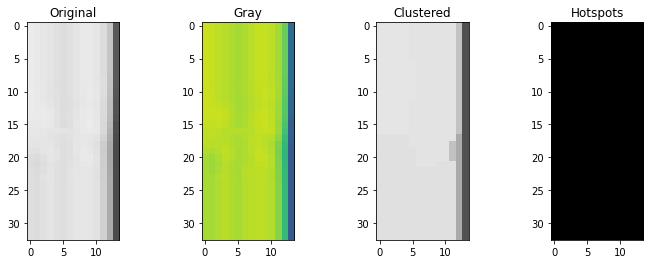

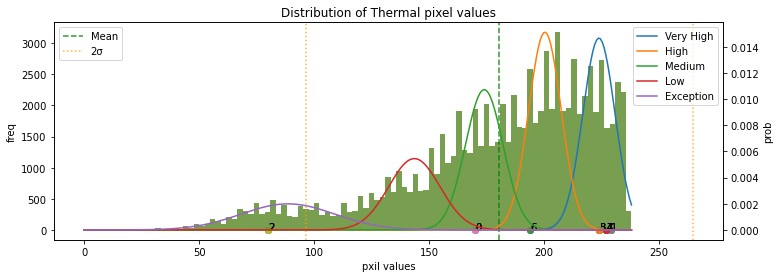

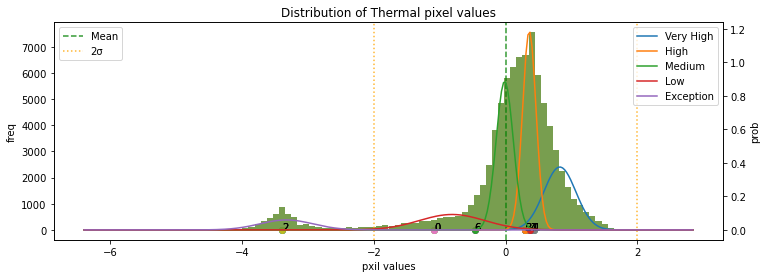

******* end *******
******* start *******
86.jpg
Module type: Normal
Cluster types1: ['Low' 'Medium' 'Medium' 'Low' 'Exception' 'High' 'Low' 'High']
Cluster types2: ['Low' 'Medium' 'Medium' 'Low' 'Exception' 'Very High' 'Low' 'Very High']
Hotspot weights: 0.0


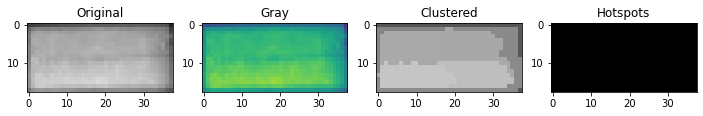

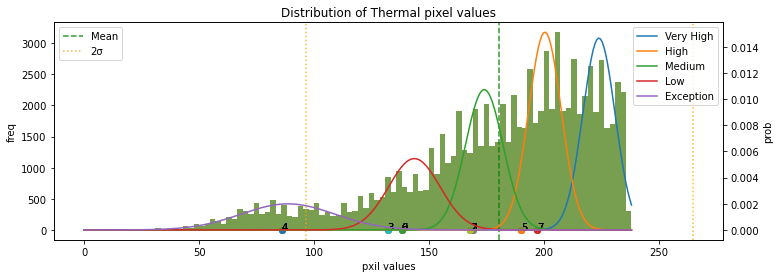

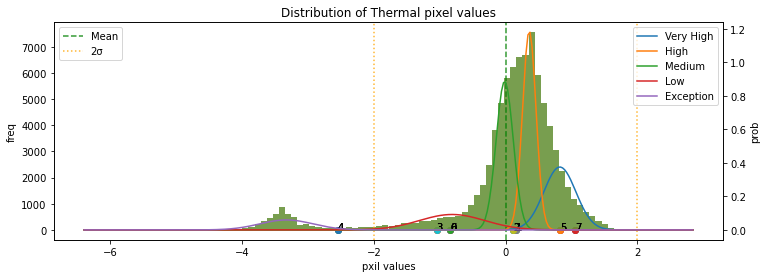

******* end *******
******* start *******
178.jpg
Module type: Normal
Cluster types1: ['Very High' 'Exception' 'Very High' 'Very High' 'Medium' 'Very High'
 'Very High' 'Very High']
Cluster types2: ['High' 'Exception' 'High' 'High' 'Low' 'High' 'High' 'High']
Hotspot weights: 0.0


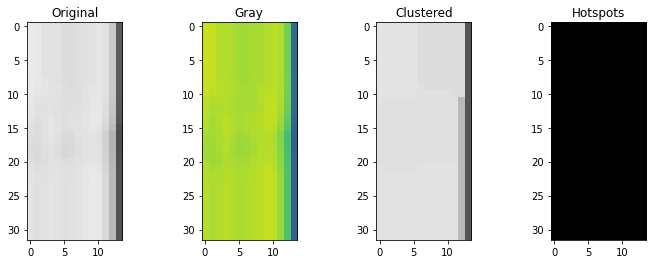

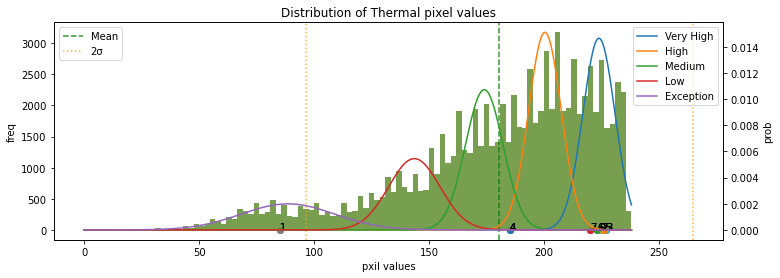

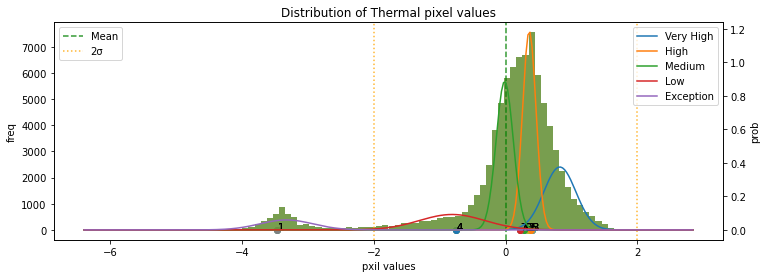

******* end *******
******* start *******
144.jpg
Module type: Single-Hotspot
Cluster types1: ['Very High' 'High' 'Exception' 'Very High' 'Very High' 'High' 'High'
 'High']
Cluster types2: ['Very High' 'Medium' 'Exception' 'High' 'High' 'Medium' 'High' 'Low']
Hotspot weights: 0.1038961038961039


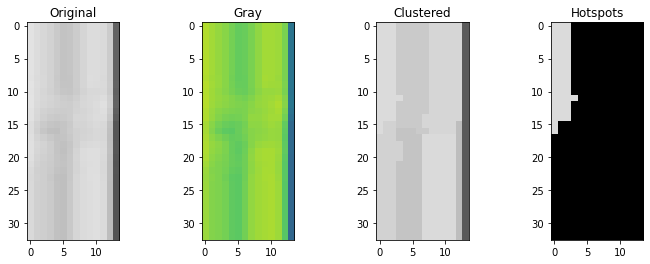

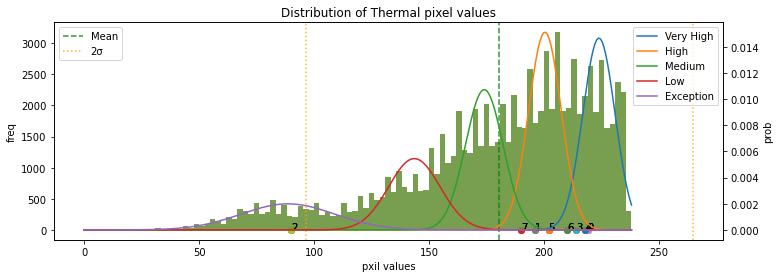

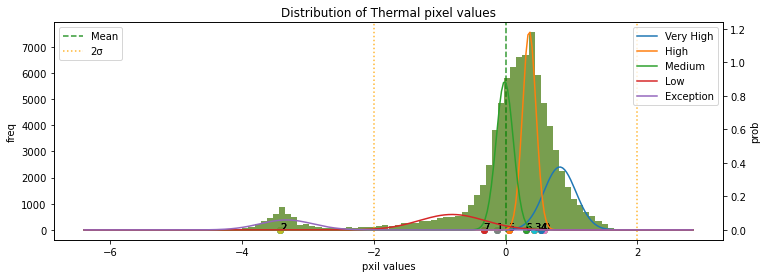

******* end *******
******* start *******
150.jpg
Module type: Normal
Cluster types1: ['Medium' 'Exception' 'Medium' 'High' 'Medium' 'Medium' 'Medium'
 'Exception']
Cluster types2: ['Medium' 'Exception' 'Very High' 'Very High' 'Medium' 'High' 'Medium'
 'Exception']
Hotspot weights: 0.0


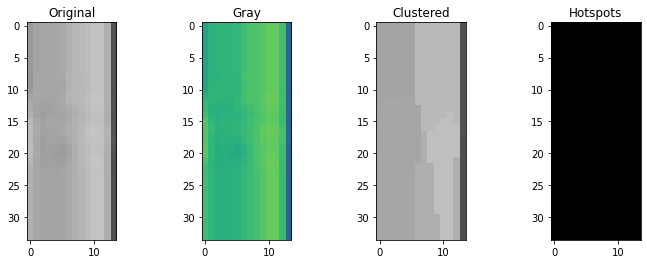

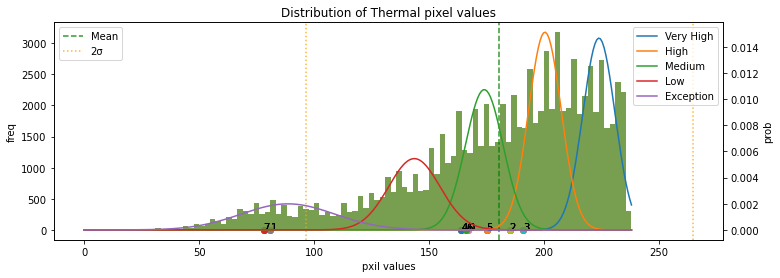

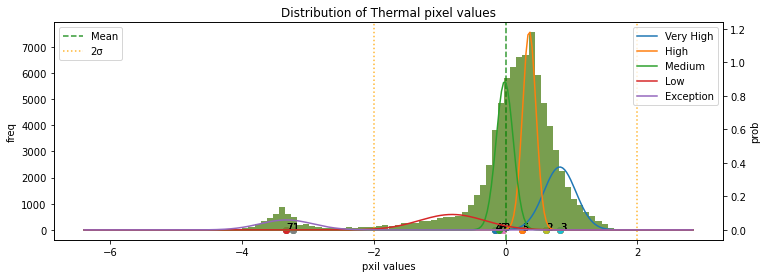

******* end *******
******* start *******
3.jpg
Module type: Normal
Cluster types1: ['Low' 'Exception' 'Low' 'Low' 'Low' 'Low' 'Low' 'Low']
Cluster types2: ['High' 'Exception' 'High' 'Very High' 'Very High' 'Low' 'Medium' 'High']
Hotspot weights: 0.0


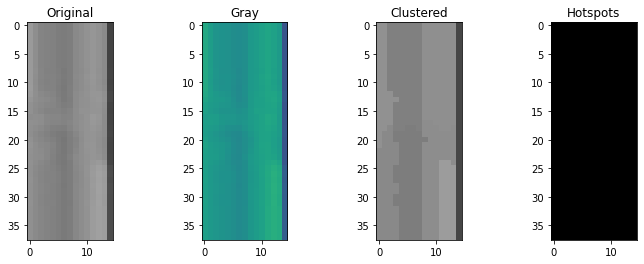

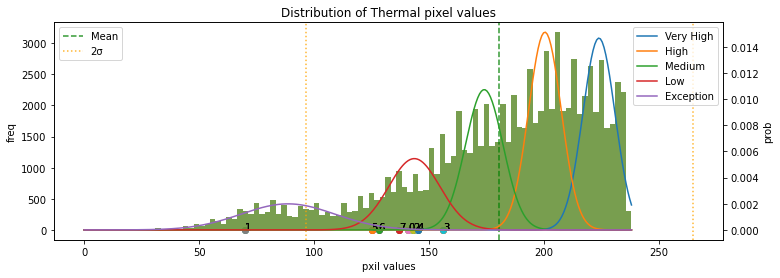

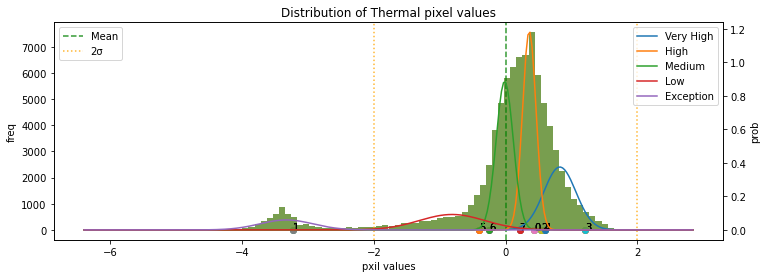

******* end *******
******* start *******
51.jpg
Module type: Normal
Cluster types1: ['Medium' 'Exception' 'High' 'High' 'Low' 'Medium' 'Exception' 'Low']
Cluster types2: ['Medium' 'Exception' 'Very High' 'Very High' 'Medium' 'Very High' 'Low'
 'Low']
Hotspot weights: 0.0


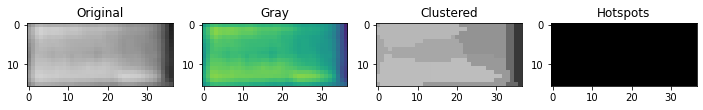

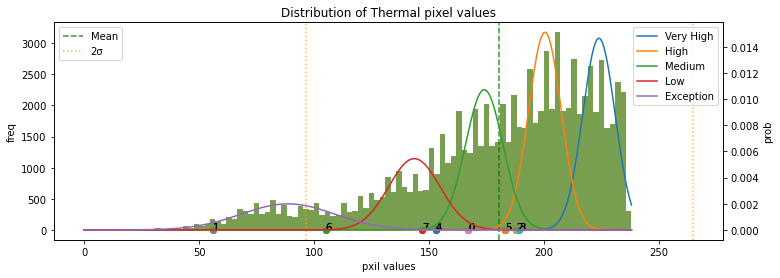

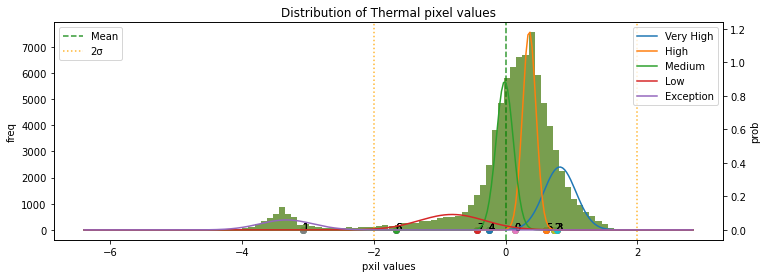

******* end *******
******* start *******
193.jpg
Module type: Normal
Cluster types1: ['Very High' 'Exception' 'Very High' 'Very High' 'Very High' 'Very High'
 'Exception' 'Very High']
Cluster types2: ['High' 'Exception' 'High' 'High' 'Medium' 'High' 'Exception' 'High']
Hotspot weights: 0.0


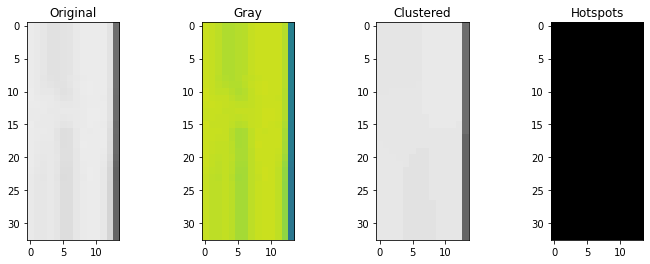

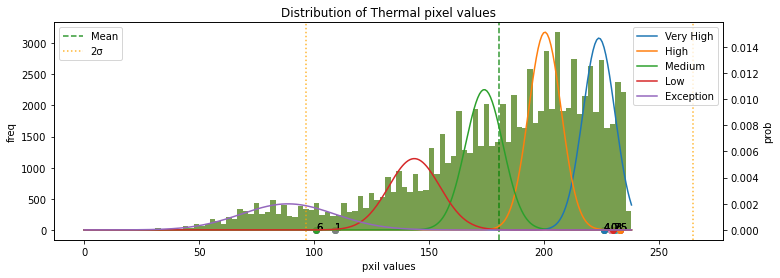

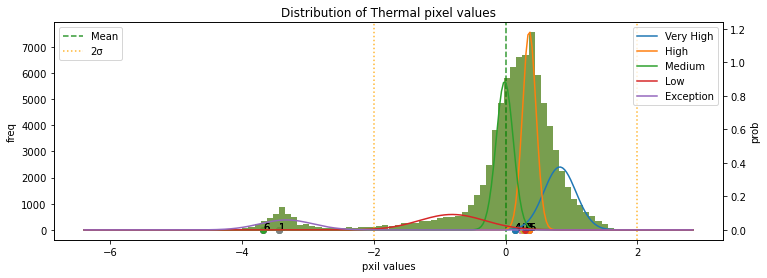

******* end *******
******* start *******
185.jpg
Module type: Normal
Cluster types1: ['High' 'Exception' 'High' 'High' 'High' 'Exception' 'Medium' 'High']
Cluster types2: ['Medium' 'Exception' 'High' 'Medium' 'Very High' 'Exception' 'Medium'
 'Very High']
Hotspot weights: 0.0


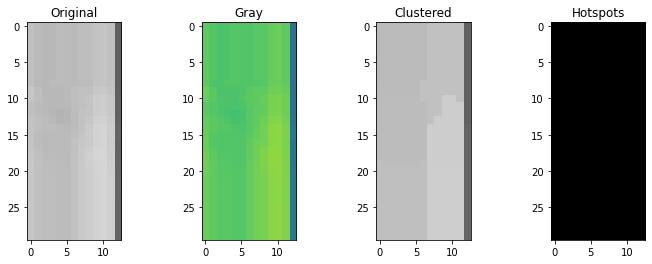

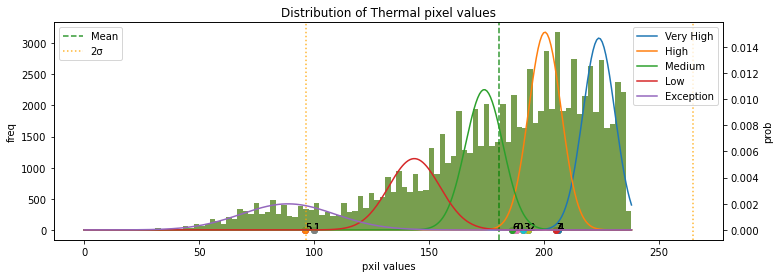

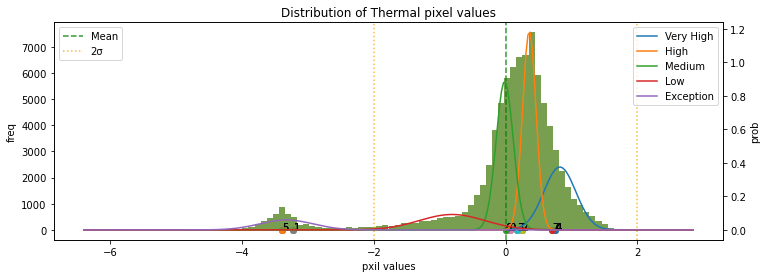

******* end *******
******* start *******
191.jpg
Module type: Normal
Cluster types1: ['Very High' 'Exception' 'Very High' 'Very High' 'Very High' 'Very High'
 'Exception' 'Very High']
Cluster types2: ['High' 'Exception' 'Medium' 'High' 'High' 'High' 'Exception' 'High']
Hotspot weights: 0.0


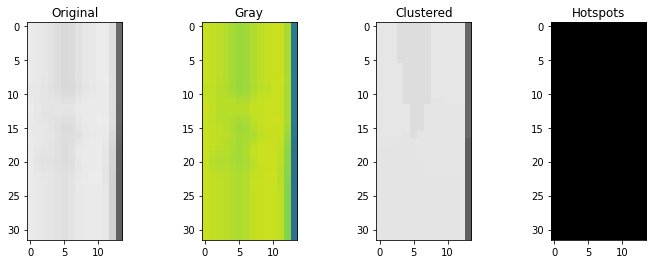

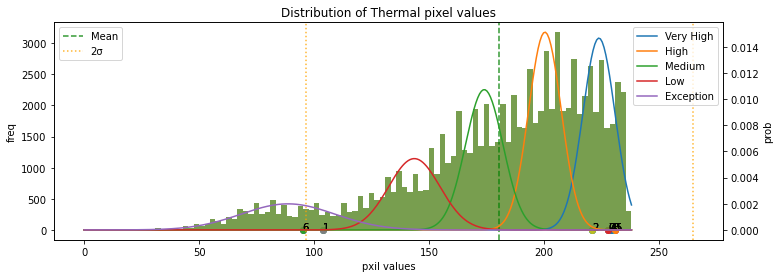

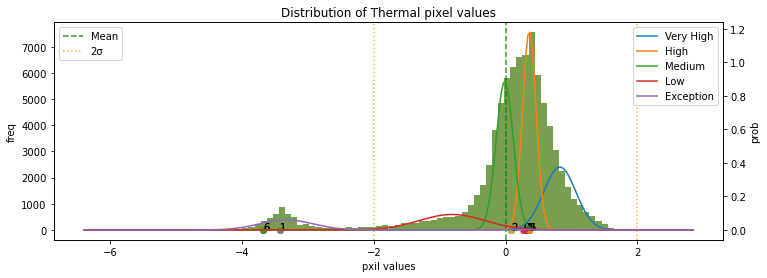

******* end *******
******* start *******
47.jpg
Module type: Normal
Cluster types1: ['Medium' 'Medium' 'Exception' 'Medium' 'Medium' 'Medium' 'Medium'
 'Medium']
Cluster types2: ['Medium' 'Medium' 'Exception' 'Medium' 'High' 'Medium' 'Very High'
 'Very High']
Hotspot weights: 0.0


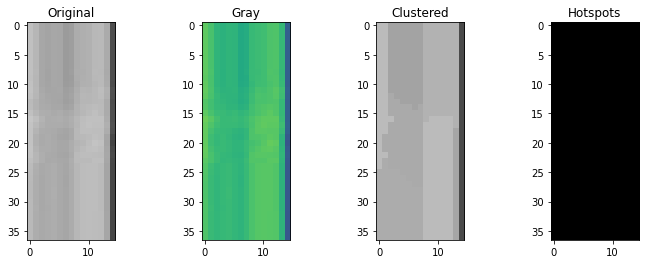

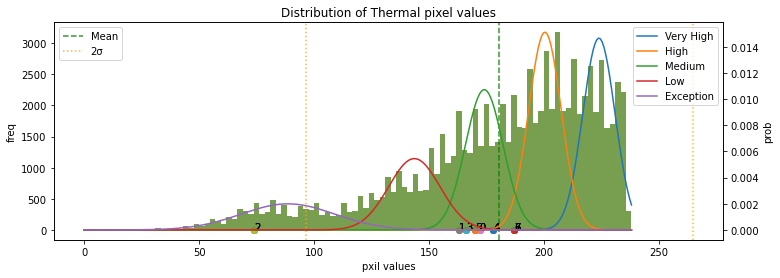

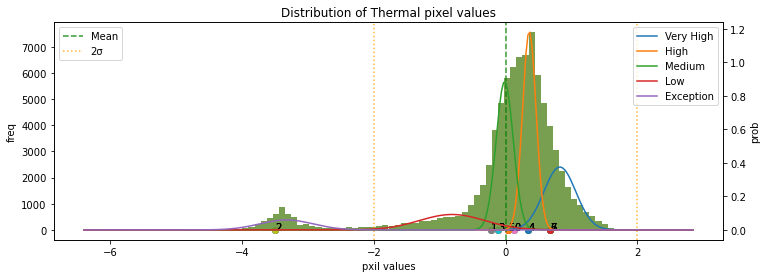

******* end *******
******* start *******
53.jpg
Module type: Normal
Cluster types1: ['Exception' 'High' 'High' 'High' 'High' 'Medium' 'High' 'High']
Cluster types2: ['Exception' 'Medium' 'High' 'Medium' 'Medium' 'Medium' 'Very High' 'High']
Hotspot weights: 0.0


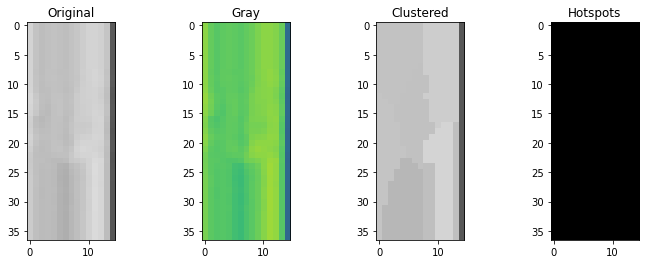

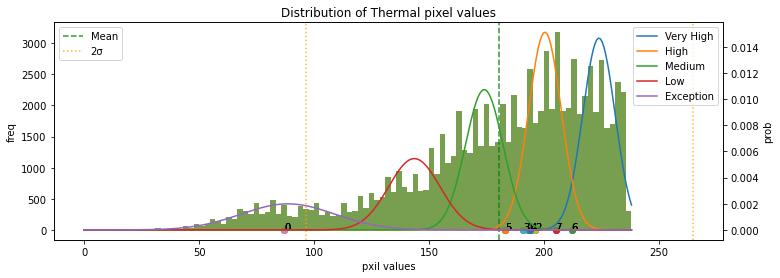

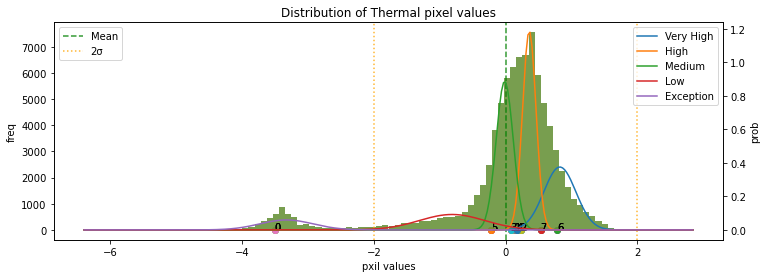

******* end *******
******* start *******
1.jpg
Module type: Normal
Cluster types1: ['Exception' 'Exception' 'Exception' 'Exception' 'Low' 'Exception' 'Low'
 'Exception']
Cluster types2: ['Medium' 'Exception' 'Medium' 'High' 'Very High' 'Exception' 'Very High'
 'Medium']
Hotspot weights: 0.0


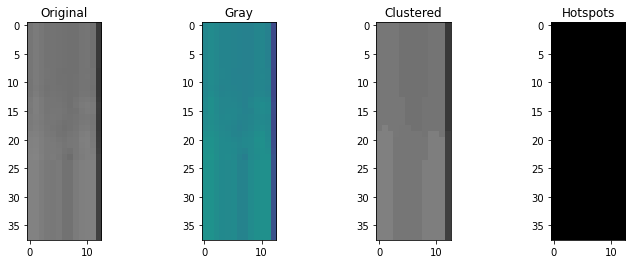

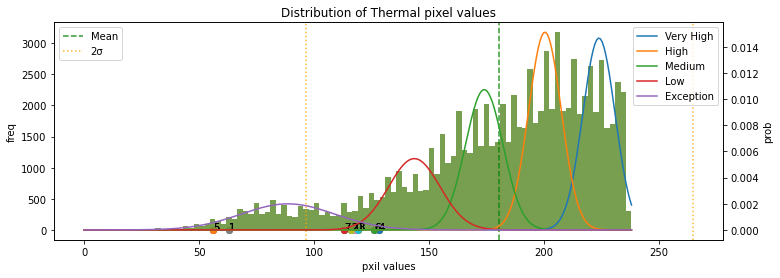

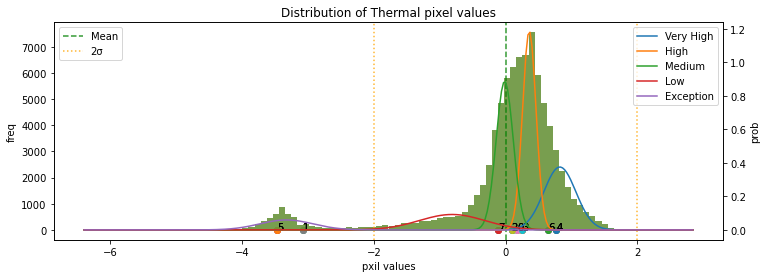

******* end *******
******* start *******
146.jpg
Module type: Multi-Hotspots
Cluster types1: ['High' 'Exception' 'Very High' 'Very High' 'High' 'Very High' 'Very High'
 'High']
Cluster types2: ['Medium' 'Exception' 'Very High' 'Very High' 'High' 'High' 'High'
 'Medium']
Hotspot weights: 0.17450980392156862


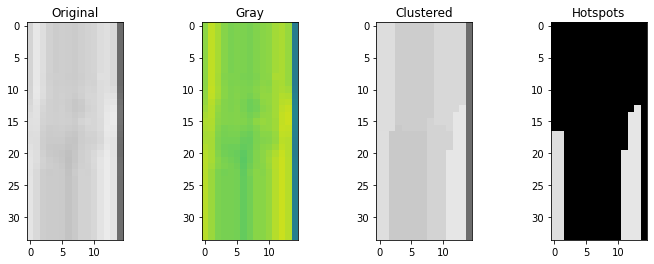

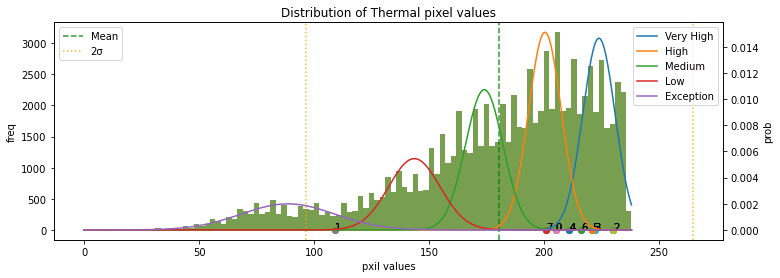

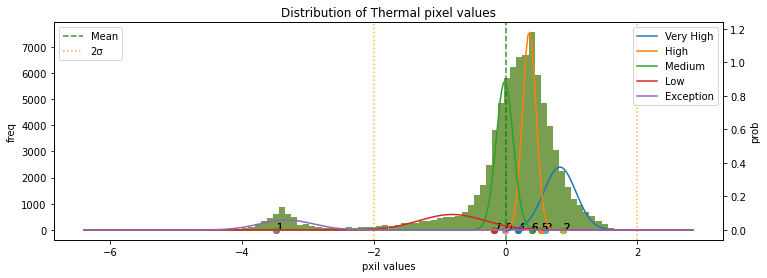

******* end *******
******* start *******
152.jpg
Module type: Multi-Hotspots
Cluster types1: ['Very High' 'High' 'Exception' 'High' 'Low' 'Very High' 'High' 'Medium']
Cluster types2: ['Very High' 'Medium' 'Exception' 'High' 'Low' 'Very High' 'High' 'Low']
Hotspot weights: 0.34375


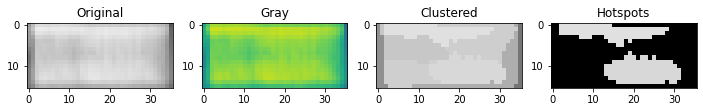

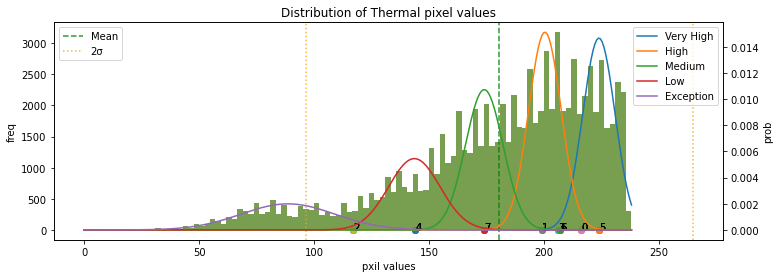

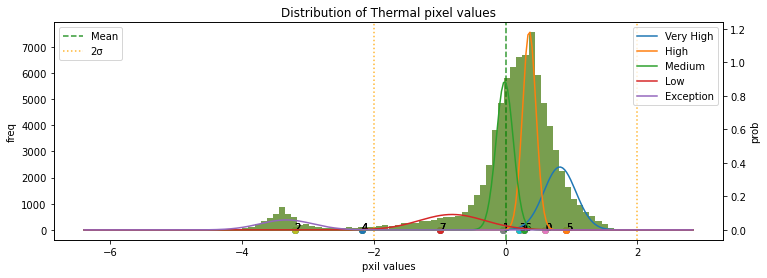

******* end *******
******* start *******
84.jpg
Module type: Normal
Cluster types1: ['Medium' 'Exception' 'High' 'Exception' 'Low' 'Low' 'High' 'Medium']
Cluster types2: ['High' 'Low' 'Very High' 'Low' 'Low' 'Low' 'Very High' 'Medium']
Hotspot weights: 0.0


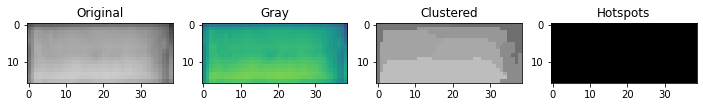

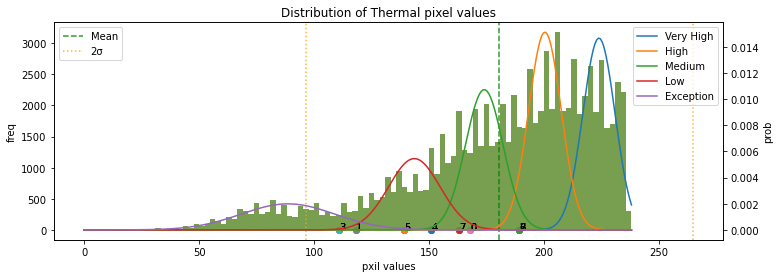

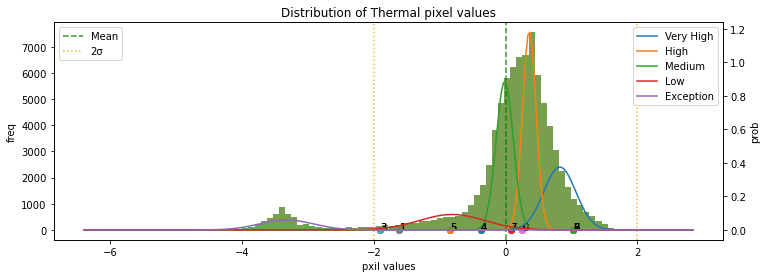

******* end *******
******* start *******
85.jpg
Module type: Normal
Cluster types1: ['Medium' 'Exception' 'High' 'Medium' 'High' 'Medium' 'Medium' 'High']
Cluster types2: ['Medium' 'Exception' 'Very High' 'Medium' 'Very High' 'Low' 'Low'
 'Very High']
Hotspot weights: 0.0


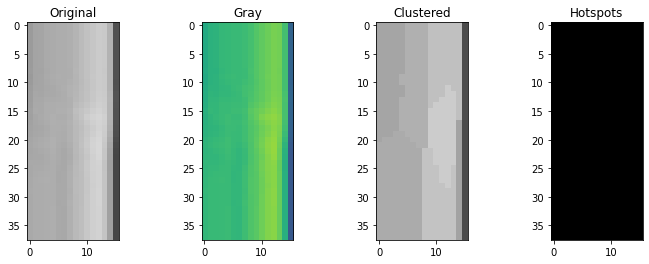

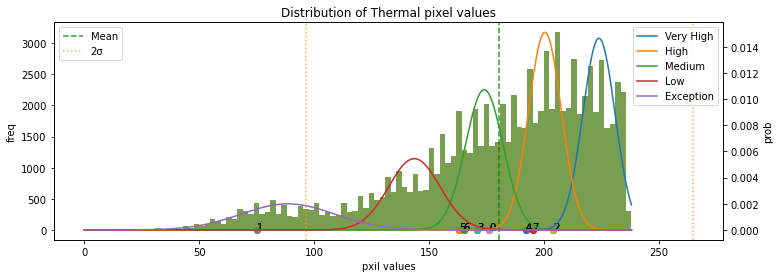

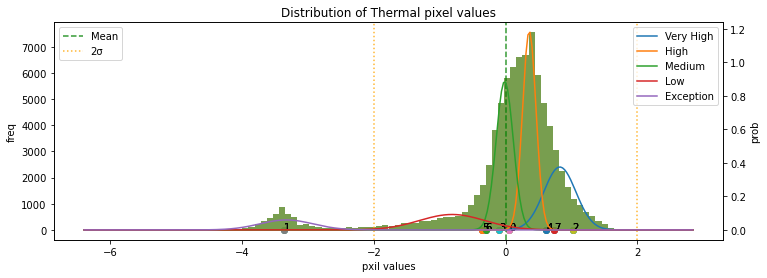

******* end *******
******* start *******
153.jpg
Module type: Normal
Cluster types1: ['Medium' 'Low' 'High' 'Medium' 'Medium' 'Low' 'Exception' 'High']
Cluster types2: ['Medium' 'Low' 'Very High' 'Medium' 'Medium' 'Low' 'Exception'
 'Very High']
Hotspot weights: 0.0


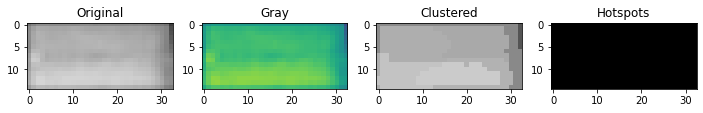

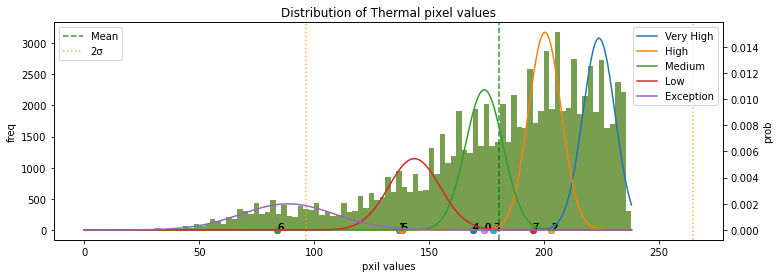

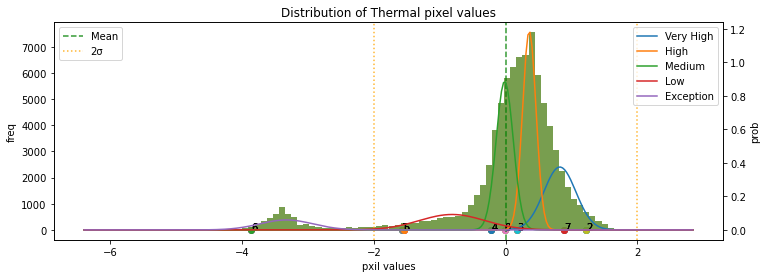

******* end *******
******* start *******
147.jpg
Module type: Multi-Hotspots
Cluster types1: ['Very High' 'Exception' 'High' 'Very High' 'Very High' 'Very High' 'High'
 'Exception']
Cluster types2: ['High' 'Exception' 'Medium' 'Very High' 'Very High' 'High' 'Medium'
 'Exception']
Hotspot weights: 0.2222222222222222


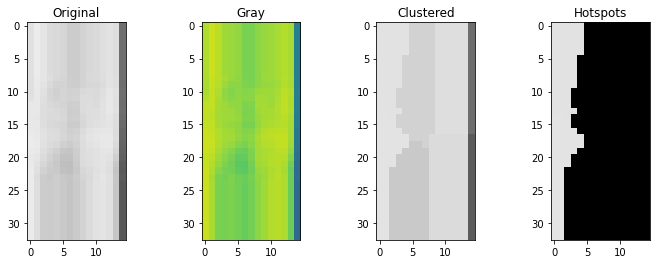

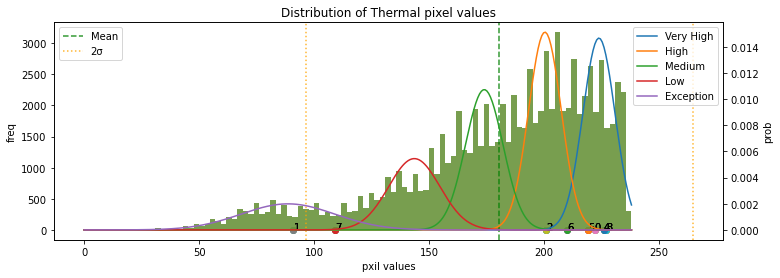

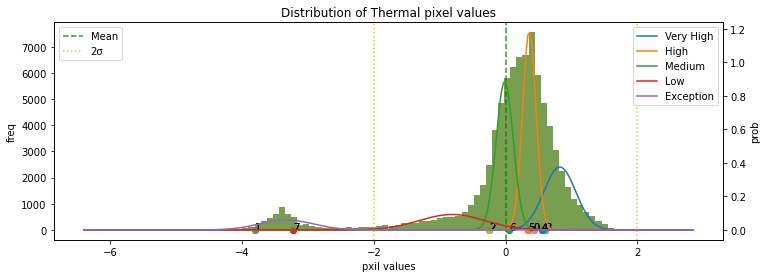

******* end *******
******* start *******
52.jpg
Module type: Normal
Cluster types1: ['High' 'Exception' 'High' 'High' 'High' 'High' 'High' 'High']
Cluster types2: ['High' 'Exception' 'Medium' 'Medium' 'Medium' 'Very High' 'Very High'
 'Very High']
Hotspot weights: 0.0


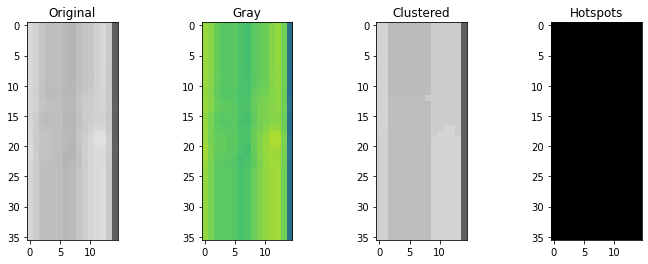

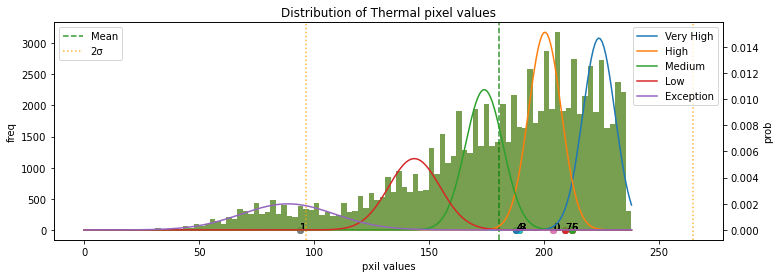

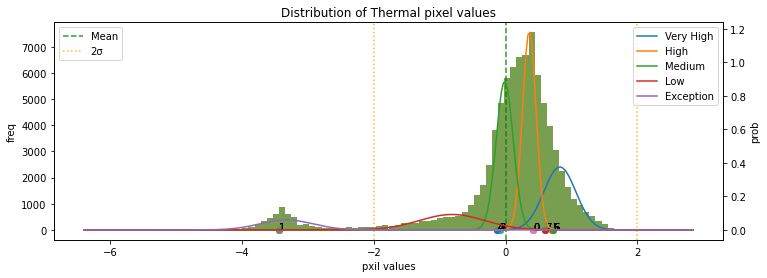

******* end *******
******* start *******
0.jpg
Module type: Normal
Cluster types1: ['Exception' 'Exception' 'Exception' 'Exception' 'Exception' 'Exception'
 'Exception' 'Exception']
Cluster types2: ['High' 'Exception' 'Medium' 'High' 'Medium' 'Exception' 'Very High'
 'High']
Hotspot weights: 0.0


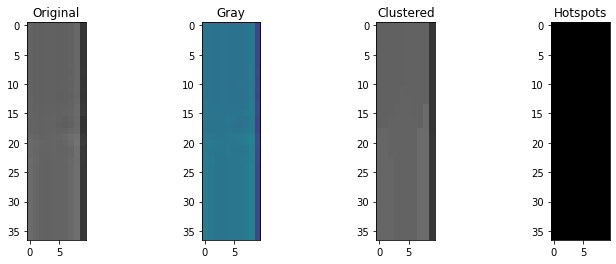

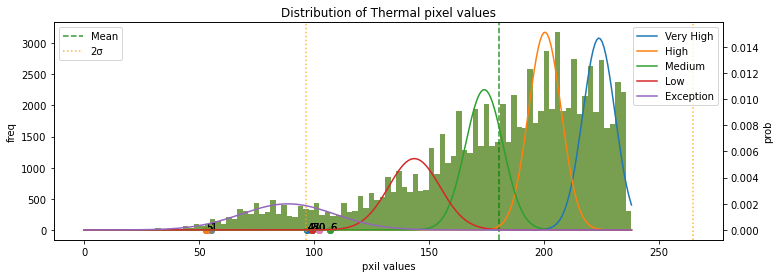

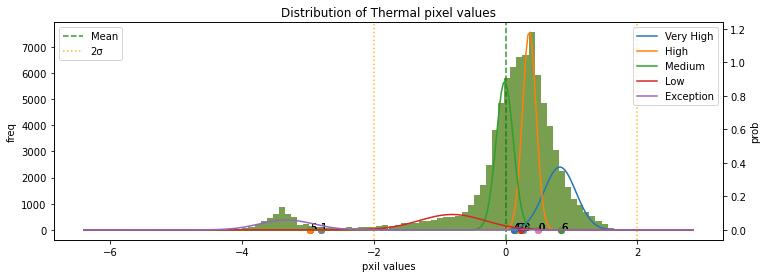

******* end *******
******* start *******
46.jpg
Module type: Normal
Cluster types1: ['Medium' 'Exception' 'Medium' 'Medium' 'Medium' 'Medium' 'Medium'
 'Medium']
Cluster types2: ['Very High' 'Exception' 'High' 'Medium' 'High' 'Medium' 'Medium' 'High']
Hotspot weights: 0.0


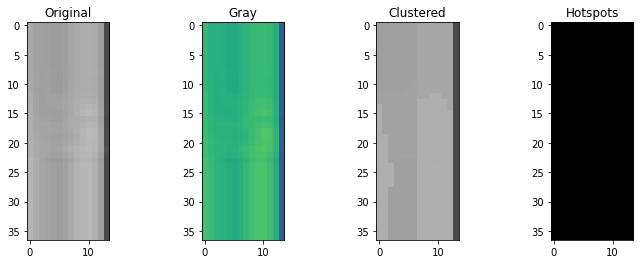

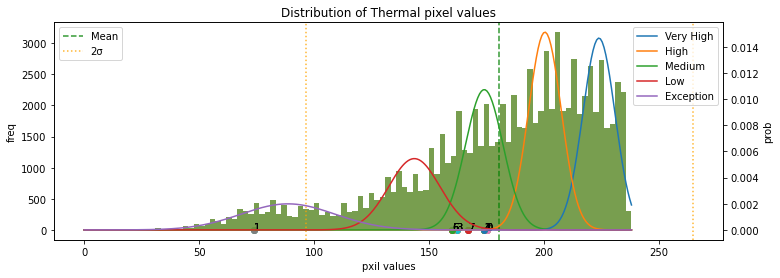

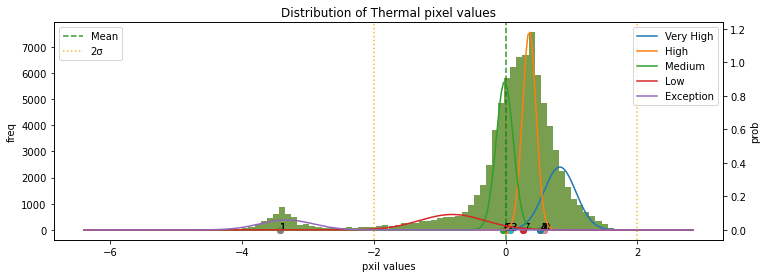

******* end *******
******* start *******
190.jpg
Module type: Normal
Cluster types1: ['Very High' 'Exception' 'Very High' 'Very High' 'Very High' 'Very High'
 'Very High' 'Exception']
Cluster types2: ['High' 'Exception' 'High' 'High' 'Medium' 'High' 'Medium' 'Exception']
Hotspot weights: 0.0


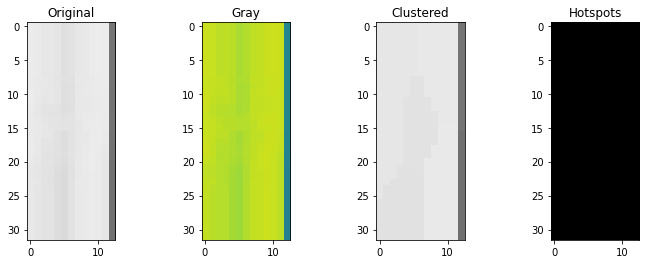

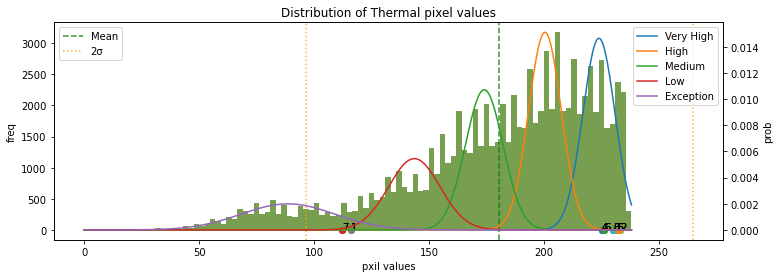

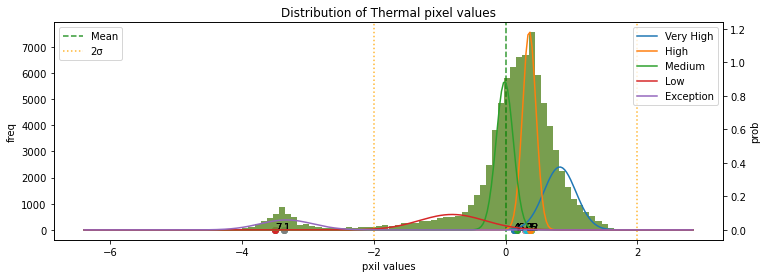

******* end *******
******* start *******
184.jpg
Module type: Normal
Cluster types1: ['Medium' 'Medium' 'Exception' 'Medium' 'Medium' 'Exception' 'Medium'
 'Medium']
Cluster types2: ['Medium' 'High' 'Exception' 'Medium' 'Very High' 'Exception' 'Medium'
 'High']
Hotspot weights: 0.0


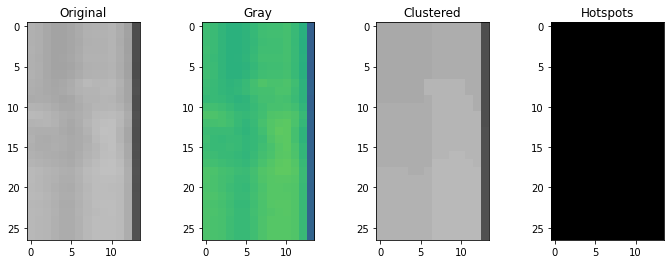

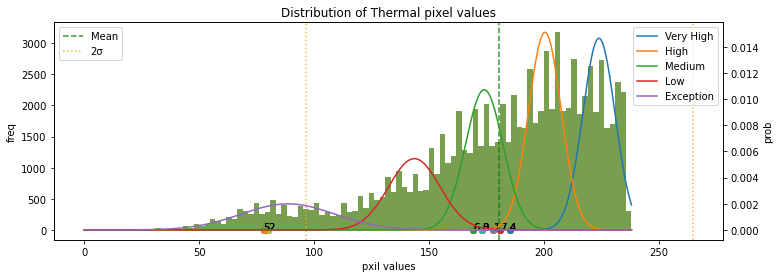

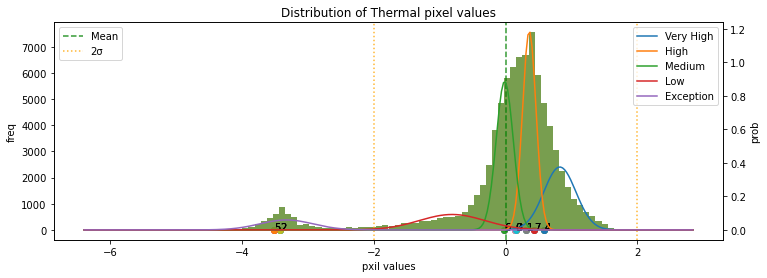

******* end *******


In [28]:
#for k in list(data.temperature.keys())[1:10]:
for k in list(data.temperature.keys()):    
    print("******* start *******")
    print(k)
    # -- kmeans ---
    clusters = clustering.TemperatureClusters(data.scaled_temperature_with_index[k], n_clusters=8)
    clusters_temperature = clusters.get_clusters_data(data.temperature[k])
    centers_temperature = np.stack([np.uint8(t.mean(axis=0)) for t in clusters_temperature])
    scaled_clusters_temperature = clusters.get_clusters_data(data.scaled_temperature[k])
    scaled_centers_temperature = np.stack([t.mean(axis=0) for t in scaled_clusters_temperature ])
    # -- gmm -- 
    predicted_classes1 = gmm1.predict(centers_temperature)
    predicted_classes2 = gmm2.predict(scaled_centers_temperature)
    cluster_types1 = np.array([ gmm1.index2class[c] for c in predicted_classes1 ])
    cluster_types2 = np.array([ gmm2.index2class[c] for c in predicted_classes2 ])    
    hot_clusters = (cluster_types1 == "Very High") & (cluster_types2 == "Very High")
    # -- anomaly type --
    hot_pixels1 = np.array([ gmm1.index2class[c] =="Very High" for c in predicted_classes1[clusters.labels] ])
    hot_pixels2 = np.array([ gmm2.index2class[c] =="Very High" for c in predicted_classes2[clusters.labels] ])
    hot_pixels = hot_pixels1 * hot_pixels2
    hot_pixels = hot_pixels.reshape(*thermal_img_files[k].shape[:2],1)  
    module_type = anomaly_detection.detect_module_type(hot_clusters, hot_pixels)
    # -- save anomaly modules --
    if module_type not in anomaly_modules:
        anomaly_modules[module_type] = [k]
    else:
        anomaly_modules[module_type].append(k)
    print("Module type:", module_type)
    print("Cluster types1:",cluster_types1)
    print("Cluster types2:",cluster_types2)    
    print("Hotspot weights:",hot_pixels.mean())
    # -- display -- 
    img_clustered = centers_temperature[clusters.labels] 
    img_clustered = img_clustered.reshape(thermal_img_files[k].shape)
    img_hotspots = img_clustered * hot_pixels
    display.display_modules({
        "Original": thermal_img_files[k], 
        "Gray": thermal_img_files_gray[k],
        "Clustered": img_clustered,
        "Hotspots": img_hotspots,
    })
    display.display_distributions(
        data.all_temperature, 
        filepath = "./hist/hist_" + k,
        cluster_centers = centers_temperature,
        gmm = gmm1
    )
    display.display_distributions(
        data.scaled_all_temperature, 
        filepath = "./hist/scaled_hist_" + k,
        cluster_centers = scaled_centers_temperature,
        gmm = gmm2
    )    
    print("******* end *******")

In [29]:
import pandas as pd
for k, v in anomaly_modules.items():
    pd.DataFrame(v,columns=[k]).to_csv("modules_{}.csv".format(k),index=False)

In [30]:
#ToDo
## 異常部分へのマーキング（赤で囲む）
## 分類モデルの改良